In [2]:
# Connecting Google Drive to Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
import math
import numpy as np
import collections
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model
import matplotlib.pyplot as plt
from keras.models import Sequential
from tensorflow.keras.backend import clear_session
import xgboost as xgb
from sklearn.utils import resample
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import warnings
warnings.filterwarnings("ignore")

import random
SEED = 42
os.environ['PYTHONHASHSEED'] = str(SEED)
np.random.seed(SEED)                      # NumPy random seed
tf.random.set_seed(SEED)                  # TensorFlow random seed
random.seed(SEED)                         # Python random seed

# TensorFlow session configuration for reproducibility, without setting the session explicitly
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
session_conf.gpu_options.allow_growth = True

# Exploratery Data Analysis

## 3. UJIIndoorLoc Dataset



In [ ]:
import os
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
import math
import numpy as np
import collections
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model
import matplotlib.pyplot as plt
from keras.models import Sequential
from tensorflow.keras.backend import clear_session
from scipy.stats import skew, kurtosis  # Import skew and kurtosis

from sklearn.utils import resample
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report, accuracy_score

# Set seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)


### building 0

In [ ]:
# Load your training and validation datasets
path_train = "/content/drive/MyDrive/ILS Models/0 Single building ujiindoorloc/building0/UjiindoorLoc_building_0/train_building_0.csv"

data = pd.read_csv(path_train)
# data.replace(100, -105, inplace=True)
# data.head()

In [ ]:
# Identify columns
rssi_columns = [col for col in data.columns if "WAP" in col]  # RSSI features
coordinate_columns = ["LONGITUDE", "LATITUDE"]
floor_column = "FLOOR"
building_column = "BUILDINGID"

# Summary of RSSI data
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



RSSI Data Summary:
             WAP001       WAP002  WAP003  WAP004  WAP005  WAP006       WAP007  \
count  5249.000000  5249.000000  5249.0  5249.0  5249.0  5249.0  5249.000000   
mean     99.330158    99.319870   100.0   100.0   100.0   100.0    79.997142   
std      11.420280    11.285783     0.0     0.0     0.0     0.0    56.996244   
min     -97.000000   -90.000000   100.0   100.0   100.0   100.0   -99.000000   
25%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
50%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
75%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
max     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   

            WAP008       WAP009  WAP010  ...  WAP511  WAP512  WAP513  WAP514  \
count  5249.000000  5249.000000  5249.0  ...  5249.0  5249.0  5249.0  5249.0   
mean     95.665079    79.846256   100.0  ...   100.0   100.0   100.0   100.0   
std      28.233764

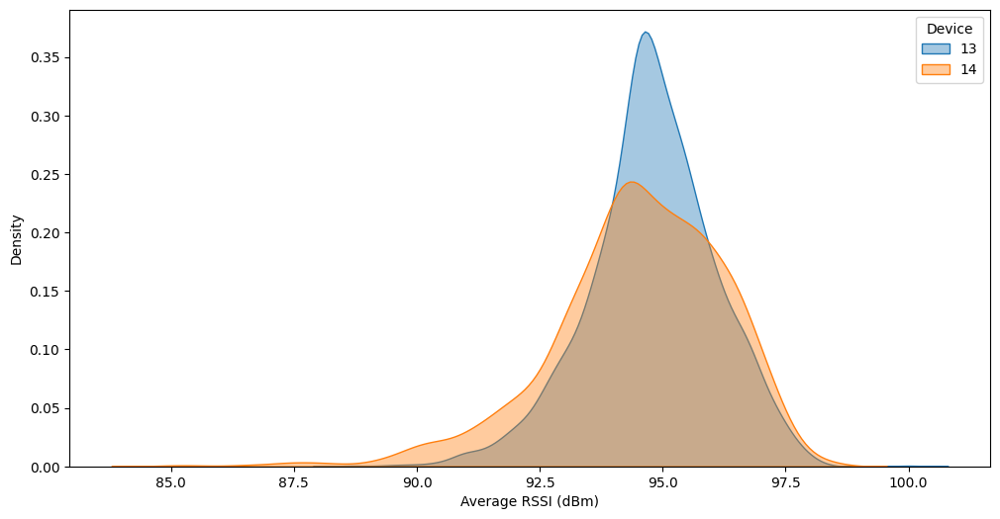

In [ ]:
# KDE (Kernel Density Estimation) Plot

plt.figure(figsize=(12, 6))
for device in data["PHONEID"].unique():
    sns.kdeplot(data[data["PHONEID"] == device][rssi_columns].mean(axis=1), label=device, fill=True, alpha=0.4)

# plt.title("RSSI Distribution Across Different Devices (KDE Plot)")
plt.xlabel("Average RSSI (dBm)")
plt.ylabel("Density")
plt.legend(title="Device")
plt.savefig('rssi_device_kde_b0.png', dpi=300, bbox_inches='tight')

plt.show()


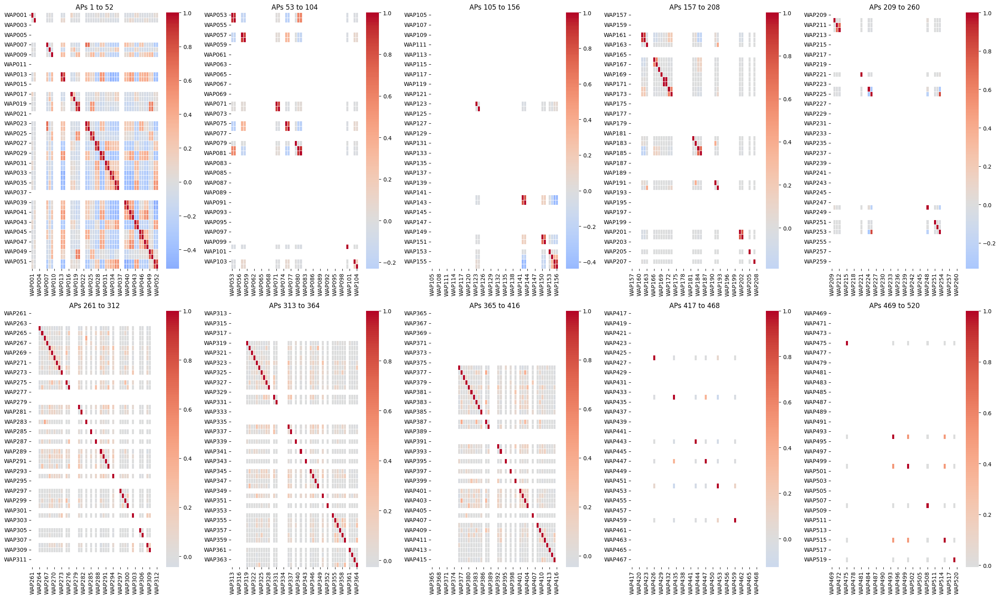

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Compute correlation matrix for RSSI values
corr_matrix = data[rssi_columns].corr()

# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(corr_matrix) // num_segments
if len(corr_matrix) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = corr_matrix.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_data = corr_matrix.loc[segment_aps, segment_aps]  # Slice correlation matrix

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0, linewidths=0.5, ax=ax)

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    # ax.set_xlabel("AP Index")
    # ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.savefig("rssi_correlation_building1.png", dpi=300, bbox_inches="tight")

plt.show()


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["LONGITUDE"].min(), data["LONGITUDE"].max()
y_min, y_max = data["LATITUDE"].min(), data["LATITUDE"].max()

print(f"LONGITUDE_min: {x_min}, LONGITUDE_max: {x_max}")
print(f"LATITUDE_min: {y_min}, LATITUDE_max: {y_max}")


LONGITUDE_min: -7691.338399998844, LONGITUDE_max: -7587.041400000453
LATITUDE_min: 4864897.526100002, LATITUDE_max: 4865016.687799998


In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'WAP' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:

# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'WAP' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -101 dBm
Maximum RSSI: 100 dBm
RSSI Range: 201 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5249 entries, 0 to 5248
Columns: 529 entries, WAP001 to TIMESTAMP
dtypes: float64(2), int64(527)
memory usage: 21.2 MB
None


In [ ]:
# Summary statistics
print(data.describe())

            WAP001       WAP002  WAP003  WAP004  WAP005  WAP006       WAP007  \
count  5249.000000  5249.000000  5249.0  5249.0  5249.0  5249.0  5249.000000   
mean     99.330158    99.319870   100.0   100.0   100.0   100.0    79.997142   
std      11.420280    11.285783     0.0     0.0     0.0     0.0    56.996244   
min     -97.000000   -90.000000   100.0   100.0   100.0   100.0   -99.000000   
25%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
50%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
75%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
max     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   

            WAP008       WAP009  WAP010  ...  WAP520    LONGITUDE  \
count  5249.000000  5249.000000  5249.0  ...  5249.0  5249.000000   
mean     95.665079    79.846256   100.0  ...   100.0 -7639.311545   
std      28.233764    56.475653     0.0  ...     0.0    24.950489   
min

In [ ]:
# Check unique values for categorical columns
# print(f'unique Space: {data["SPACEID"].unique()}')
print(f'unique Floors: {data["FLOOR"].unique()}')
print(f'unique Users:{data["USERID"].unique()}')
print(f'unique Phones:{data["PHONEID"].unique()}')
print(f'unique Relative Positions:{data["RELATIVEPOSITION"].unique()}')

unique Floors: [0 2 1 3]
unique Users:[11  1]
unique Phones:[13 14]
unique Relative Positions:[2 1]


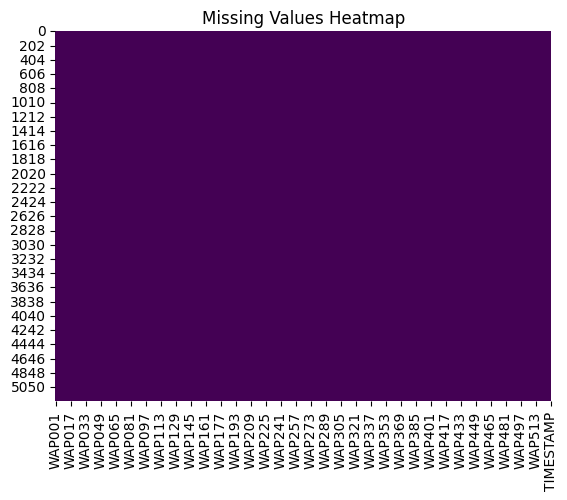

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


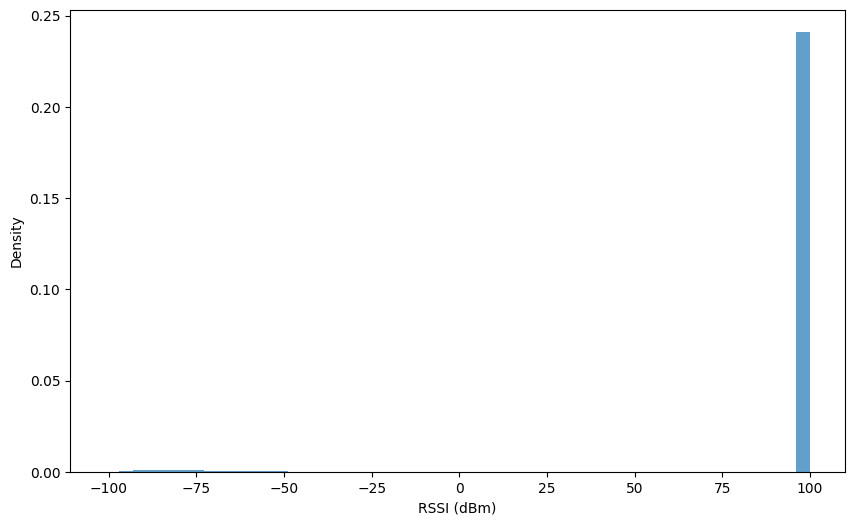

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution building 0")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_building0.png', dpi=300, bbox_inches='tight')
plt.show()

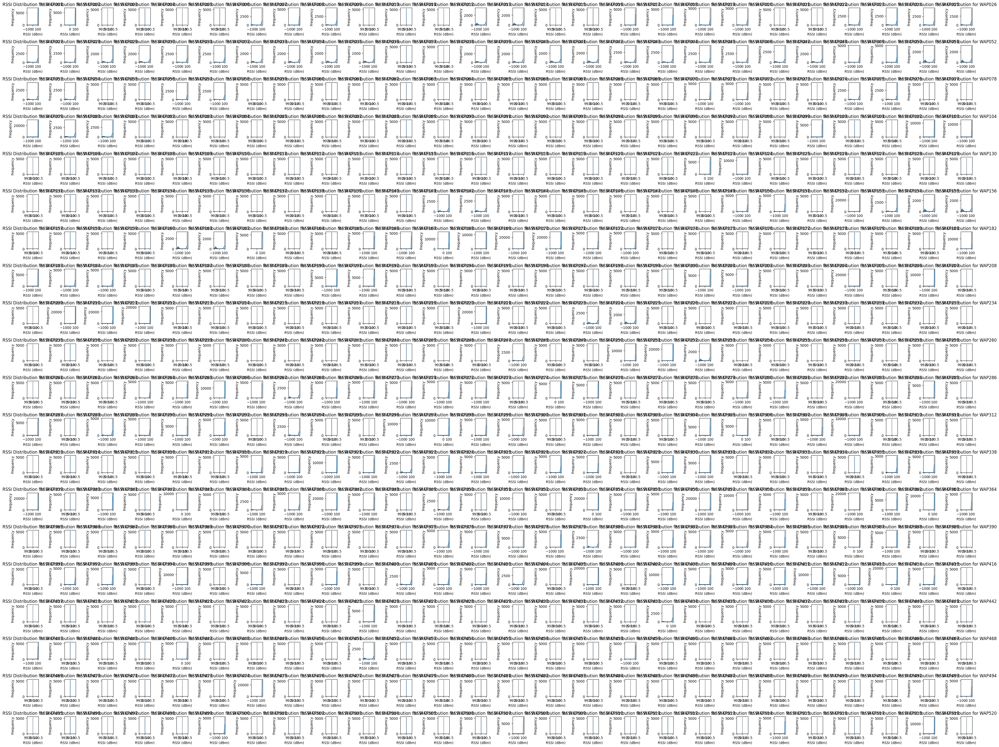

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=20, ncols=26, figsize=(26* 1.5, 20* 1.5))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:520]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
plt.savefig('rssi_distributions_per_wap_b1.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-19-dbf4e3157518>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


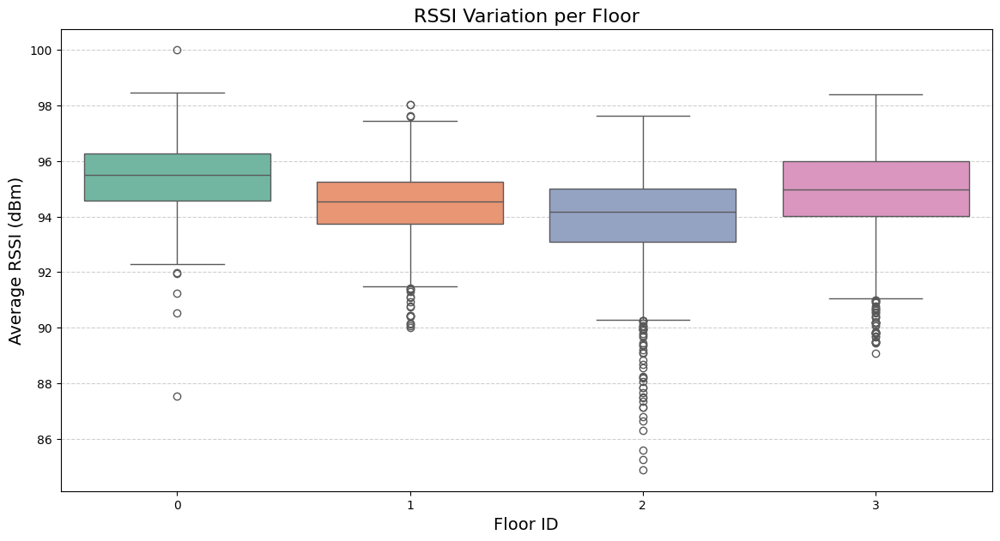

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)   BUILDINGID      SPACEID  RELATIVEPOSITION  USERID      PHONEID     TIMESTAMP
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='FLOOR',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.savefig('rssi_variation_floor_c.png', dpi=300, bbox_inches='tight')
plt.show()

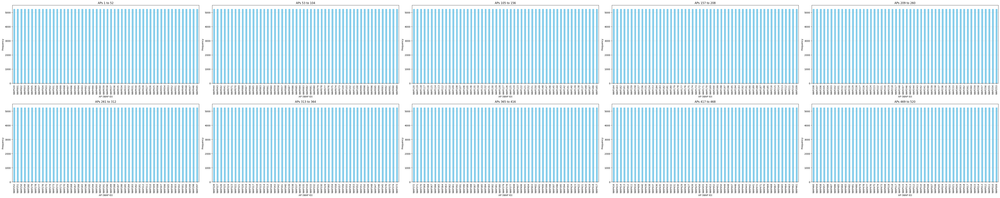

In [ ]:
# AP Utilization & Coverage Analysis
import matplotlib.pyplot as plt
import numpy as np

# Compute AP usage (AP detection frequency)
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

# Define the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(ap_usage) // num_segments
if len(ap_usage) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(60, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = ap_usage.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_values = ap_usage[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    segment_values.plot(kind='bar', color='skyblue', ax=ax)

    # # Annotate bars with values
    # for p in ax.patches:
    #     ax.annotate(
    #         str(int(p.get_height())),
    #         (p.get_x() + p.get_width() / 2., p.get_height()),
    #         ha='center', va='bottom', fontsize=8, xytext=(0, 1),rotation=90,
    #         textcoords='offset points'
    #     )

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_xlabel("AP (WAP ID)")
    ax.set_ylabel("Frequency")
    ax.tick_params(axis='x', rotation=90)
    ax.grid(axis='y', linestyle='--', alpha=0.6)

# Adjust layout for better readability
plt.tight_layout()

# plt.savefig('ap_detection_frequency_b1.png', dpi=300, bbox_inches='tight')
plt.show()

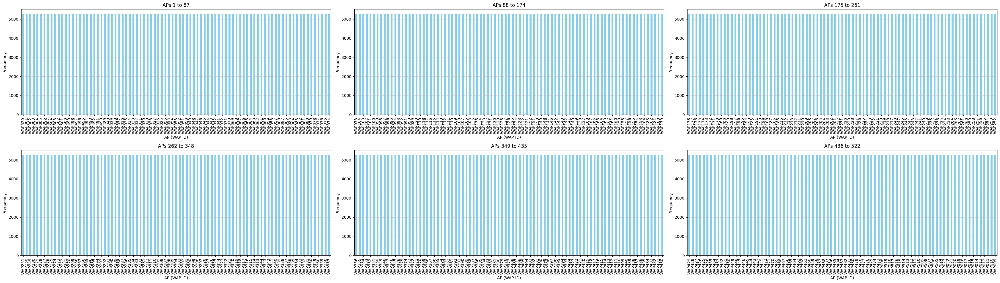

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute AP usage (AP detection frequency)
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

# Define the number of segments (subplots)
num_segments = 6  # Fewer segments for better readability in a paper

# Determine how many APs per segment
aps_per_segment = len(ap_usage) // num_segments
if len(ap_usage) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 3 columns (for better paper formatting)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(35, 10))
axes = axes.flatten()[:num_segments]  # Limit to num_segments

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = ap_usage.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_values = ap_usage[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    segment_values.plot(kind='bar', color='skyblue', ax=ax)

    # # Annotate bars with values
    # for p in ax.patches:
    #     ax.annotate(
    #         str(int(p.get_height())),
    #         (p.get_x() + p.get_width() / 2., p.get_height()),
    #         ha='center', va='bottom', fontsize=9, xytext=(0, 5), rotation=90,
    #         textcoords='offset points'
    #     )

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_xlabel("AP (WAP ID)")
    ax.set_ylabel("Frequency")
    ax.tick_params(axis='x', rotation=90)
    ax.grid(axis='y', linestyle='--', alpha=0.6)

# Remove unused subplots (if any)
for j in range(num_segments, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better readability
plt.tight_layout()

# Save and show
plt.savefig('ap_detection_frequency_b0.png', dpi=300, bbox_inches='tight')
plt.show()


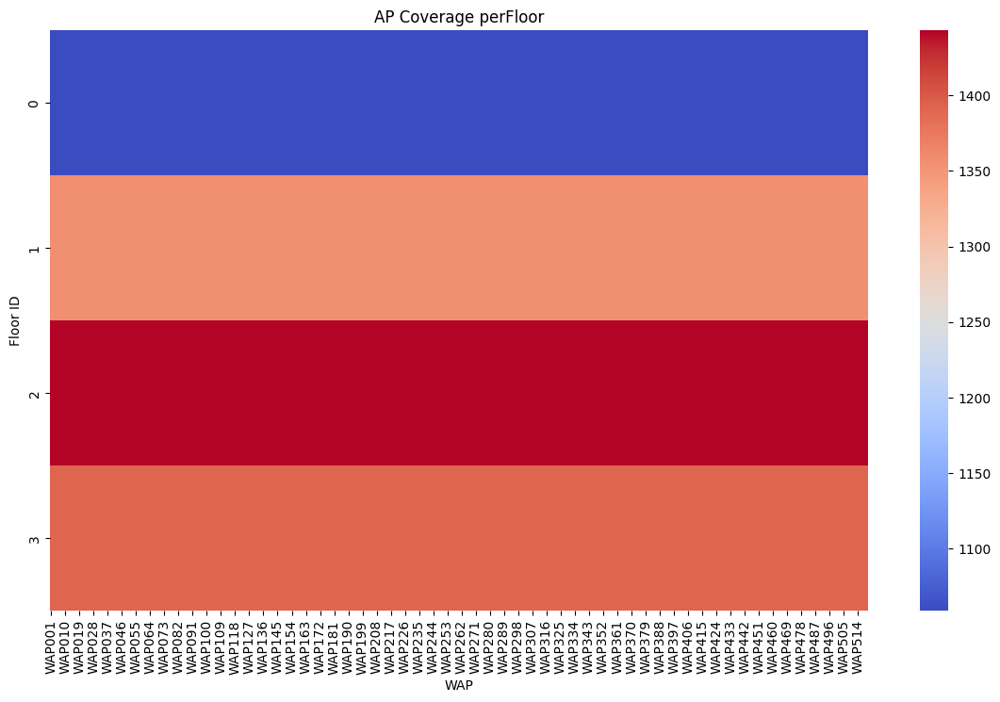

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('FLOOR')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage perFloor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
# plt.savefig('ap_coverage_per_floor_b1.png', dpi=300, bbox_inches='tight')
plt.show()

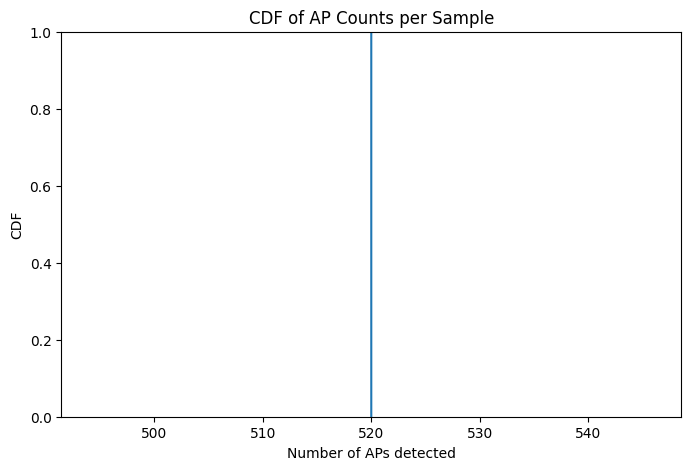

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_c.png', dpi=300, bbox_inches='tight')
plt.show()

Potential Outliers:
       WAP001  WAP002  WAP003  WAP004  WAP005  WAP006  WAP007  WAP008  WAP009  \
0      100.0   100.0     100     100     100     100   100.0   100.0   100.0   
1      100.0   100.0     100     100     100     100   100.0   100.0   100.0   
2      100.0   100.0     100     100     100     100   100.0   100.0   100.0   
3      100.0   100.0     100     100     100     100   100.0   100.0   100.0   
4      100.0   100.0     100     100     100     100   100.0   100.0   100.0   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
5244   100.0   100.0     100     100     100     100   100.0   100.0   100.0   
5245   100.0   100.0     100     100     100     100   100.0   100.0     NaN   
5246   100.0   100.0     100     100     100     100   100.0   100.0     NaN   
5247   100.0   100.0     100     100     100     100   100.0   100.0     NaN   
5248   100.0   100.0     100     100     100     100   100.0   100.0     NaN   

      WAP010  ... 

<ipython-input-33-f9f8947935f0>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-33-f9f8947935f0>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-33-f9f8947935f0>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-33-f9f8947935f0>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-33-f9f8947935f0>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

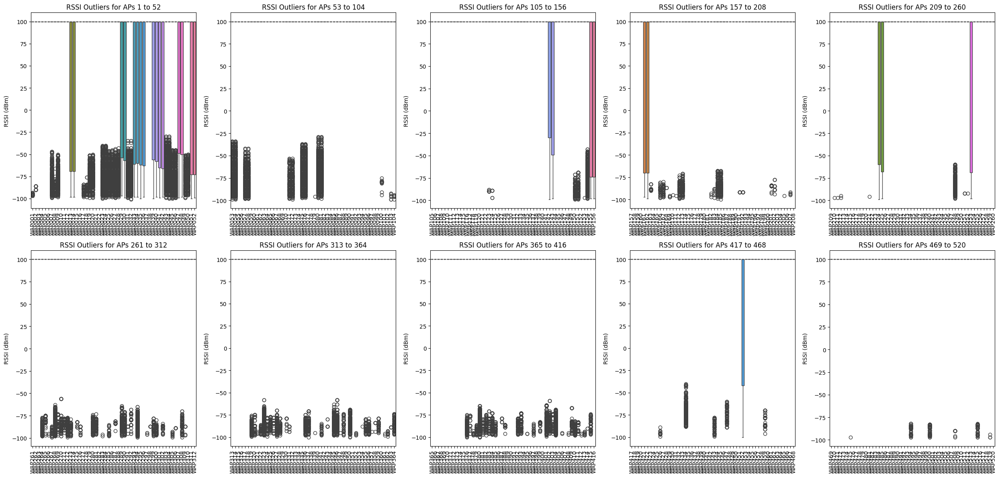

In [ ]:
# Outlier Detection in RSSI Values
dataa = data.copy()
dataa.drop(columns=["TIMESTAMP","LONGITUDE",  "LATITUDE" , "FLOOR"  ,"BUILDINGID",  "SPACEID","RELATIVEPOSITION",  "USERID" , "PHONEID" , "TIMESTAMP"], inplace=True)
# Identify extreme outliers
outliers = dataa[(dataa[rssi_columns] < -100) | (dataa[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)



# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(35, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of RSSI columns
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    sns.boxplot(data=data[segment_aps], ax=ax)

    ax.set_title(f"RSSI Outliers for APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(segment_aps, rotation=90)

# Adjust layout for better readability
plt.tight_layout()

# plt.savefig("rssi_outlier_detection_segmented.png", dpi=300, bbox_inches="tight")
plt.show()




RSSI Data Summary:
             WAP001       WAP002  WAP003  WAP004  WAP005  WAP006       WAP007  \
count  5249.000000  5249.000000  5249.0  5249.0  5249.0  5249.0  5249.000000   
mean     99.330158    99.319870   100.0   100.0   100.0   100.0    79.997142   
std      11.420280    11.285783     0.0     0.0     0.0     0.0    56.996244   
min     -97.000000   -90.000000   100.0   100.0   100.0   100.0   -99.000000   
25%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
50%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
75%     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   
max     100.000000   100.000000   100.0   100.0   100.0   100.0   100.000000   

            WAP008       WAP009  WAP010  ...  WAP511  WAP512  WAP513  WAP514  \
count  5249.000000  5249.000000  5249.0  ...  5249.0  5249.0  5249.0  5249.0   
mean     95.665079    79.846256   100.0  ...   100.0   100.0   100.0   100.0   
std      28.233764

<ipython-input-130-0a626577a243>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-130-0a626577a243>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-130-0a626577a243>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-130-0a626577a243>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-130-0a626577a243>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a F

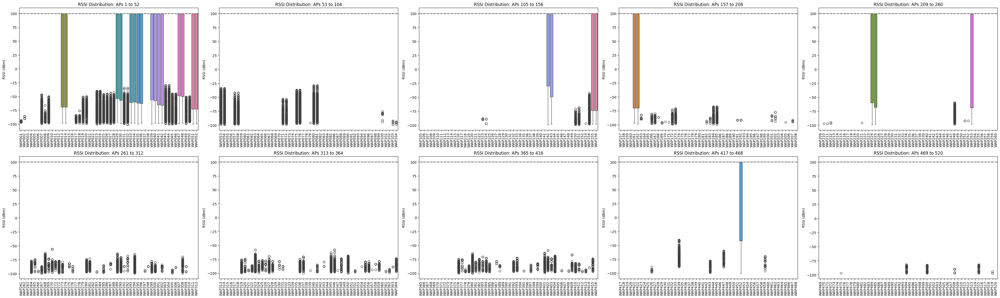

In [ ]:
# RSSI Distribution Across APs

# Summary statistics of RSSI values
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(40, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of RSSI columns
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    sns.boxplot(data=data[segment_aps], ax=ax)

    ax.set_title(f"RSSI Distribution: APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(segment_aps, rotation=90)

# Adjust layout for better readability
plt.tight_layout()

plt.savefig("rssi_distribution_b1.png", dpi=300, bbox_inches="tight")
plt.show()

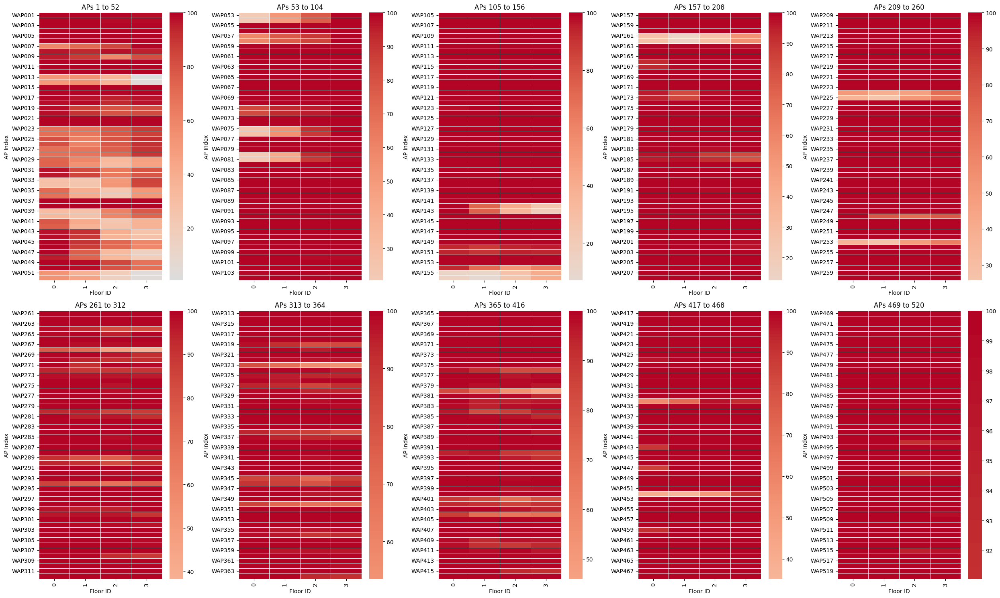

In [ ]:
# Compute mean RSSI per floor and transpose for plotting
coverage_by_floor = data[rssi_columns].groupby(data["FLOOR"]).mean().T

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(coverage_by_floor) // num_segments
if len(coverage_by_floor) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

for i in range(num_segments):
    # Slice the DataFrame for the current segment
    segment_aps = coverage_by_floor.index[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_data = coverage_by_floor.loc[segment_aps]

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0.5, linewidths=0.5, ax=ax)
    ax.set_title(f"APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Floor ID")
    ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


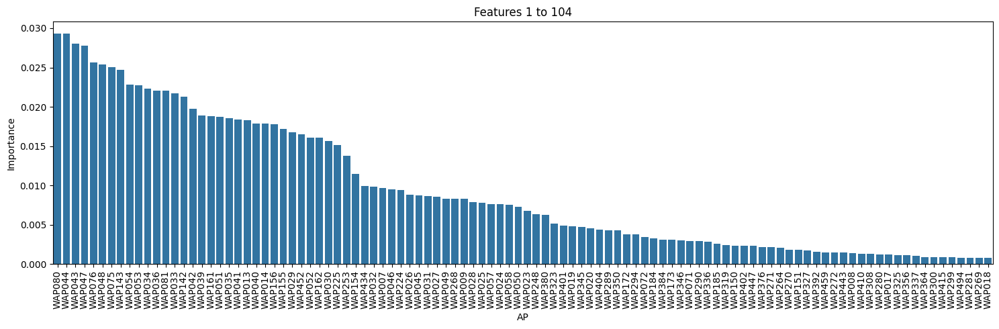

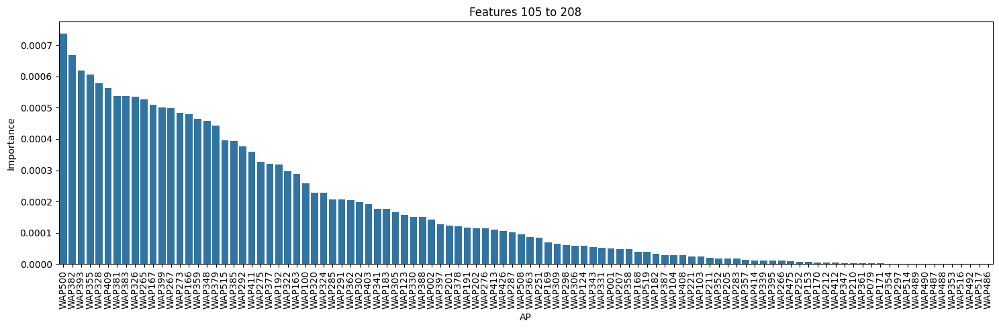

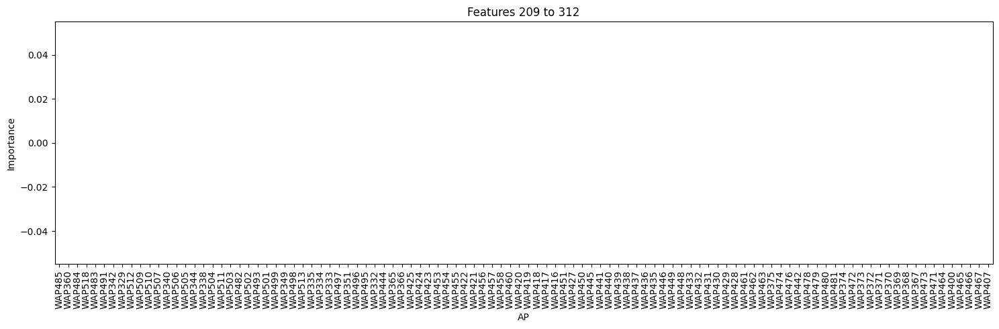

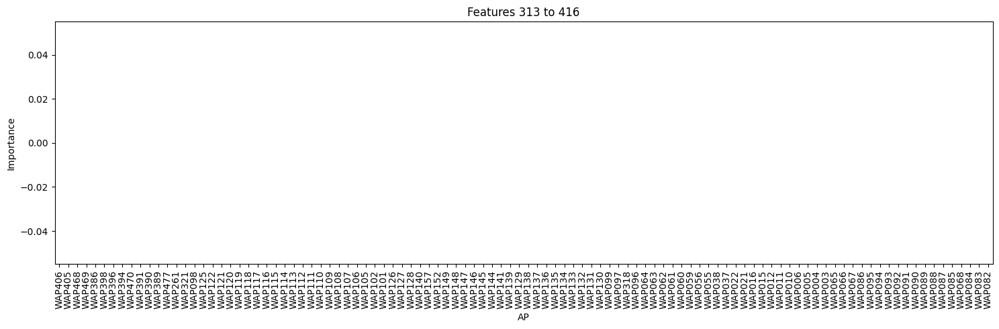

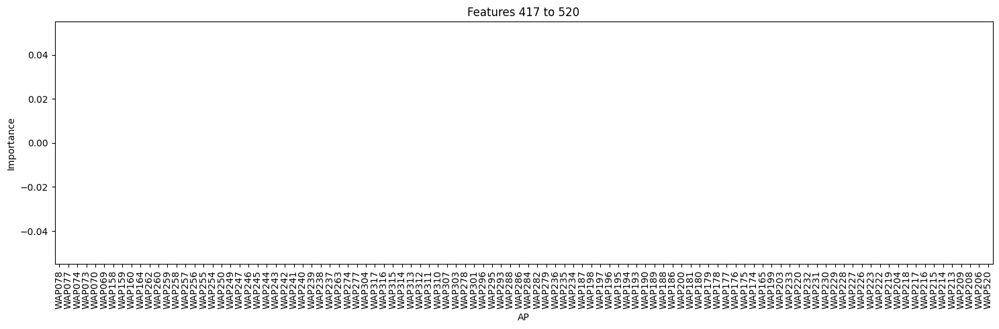

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Prepare dataset
X = data[rssi_columns]  # RSSI values
y = data["FLOOR"]       # Target variable

# Train a simple classifier to get feature importance
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X, y)

# Create a DataFrame for feature importance and sort by importance
fi = pd.DataFrame({
    "AP": rssi_columns,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False).reset_index(drop=True)

# Set the number of segments (separate plots)
num_segments = 5

# Determine how many features per segment (round up if needed)
features_per_segment = math.ceil(len(fi) / num_segments)

# Loop through each segment and plot the barplot in a separate figure
for i in range(num_segments):
    start = i * features_per_segment
    end = (i + 1) * features_per_segment
    seg = fi.iloc[start:end]

    plt.figure(figsize=(15, 5))
    sns.barplot(x="AP", y="importance", data=seg)
    plt.title(f"Features {start + 1} to {min(end, len(fi))}")
    plt.xlabel("AP")
    plt.ylabel("Importance")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


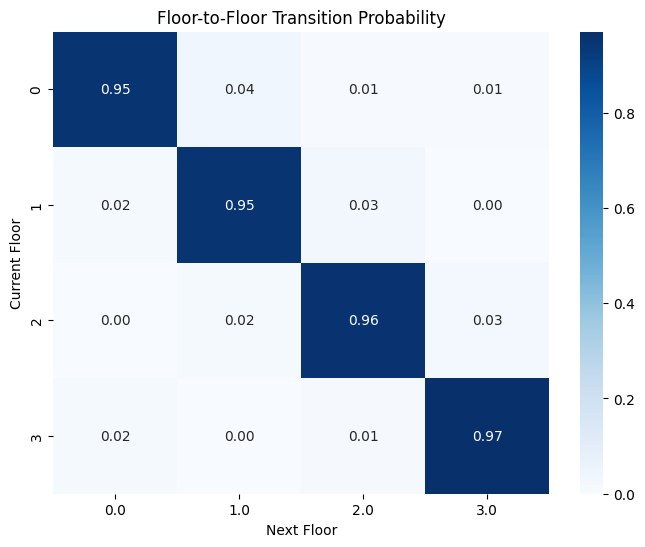

In [ ]:
# Floor-to-Floor Transition Probability (Optional)

import pandas as pd
import seaborn as sns

# Compute floor transition probabilities
floor_transitions = pd.crosstab(data["FLOOR"], data["FLOOR"].shift(-1), normalize='index')

# Plot as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(floor_transitions, annot=True, cmap="Blues", fmt=".2f")
plt.title("Floor-to-Floor Transition Probability")
plt.xlabel("Next Floor")
plt.ylabel("Current Floor")
plt.show()


<ipython-input-65-1503dce404f3>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)


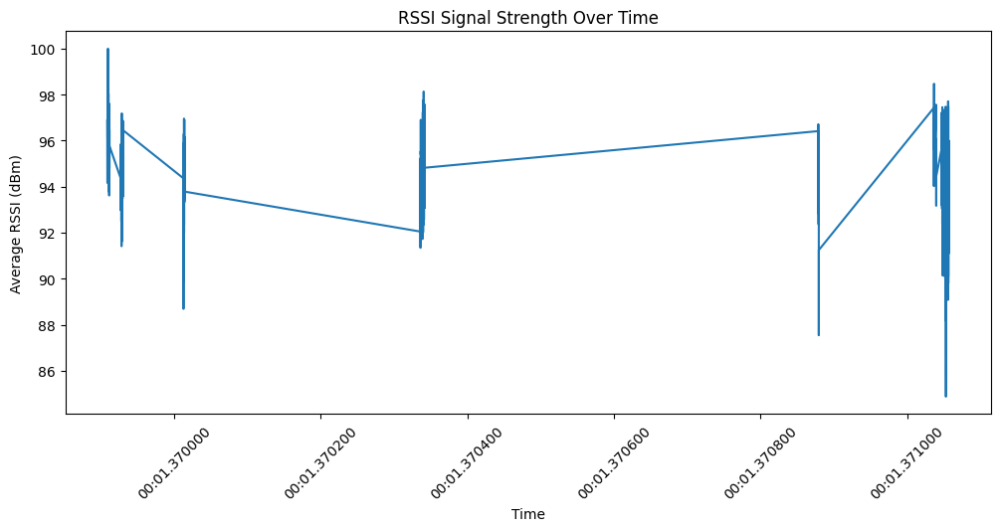

In [ ]:
# Temporal Variability Analysis (if timestamps exist)
# Convert SampleTimes to datetime (if applicable)
data["SampleTimes"] = pd.to_datetime(data["TIMESTAMP"], errors='coerce')

# Plot RSSI variation over time
plt.figure(figsize=(12, 5))
sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)
plt.xticks(rotation=45)
plt.title("RSSI Signal Strength Over Time")
plt.xlabel("Time")
plt.ylabel("Average RSSI (dBm)")
plt.show()


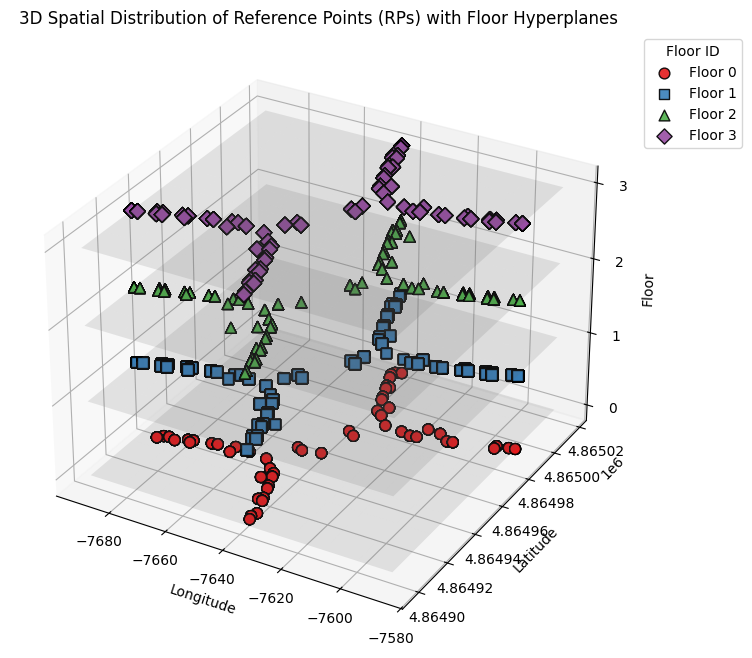

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Convert floors to integer values
data["FLOOR"] = data["FLOOR"].astype(int)

# Create a 3D figure
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111, projection='3d')

# Define a distinct color map for floors using a high-contrast palette
floor_colors = sns.color_palette("Set1", n_colors=data["FLOOR"].nunique())
markers = ["o", "s", "^", "D", "X", "*"]  # More variety in markers

# Plot each floor separately with distinct colors and markers
for i, floor in enumerate(sorted(data["FLOOR"].unique())):
    subset = data[data["FLOOR"] == floor]
    ax.scatter(subset["LONGITUDE"], subset["LATITUDE"], subset["FLOOR"],
               label=f"Floor {floor}", color=floor_colors[i], alpha=0.9,
               edgecolors="k", marker=markers[i % len(markers)], s=60)  # Increase marker size

# Add floor hyperplanes (horizontal shaded planes)
floor_levels = sorted(data["FLOOR"].unique())
for floor in floor_levels:
    x_min, x_max = data["LONGITUDE"].min(), data["LONGITUDE"].max()
    y_min, y_max = data["LATITUDE"].min(), data["LATITUDE"].max()
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 10), np.linspace(y_min, y_max, 10))
    zz = np.full(xx.shape, floor)  # Constant Z height for the floor

    ax.plot_surface(xx, yy, zz, color="gray", alpha=0.15)  # Lighter transparency for better contrast

# Labels and title
ax.set_title("3D Spatial Distribution of Reference Points (RPs) with Floor Hyperplanes")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_zlabel("Floor")

# Adjust ticks to ensure floors are displayed as integers
ax.set_zticks(floor_levels)  # Set integer tick marks on Z-axis

# Add a legend with clear spacing
ax.legend(title="Floor ID", loc="upper right", bbox_to_anchor=(1.2, 1))

# Save figure
plt.savefig("spatial_distribution_building1.png", dpi=300, bbox_inches="tight")
plt.show()


<ipython-input-76-2adcb8a2fe0e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")


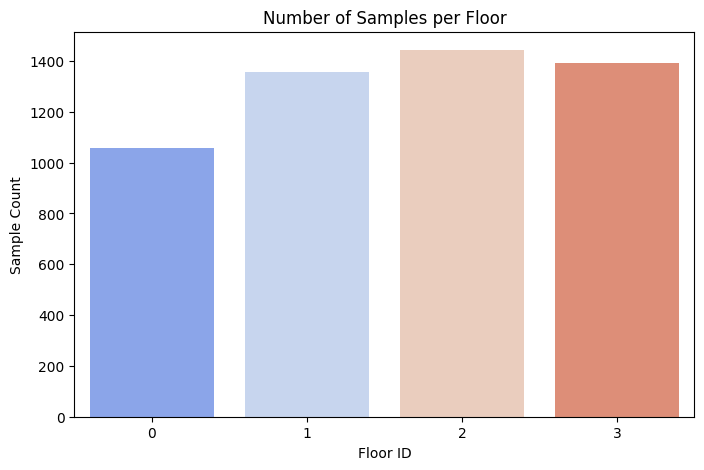

In [ ]:
# Floor Classification Analysis

# Count samples per floor
floor_counts = data["FLOOR"].value_counts()

# Bar chart of samples per floor
plt.figure(figsize=(8, 5))
sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")
plt.title("Number of Samples per Floor")
plt.xlabel("Floor ID")
plt.ylabel("Sample Count")
plt.show()



Devices used for collection: [13 14]


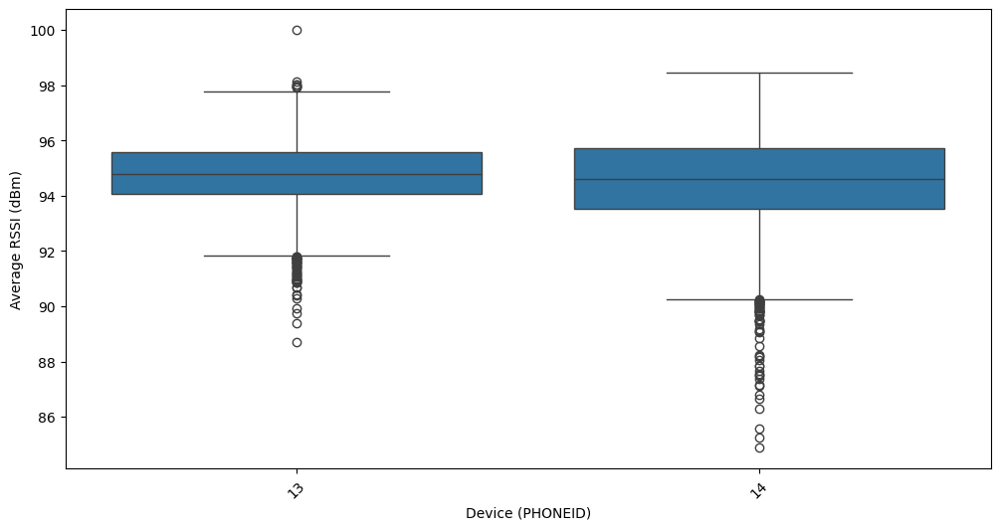

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["PHONEID"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["PHONEID"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
# plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PHONEID)")
plt.ylabel("Average RSSI (dBm)")
plt.savefig("rssi_device_boxplot_building1.png", dpi=300, bbox_inches="tight")

plt.show()



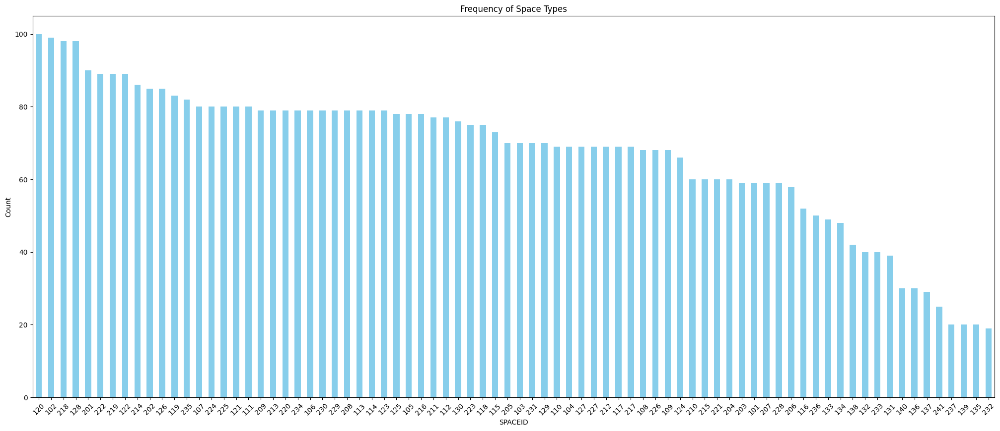

In [ ]:
# Plot the frequency of SceneID   WAP520	LONGITUDE	LATITUDE	FLOOR	BUILDINGID	SPACEID	RELATIVEPOSITION	USERID	PHONEID	TIMESTAMP
scene_counts = data['SPACEID'].value_counts()
scene_counts.plot(kind='bar', figsize=(25, 10), color='skyblue')
plt.title('Frequency of Space Types')
plt.xlabel('SPACEID')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


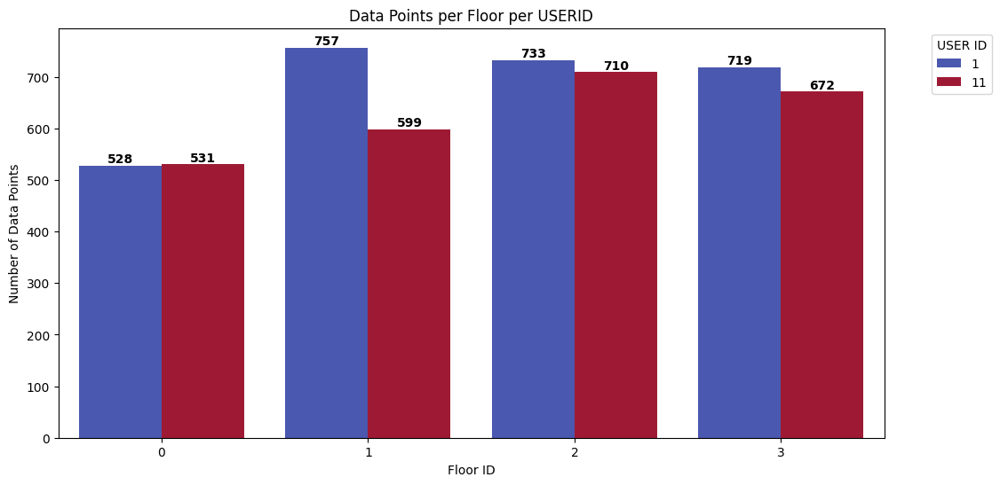

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count data points per FloorID and SceneID
floor_scene_counts = data.groupby(["FLOOR", "USERID"]).size().reset_index(name="Count")

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(x="FLOOR", y="Count", hue="USERID", data=floor_scene_counts, palette="coolwarm")

# Add value labels on bars (only if count > 0)
for p in ax.patches:
    if p.get_height() > 0:  # Ensure only non-zero bars are labeled
        ax.annotate(f"{int(p.get_height())}",
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

# Labels and title
plt.xlabel("Floor ID")
plt.ylabel("Number of Data Points")
plt.title("Data Points per Floor per USERID")
plt.legend(title="USER ID", bbox_to_anchor=(1.05, 1), loc="upper left")

# Show plot
plt.show()


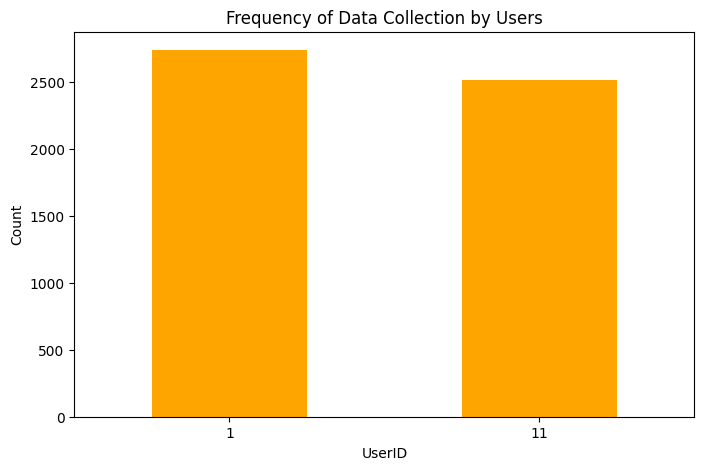

In [ ]:
# UserID distribution
user_counts = data['USERID'].value_counts()
user_counts.plot(kind='bar', figsize=(8, 5), color='orange')
plt.title('Frequency of Data Collection by Users')
plt.xlabel('UserID')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


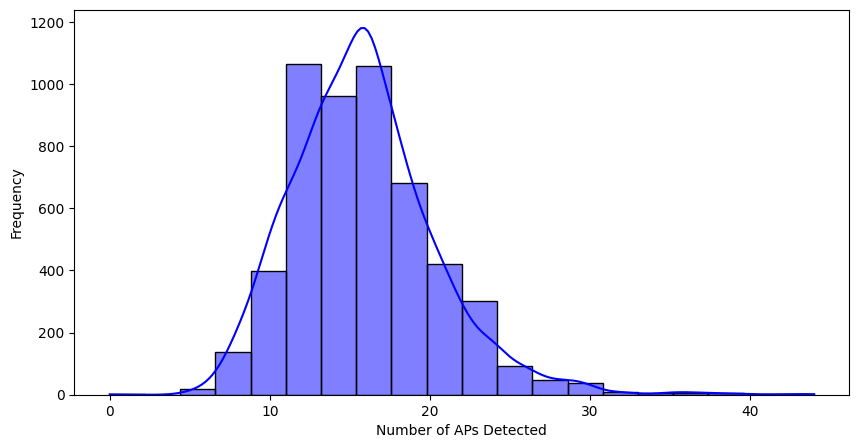

In [ ]:
# Count detected APs per sample (non-zero RSSI values)
rssi_columns = [col for col in data.columns if 'WAP' in col]  # Adjust if necessary

data["AP_count"] = (data[rssi_columns] != 100).sum(axis=1)

# Histogram of AP counts
plt.figure(figsize=(10, 5))
sns.histplot(data["AP_count"], bins=20, kde=True, color="blue")
# plt.title("Distribution of Detected Access Points Per Sample (building 0)")
plt.xlabel("Number of APs Detected")
plt.ylabel("Frequency")
plt.savefig("rssi_distribution_building1.png", dpi=300, bbox_inches="tight")

plt.show()


### Building 1

In [ ]:
# Load your training and validation datasets
path_train =  "/content/drive/MyDrive/ILS Models/0 Single building ujiindoorloc/building1/UjiindoorLoc_building_1/train_building_1.csv"

data = pd.read_csv(path_train)
# data.replace(100, -105, inplace=True)
# data.head()

In [ ]:
# Identify columns
rssi_columns = [col for col in data.columns if "WAP" in col]  # RSSI features
coordinate_columns = ["LONGITUDE", "LATITUDE"]
floor_column = "FLOOR"
building_column = "BUILDINGID"

# Summary of RSSI data
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



RSSI Data Summary:
        WAP001  WAP002  WAP003  WAP004  WAP005       WAP006  WAP007  \
count  5196.0  5196.0  5196.0  5196.0  5196.0  5196.000000  5196.0   
mean    100.0   100.0   100.0   100.0   100.0    90.007313   100.0   
std       0.0     0.0     0.0     0.0     0.0    41.921917     0.0   
min     100.0   100.0   100.0   100.0   100.0   -96.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   

            WAP008  WAP009       WAP010  ...  WAP511  WAP512  WAP513  WAP514  \
count  5196.000000  5196.0  5196.000000  ...  5196.0  5196.0  5196.0  5196.0   
mean     80.667436   100.0    96.791378  ...   100.0   100.0   100.0   100.0   
std      55.948088     0.0    24.595335  ...     0.0     0.0     0.0     0.0   
min     -98.000000   100.0  

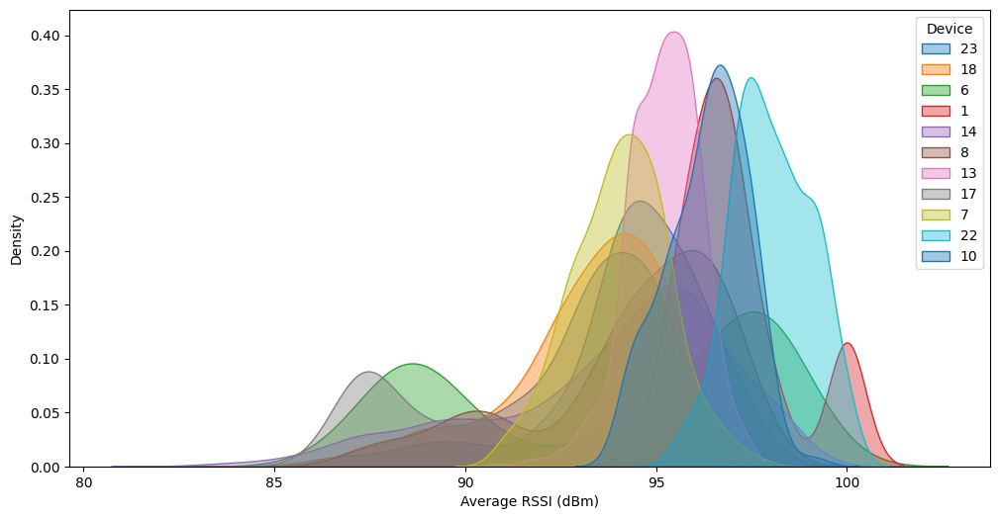

In [ ]:
# KDE (Kernel Density Estimation) Plot

plt.figure(figsize=(12, 6))
for device in data["PHONEID"].unique():
    sns.kdeplot(data[data["PHONEID"] == device][rssi_columns].mean(axis=1), label=device, fill=True, alpha=0.4)

# plt.title("RSSI Distribution Across Different Devices (KDE Plot)")
plt.xlabel("Average RSSI (dBm)")
plt.ylabel("Density")
plt.legend(title="Device")
plt.savefig('rssi_device_kde_b1.png', dpi=300, bbox_inches='tight')

plt.show()


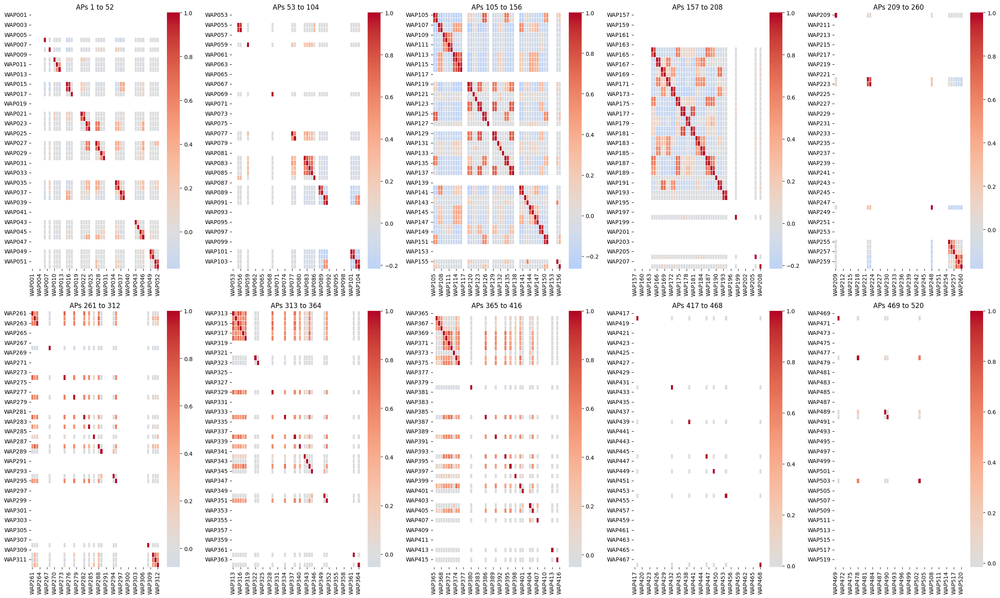

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Compute correlation matrix for RSSI values
corr_matrix = data[rssi_columns].corr()

# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(corr_matrix) // num_segments
if len(corr_matrix) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = corr_matrix.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_data = corr_matrix.loc[segment_aps, segment_aps]  # Slice correlation matrix

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0, linewidths=0.5, ax=ax)

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")

    # ax.set_xlabel("AP Index")
    # ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.savefig("rssi_correlation_building2.png", dpi=300, bbox_inches="tight")

plt.show()


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["LONGITUDE"].min(), data["LONGITUDE"].max()
y_min, y_max = data["LATITUDE"].min(), data["LATITUDE"].max()

print(f"LONGITUDE_min: {x_min}, LONGITUDE_max: {x_max}")
print(f"LATITUDE_min: {y_min}, LATITUDE_max: {y_max}")


LONGITUDE_min: -7578.46197155118, LONGITUDE_max: -7404.491683006287
LATITUDE_min: 4864810.030100003, LATITUDE_max: 4864959.505251184


In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'WAP' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:

# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'WAP' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -103 dBm
Maximum RSSI: 100 dBm
RSSI Range: 203 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5196 entries, 0 to 5195
Columns: 529 entries, WAP001 to TIMESTAMP
dtypes: float64(2), int64(527)
memory usage: 21.0 MB
None


In [ ]:
# Summary statistics
print(data.describe())

       WAP001  WAP002  WAP003  WAP004  WAP005       WAP006  WAP007  \
count  5196.0  5196.0  5196.0  5196.0  5196.0  5196.000000  5196.0   
mean    100.0   100.0   100.0   100.0   100.0    90.007313   100.0   
std       0.0     0.0     0.0     0.0     0.0    41.921917     0.0   
min     100.0   100.0   100.0   100.0   100.0   -96.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   

            WAP008  WAP009       WAP010  ...  WAP520    LONGITUDE  \
count  5196.000000  5196.0  5196.000000  ...  5196.0  5196.000000   
mean     80.667436   100.0    96.791378  ...   100.0 -7488.679411   
std      55.948088     0.0    24.595335  ...     0.0    49.633525   
min     -98.000000   100.0   -99.000000  ...   100.0 -7578.461972   
25%     100.000000   100

In [ ]:
# Check unique values for categorical columns
# print(f'unique Space: {data["SPACEID"].unique()}')
print(f'unique Floors: {data["FLOOR"].unique()}')
print(f'unique Users:{data["USERID"].unique()}')
print(f'unique Phones:{data["PHONEID"].unique()}')
print(f'unique Relative Positions:{data["RELATIVEPOSITION"].unique()}')

unique Floors: [2 0 1 3]
unique Users:[ 2  4  7  8  9 16 10 11 13 14 17 18]
unique Phones:[23 18  6  1 14  8 13 17  7 22 10]
unique Relative Positions:[2 1]


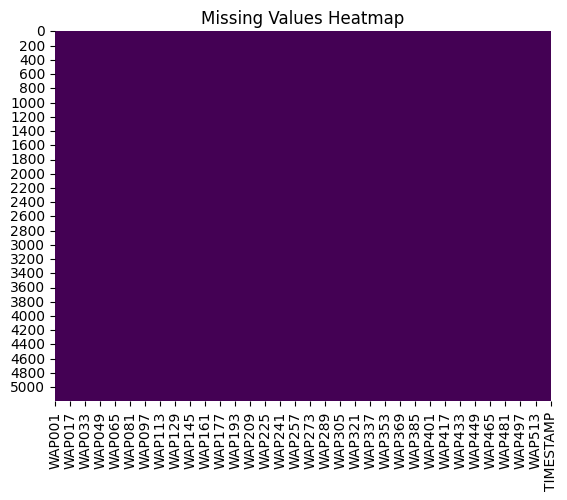

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


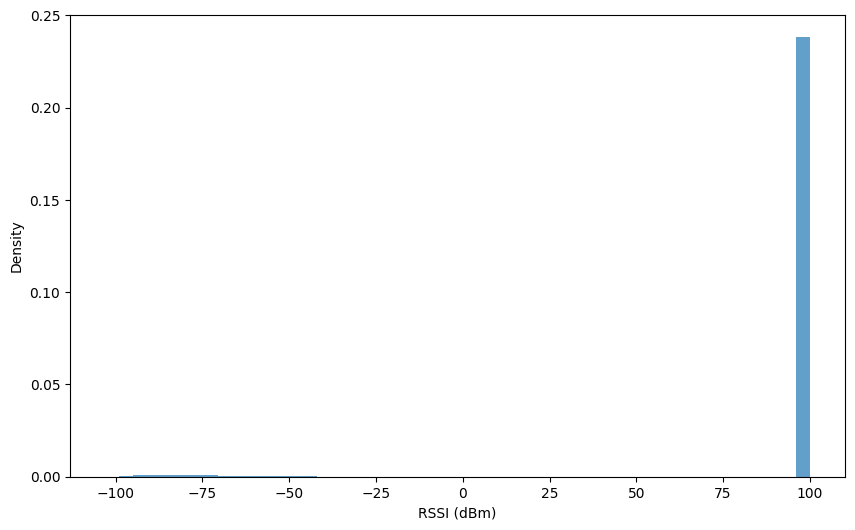

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution building 1")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_building1.png', dpi=300, bbox_inches='tight')
plt.show()

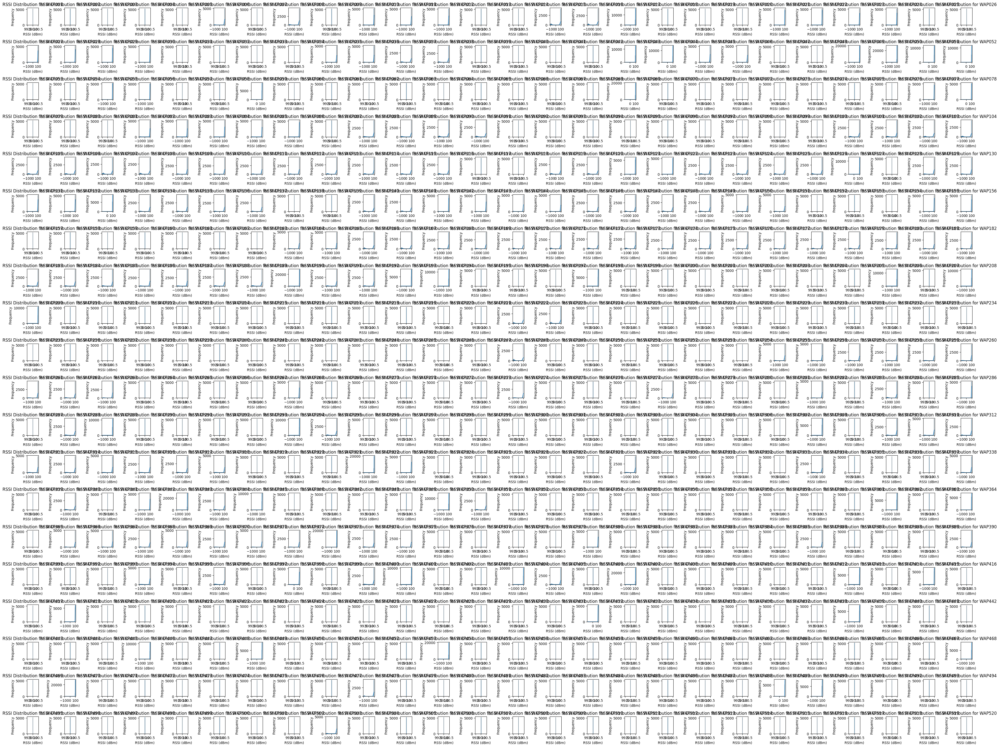

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=20, ncols=26, figsize=(26* 1.5, 20* 1.5))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:520]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
# plt.savefig('rssi_distributions_per_wap_b2.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-51-3b03a268139a>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


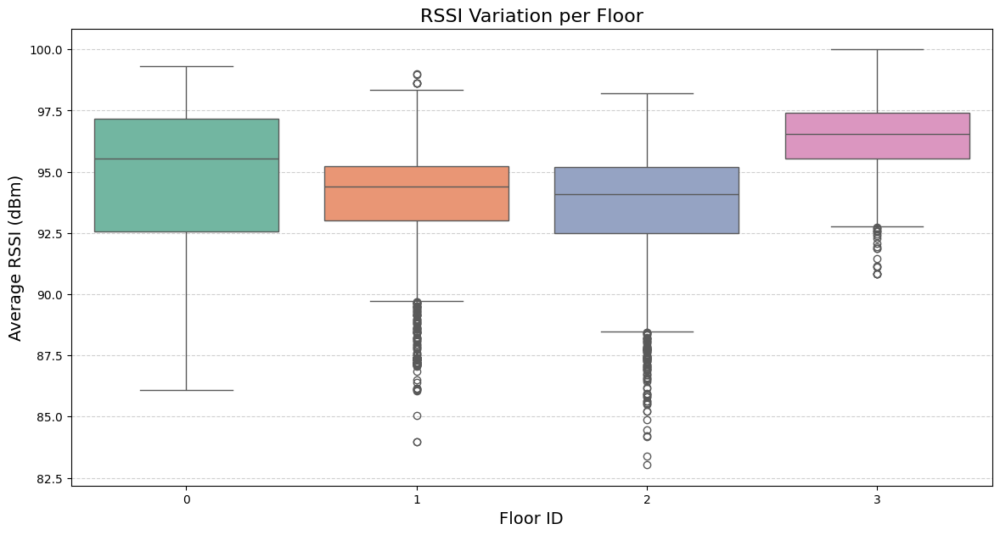

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)   BUILDINGID      SPACEID  RELATIVEPOSITION  USERID      PHONEID     TIMESTAMP
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='FLOOR',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
# plt.savefig('rssi_variation_floor_b2.png', dpi=300, bbox_inches='tight')
plt.show()

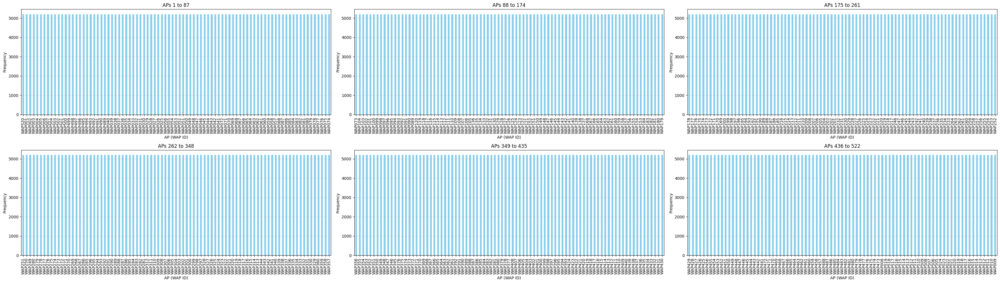

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute AP usage (AP detection frequency)
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

# Define the number of segments (subplots)
num_segments = 6  # Fewer segments for better readability in a paper

# Determine how many APs per segment
aps_per_segment = len(ap_usage) // num_segments
if len(ap_usage) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 3 columns (for better paper formatting)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(35, 10))
axes = axes.flatten()[:num_segments]  # Limit to num_segments

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = ap_usage.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_values = ap_usage[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    segment_values.plot(kind='bar', color='skyblue', ax=ax)

    # # Annotate bars with values
    # for p in ax.patches:
    #     ax.annotate(
    #         str(int(p.get_height())),
    #         (p.get_x() + p.get_width() / 2., p.get_height()),
    #         ha='center', va='bottom', fontsize=9, xytext=(0, 5), rotation=90,
    #         textcoords='offset points'
    #     )

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_xlabel("AP (WAP ID)")
    ax.set_ylabel("Frequency")
    ax.tick_params(axis='x', rotation=90)
    ax.grid(axis='y', linestyle='--', alpha=0.6)

# Remove unused subplots (if any)
for j in range(num_segments, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better readability
plt.tight_layout()

# Save and show
plt.savefig('ap_detection_frequency_b1.png', dpi=300, bbox_inches='tight')
plt.show()


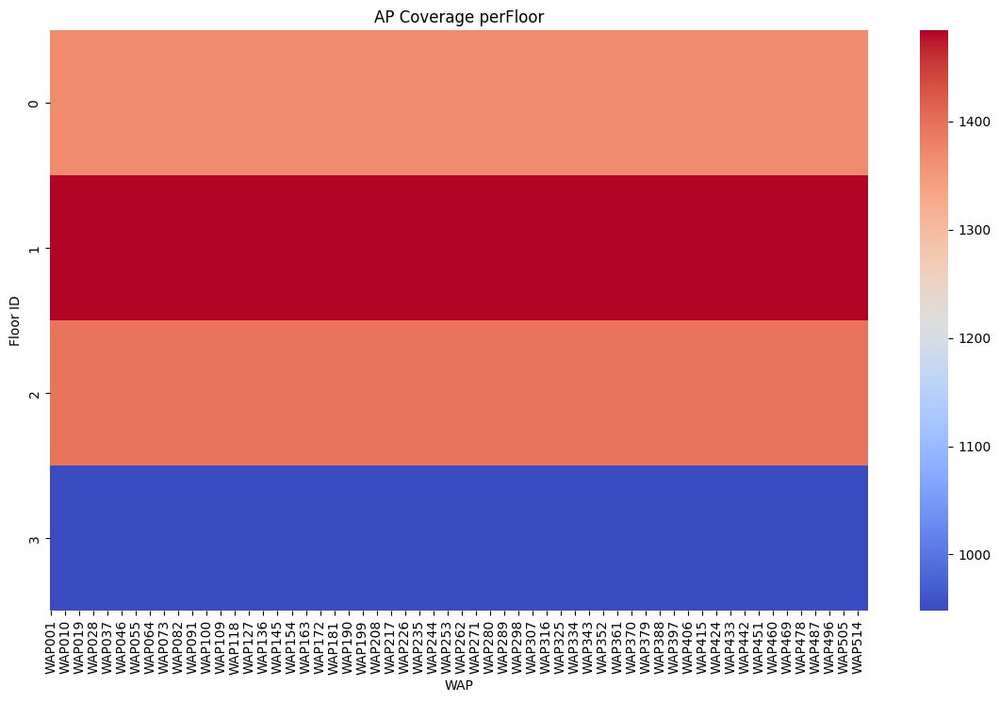

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('FLOOR')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage perFloor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
# plt.savefig('ap_coverage_per_floor_b1.png', dpi=300, bbox_inches='tight')
plt.show()

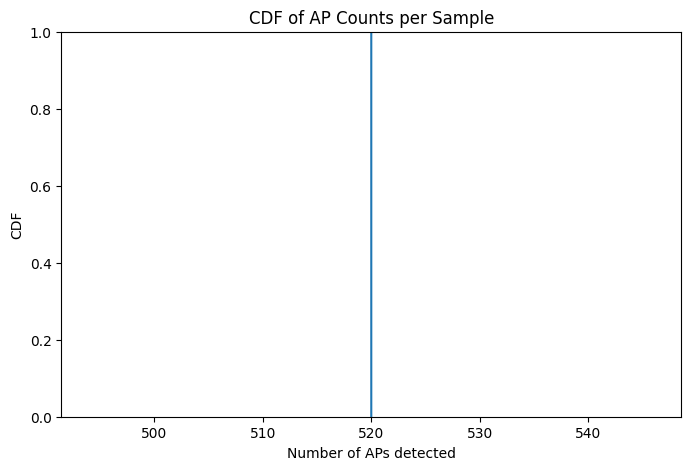

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_c.png', dpi=300, bbox_inches='tight')
plt.show()

Potential Outliers:
       WAP001  WAP002  WAP003  WAP004  WAP005  WAP006  WAP007  WAP008  WAP009  \
0        100     100     100     100     100   100.0     100   100.0     100   
1        100     100     100     100     100   100.0     100   100.0     100   
2        100     100     100     100     100   100.0     100     NaN     100   
3        100     100     100     100     100   100.0     100   100.0     100   
4        100     100     100     100     100   100.0     100   100.0     100   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
5191     100     100     100     100     100   100.0     100   100.0     100   
5192     100     100     100     100     100   100.0     100   100.0     100   
5193     100     100     100     100     100   100.0     100   100.0     100   
5194     100     100     100     100     100   100.0     100   100.0     100   
5195     100     100     100     100     100   100.0     100   100.0     100   

      WAP010  ... 

<ipython-input-55-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-55-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-55-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-55-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-55-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

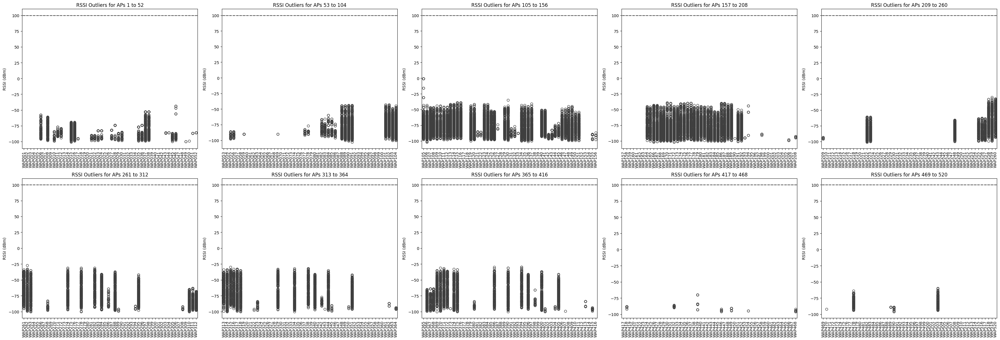

In [ ]:
# Outlier Detection in RSSI Values
dataa = data.copy()
dataa.drop(columns=["TIMESTAMP","LONGITUDE",  "LATITUDE" , "FLOOR"  ,"BUILDINGID",  "SPACEID","RELATIVEPOSITION",  "USERID" , "PHONEID" , "TIMESTAMP"], inplace=True)
# Identify extreme outliers
outliers = dataa[(dataa[rssi_columns] < -100) | (dataa[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)



# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(35, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of RSSI columns
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    sns.boxplot(data=data[segment_aps], ax=ax)

    ax.set_title(f"RSSI Outliers for APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(segment_aps, rotation=90)

# Adjust layout for better readability
plt.tight_layout()

# plt.savefig("rssi_outlier_detection_segmented.png", dpi=300, bbox_inches="tight")
plt.show()




RSSI Data Summary:
        WAP001  WAP002  WAP003  WAP004  WAP005       WAP006  WAP007  \
count  5196.0  5196.0  5196.0  5196.0  5196.0  5196.000000  5196.0   
mean    100.0   100.0   100.0   100.0   100.0    90.007313   100.0   
std       0.0     0.0     0.0     0.0     0.0    41.921917     0.0   
min     100.0   100.0   100.0   100.0   100.0   -96.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   

            WAP008  WAP009       WAP010  ...  WAP511  WAP512  WAP513  WAP514  \
count  5196.000000  5196.0  5196.000000  ...  5196.0  5196.0  5196.0  5196.0   
mean     80.667436   100.0    96.791378  ...   100.0   100.0   100.0   100.0   
std      55.948088     0.0    24.595335  ...     0.0     0.0     0.0     0.0   
min     -98.000000   100.0  

<ipython-input-127-ad40d706ad1d>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-127-ad40d706ad1d>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-127-ad40d706ad1d>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-127-ad40d706ad1d>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-127-ad40d706ad1d>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a F

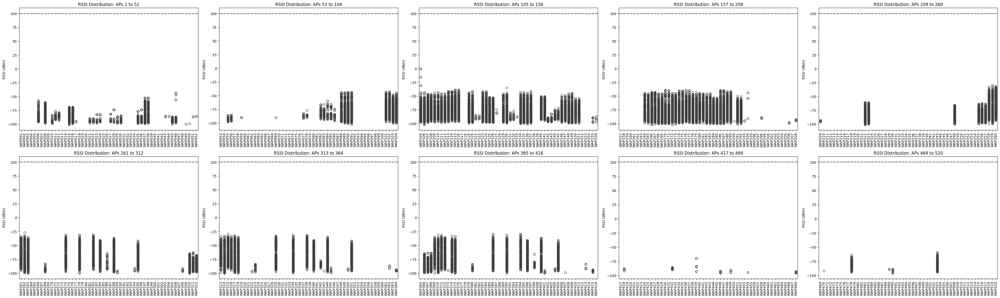

In [ ]:
# RSSI Distribution Across APs

# Summary statistics of RSSI values
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(40, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of RSSI columns
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    sns.boxplot(data=data[segment_aps], ax=ax)

    ax.set_title(f"RSSI Distribution: APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(segment_aps, rotation=90)

# Adjust layout for better readability
plt.tight_layout()

plt.savefig("rssi_distribution_b2.png", dpi=300, bbox_inches="tight")
plt.show()

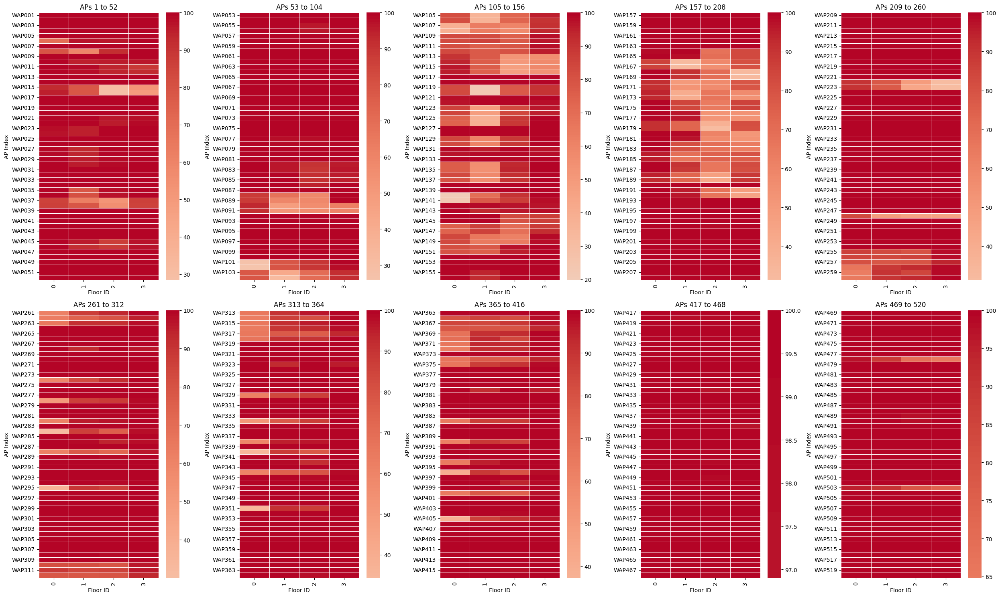

In [ ]:
# Compute mean RSSI per floor and transpose for plotting
coverage_by_floor = data[rssi_columns].groupby(data["FLOOR"]).mean().T

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(coverage_by_floor) // num_segments
if len(coverage_by_floor) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

for i in range(num_segments):
    # Slice the DataFrame for the current segment
    segment_aps = coverage_by_floor.index[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_data = coverage_by_floor.loc[segment_aps]

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0.5, linewidths=0.5, ax=ax)
    ax.set_title(f"APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Floor ID")
    ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


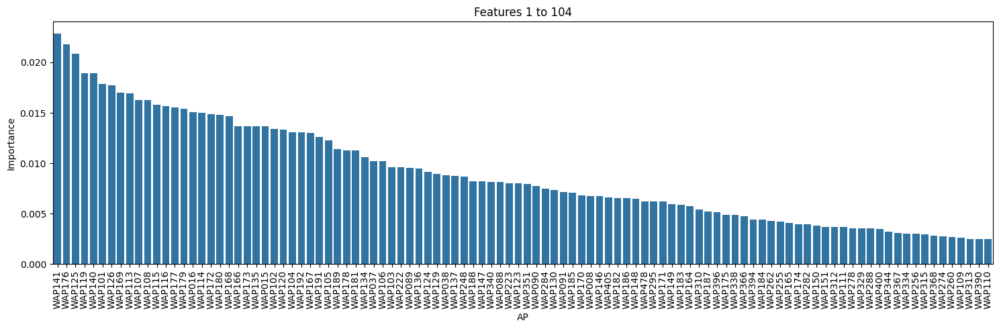

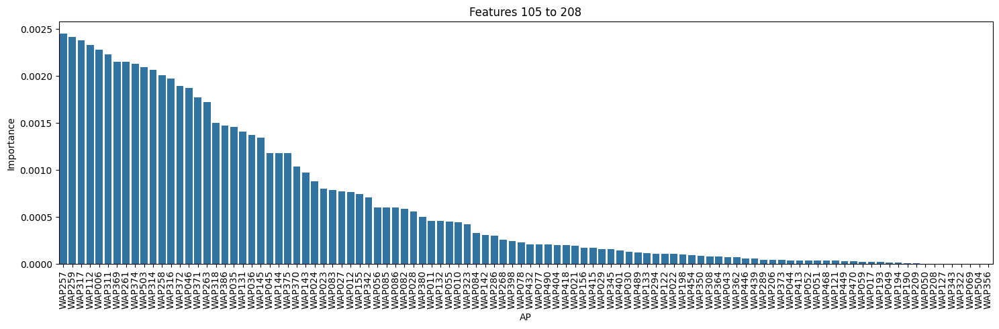

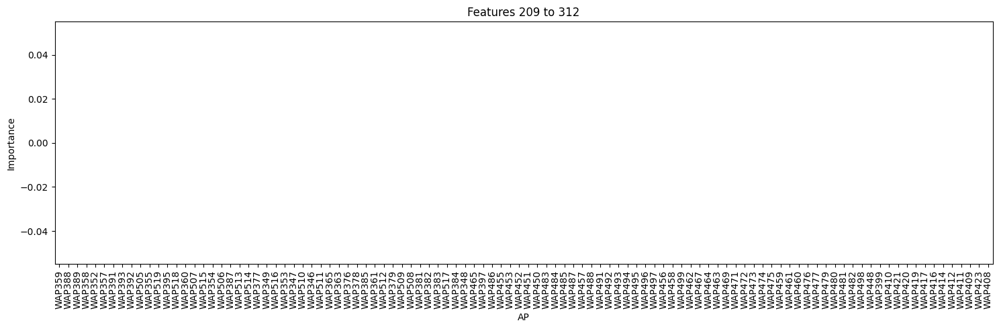

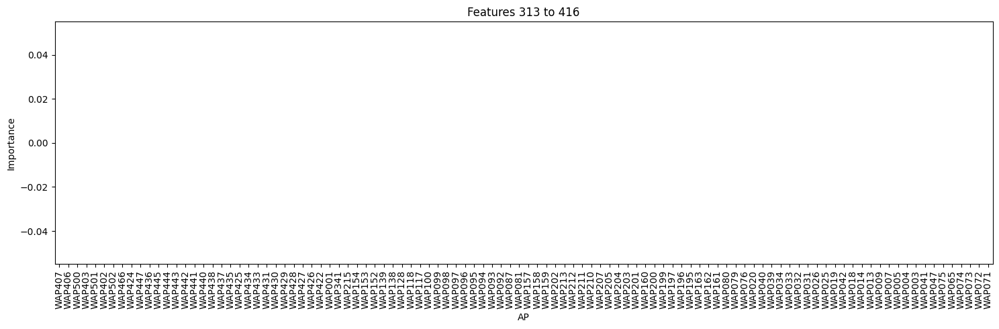

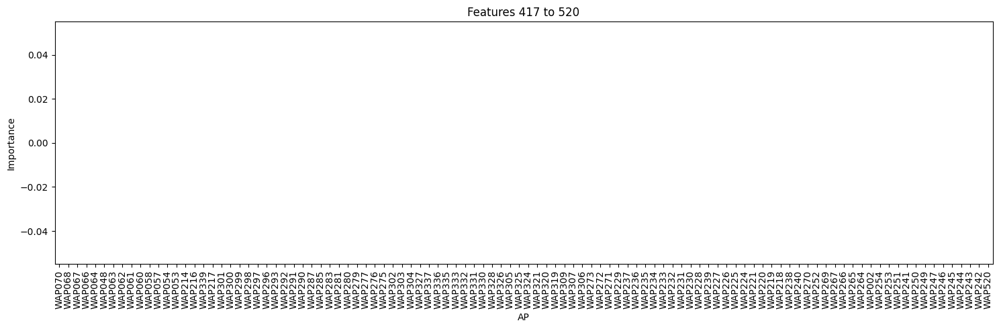

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Prepare dataset
X = data[rssi_columns]  # RSSI values
y = data["FLOOR"]       # Target variable

# Train a simple classifier to get feature importance
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X, y)

# Create a DataFrame for feature importance and sort by importance
fi = pd.DataFrame({
    "AP": rssi_columns,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False).reset_index(drop=True)

# Set the number of segments (separate plots)
num_segments = 5

# Determine how many features per segment (round up if needed)
features_per_segment = math.ceil(len(fi) / num_segments)

# Loop through each segment and plot the barplot in a separate figure
for i in range(num_segments):
    start = i * features_per_segment
    end = (i + 1) * features_per_segment
    seg = fi.iloc[start:end]

    plt.figure(figsize=(15, 5))
    sns.barplot(x="AP", y="importance", data=seg)
    plt.title(f"Features {start + 1} to {min(end, len(fi))}")
    plt.xlabel("AP")
    plt.ylabel("Importance")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


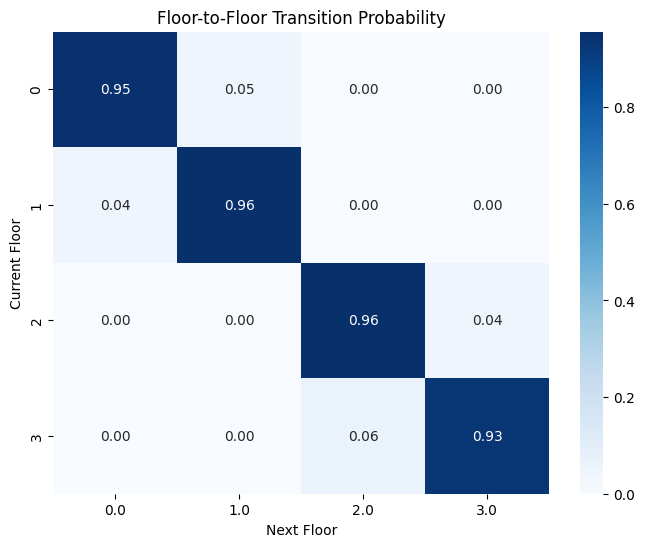

In [ ]:
# Floor-to-Floor Transition Probability (Optional)

import pandas as pd
import seaborn as sns

# Compute floor transition probabilities
floor_transitions = pd.crosstab(data["FLOOR"], data["FLOOR"].shift(-1), normalize='index')

# Plot as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(floor_transitions, annot=True, cmap="Blues", fmt=".2f")
plt.title("Floor-to-Floor Transition Probability")
plt.xlabel("Next Floor")
plt.ylabel("Current Floor")
plt.show()


<ipython-input-17-1503dce404f3>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)


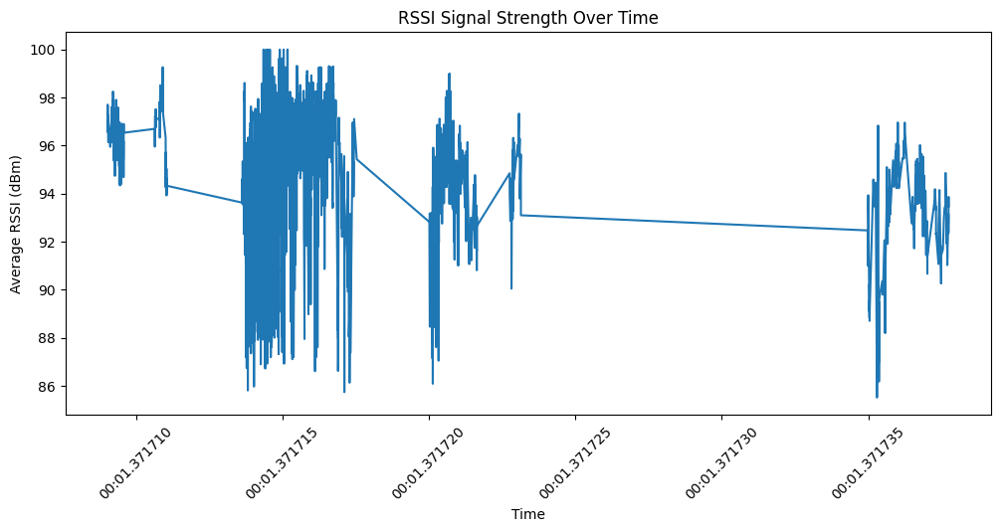

In [ ]:
# Temporal Variability Analysis (if timestamps exist)
# Convert SampleTimes to datetime (if applicable)
data["SampleTimes"] = pd.to_datetime(data["TIMESTAMP"], errors='coerce')

# Plot RSSI variation over time
plt.figure(figsize=(12, 5))
sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)
plt.xticks(rotation=45)
plt.title("RSSI Signal Strength Over Time")
plt.xlabel("Time")
plt.ylabel("Average RSSI (dBm)")
plt.show()


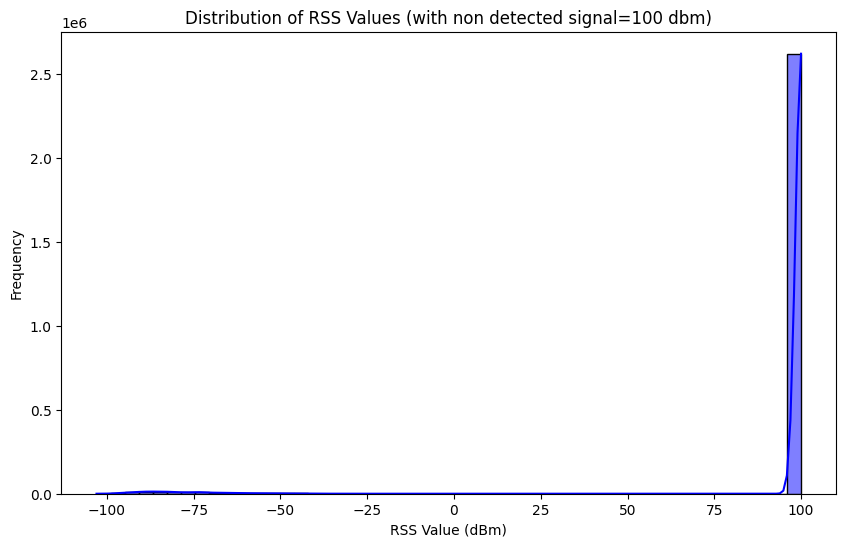

In [ ]:
# Flatten RSS values into a single array for visualization
rss_values = data.iloc[:, :520].values.flatten()

# Plot the distribution of RSS values
plt.figure(figsize=(10, 6))
sns.histplot(rss_values, bins=50, kde=True, color='blue')
plt.title('Distribution of RSS Values (with non detected signal=100 dbm)')
plt.xlabel('RSS Value (dBm)')
plt.ylabel('Frequency')
plt.show()


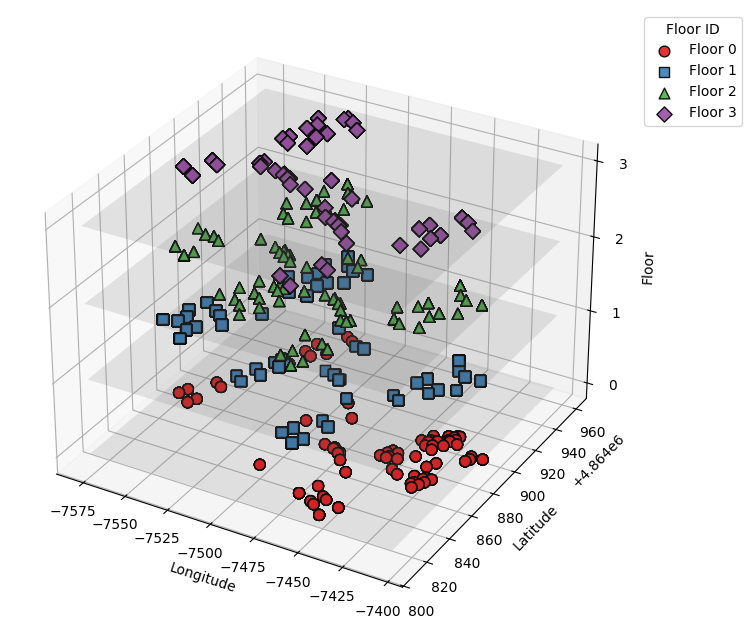

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Convert floors to integer values
data["FLOOR"] = data["FLOOR"].astype(int)

# Create a 3D figure
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111, projection='3d')

# Define a distinct color map for floors using a high-contrast palette
floor_colors = sns.color_palette("Set1", n_colors=data["FLOOR"].nunique())
markers = ["o", "s", "^", "D", "X", "*"]  # More variety in markers

# Plot each floor separately with distinct colors and markers
for i, floor in enumerate(sorted(data["FLOOR"].unique())):
    subset = data[data["FLOOR"] == floor]
    ax.scatter(subset["LONGITUDE"], subset["LATITUDE"], subset["FLOOR"],
               label=f"Floor {floor}", color=floor_colors[i], alpha=0.9,
               edgecolors="k", marker=markers[i % len(markers)], s=60)  # Increase marker size

# Add floor hyperplanes (horizontal shaded planes)
floor_levels = sorted(data["FLOOR"].unique())
for floor in floor_levels:
    x_min, x_max = data["LONGITUDE"].min(), data["LONGITUDE"].max()
    y_min, y_max = data["LATITUDE"].min(), data["LATITUDE"].max()
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 10), np.linspace(y_min, y_max, 10))
    zz = np.full(xx.shape, floor)  # Constant Z height for the floor

    ax.plot_surface(xx, yy, zz, color="gray", alpha=0.15)  # Lighter transparency for better contrast

# Labels and title
# ax.set_title("3D Spatial Distribution of Reference Points (RPs) with Floor Hyperplanes")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_zlabel("Floor")

# Adjust ticks to ensure floors are displayed as integers
ax.set_zticks(floor_levels)  # Set integer tick marks on Z-axis

# Add a legend with clear spacing
ax.legend(title="Floor ID", loc="upper right", bbox_to_anchor=(1.2, 1))

# Save figure
plt.savefig("spatial_distribution_building2.png", dpi=300, bbox_inches="tight")
plt.show()


<ipython-input-20-2adcb8a2fe0e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")


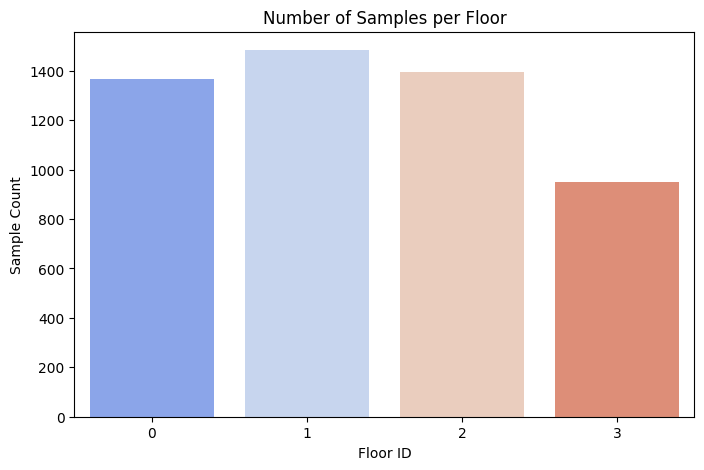

In [ ]:
# Floor Classification Analysis

# Count samples per floor
floor_counts = data["FLOOR"].value_counts()

# Bar chart of samples per floor
plt.figure(figsize=(8, 5))
sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")
plt.title("Number of Samples per Floor")
plt.xlabel("Floor ID")
plt.ylabel("Sample Count")
plt.show()



Devices used for collection: [23 18  6  1 14  8 13 17  7 22 10]


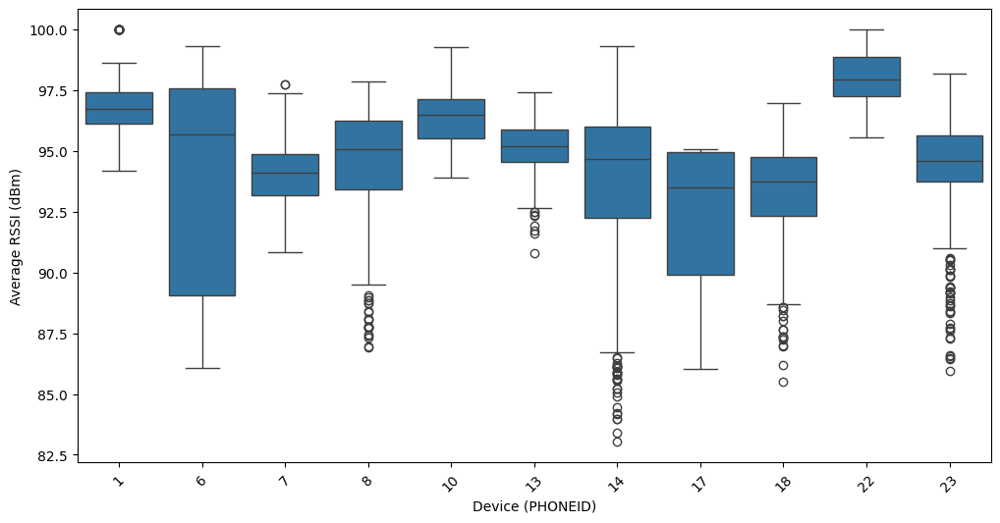

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["PHONEID"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["PHONEID"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
# plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PHONEID)")
plt.ylabel("Average RSSI (dBm)")
plt.savefig("rssi_device_boxplot_building2.png", dpi=300, bbox_inches="tight")

plt.show()



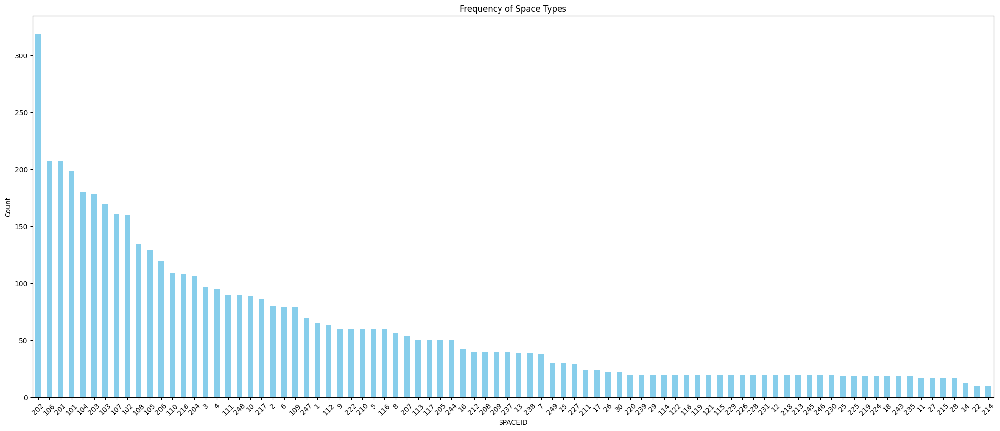

In [ ]:
# Plot the frequency of SceneID   WAP520	LONGITUDE	LATITUDE	FLOOR	BUILDINGID	SPACEID	RELATIVEPOSITION	USERID	PHONEID	TIMESTAMP
scene_counts = data['SPACEID'].value_counts()
scene_counts.plot(kind='bar', figsize=(25, 10), color='skyblue')
plt.title('Frequency of Space Types')
plt.xlabel('SPACEID')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


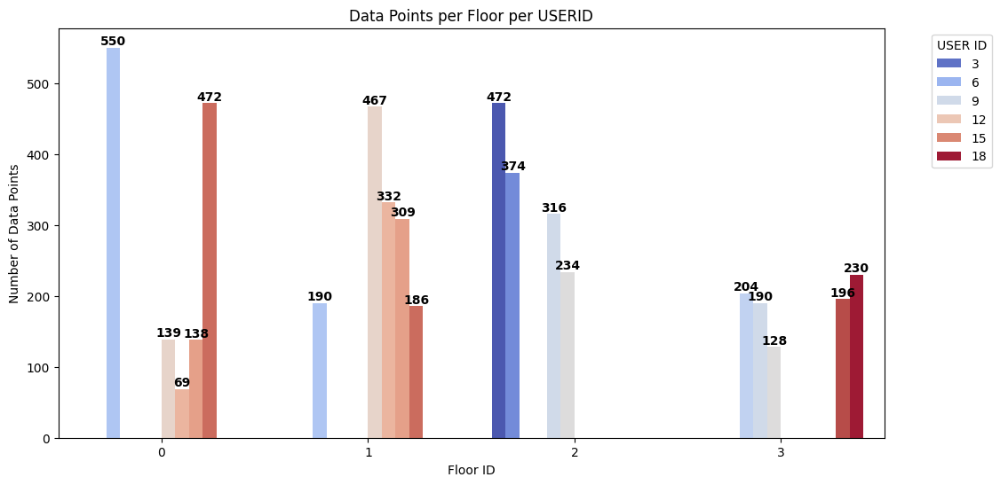

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count data points per FloorID and SceneID
floor_scene_counts = data.groupby(["FLOOR", "USERID"]).size().reset_index(name="Count")

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(x="FLOOR", y="Count", hue="USERID", data=floor_scene_counts, palette="coolwarm")

# Add value labels on bars (only if count > 0)
for p in ax.patches:
    if p.get_height() > 0:  # Ensure only non-zero bars are labeled
        ax.annotate(f"{int(p.get_height())}",
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

# Labels and title
plt.xlabel("Floor ID")
plt.ylabel("Number of Data Points")
plt.title("Data Points per Floor per USERID")
plt.legend(title="USER ID", bbox_to_anchor=(1.05, 1), loc="upper left")

# Show plot
plt.show()


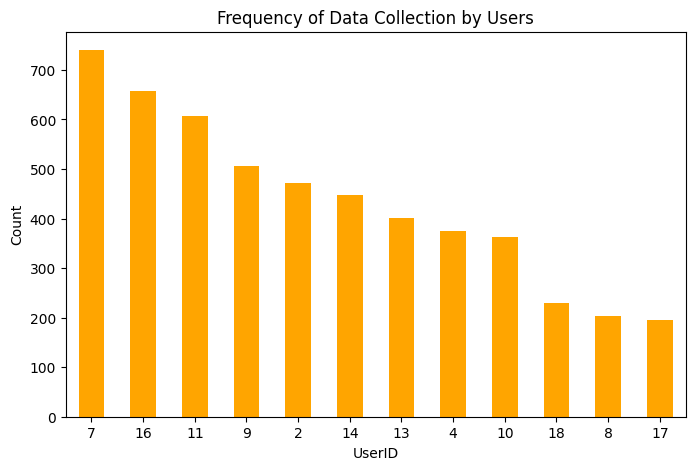

In [ ]:
# UserID distribution
user_counts = data['USERID'].value_counts()
user_counts.plot(kind='bar', figsize=(8, 5), color='orange')
plt.title('Frequency of Data Collection by Users')
plt.xlabel('UserID')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


In [ ]:
# Identify columns
rssi_columns = [col for col in data.columns if "WAP" in col]  # RSSI features
coordinate_columns = ["LONGITUDE", "LATITUDE"]
floor_column = "FLOOR"
building_column = "BUILDINGID"

# Summary of RSSI data
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



RSSI Data Summary:
        WAP001  WAP002  WAP003  WAP004  WAP005       WAP006  WAP007  \
count  5196.0  5196.0  5196.0  5196.0  5196.0  5196.000000  5196.0   
mean    100.0   100.0   100.0   100.0   100.0    90.007313   100.0   
std       0.0     0.0     0.0     0.0     0.0    41.921917     0.0   
min     100.0   100.0   100.0   100.0   100.0   -96.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.0   100.000000   100.0   

            WAP008  WAP009       WAP010  ...  WAP511  WAP512  WAP513  WAP514  \
count  5196.000000  5196.0  5196.000000  ...  5196.0  5196.0  5196.0  5196.0   
mean     80.667436   100.0    96.791378  ...   100.0   100.0   100.0   100.0   
std      55.948088     0.0    24.595335  ...     0.0     0.0     0.0     0.0   
min     -98.000000   100.0  

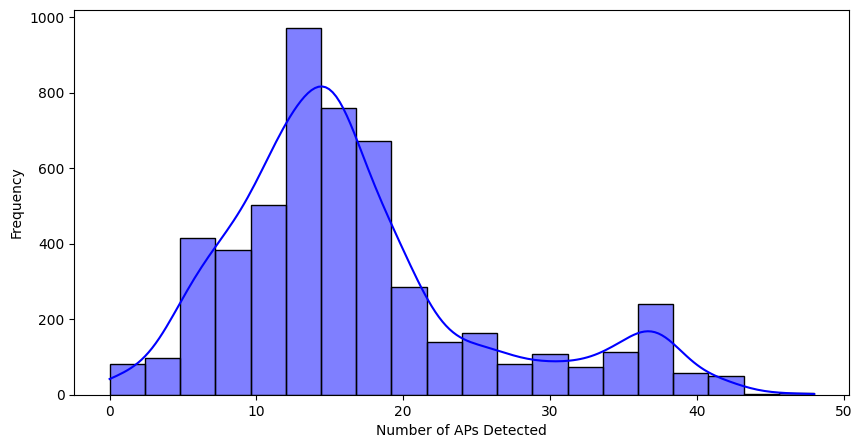

In [ ]:
# Count detected APs per sample (non-zero RSSI values)
data["AP_count"] = (data[rssi_columns] != 100).sum(axis=1)

# Histogram of AP counts
plt.figure(figsize=(10, 5))
sns.histplot(data["AP_count"], bins=20, kde=True, color="blue")
# plt.title("Distribution of Detected Access Points Per Sample")
plt.xlabel("Number of APs Detected")
plt.ylabel("Frequency")
plt.savefig("rssi_distribution_building2.png", dpi=300, bbox_inches="tight")

plt.show()


### Building 2

In [ ]:
# Load your training and validation datasets
path_train =   "/content/drive/MyDrive/ILS Models/0 Single building ujiindoorloc/building2/UjiindoorLoc_building_2/train_building_2.csv"

data = pd.read_csv(path_train)
# data.replace(100, -105, inplace=True)
# data.head()

In [ ]:
# Identify columns
rssi_columns = [col for col in data.columns if "WAP" in col]  # RSSI features
coordinate_columns = ["LONGITUDE", "LATITUDE"]
floor_column = "FLOOR"
building_column = "BUILDINGID"

# Summary of RSSI data
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



RSSI Data Summary:
        WAP001  WAP002  WAP003  WAP004       WAP005       WAP006  WAP007  \
count  9492.0  9492.0  9492.0  9492.0  9492.000000  9492.000000  9492.0   
mean    100.0   100.0   100.0   100.0    99.188685    99.442899   100.0   
std       0.0     0.0     0.0     0.0    12.472991    10.245218     0.0   
min     100.0   100.0   100.0   100.0   -97.000000   -98.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   

       WAP008  WAP009  WAP010  ...       WAP511       WAP512       WAP513  \
count  9492.0  9492.0  9492.0  ...  9492.000000  9492.000000  9492.000000   
mean    100.0   100.0   100.0  ...    68.441319    99.720396    97.650232   
std       0.0     0.0     0.0  ...    68.923595     7.278061    20.51863

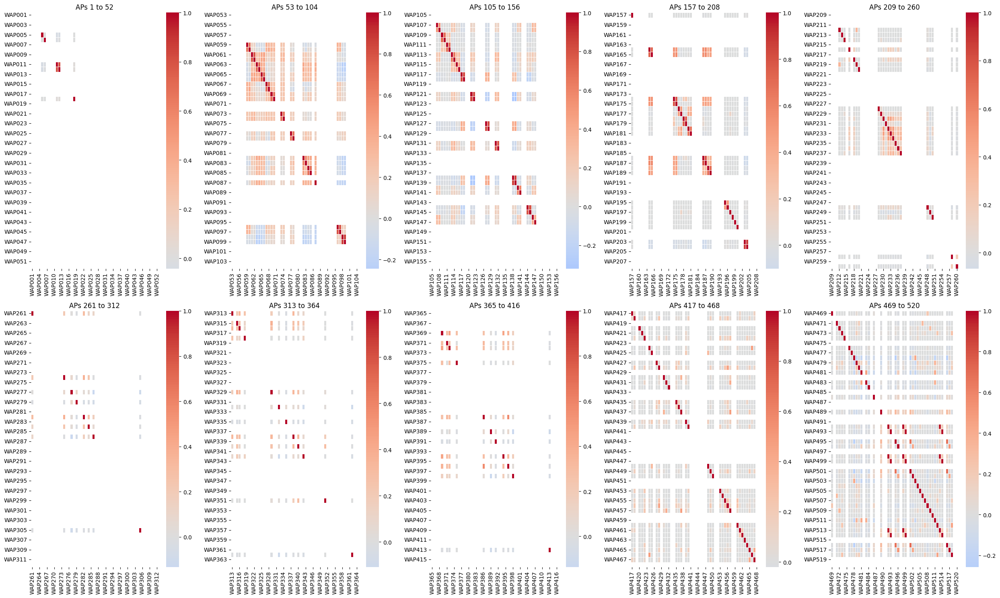

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Compute correlation matrix for RSSI values
corr_matrix = data[rssi_columns].corr()

# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(corr_matrix) // num_segments
if len(corr_matrix) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = corr_matrix.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_data = corr_matrix.loc[segment_aps, segment_aps]  # Slice correlation matrix

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0, linewidths=0.5, ax=ax)

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")

    # ax.set_xlabel("AP Index")
    # ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)
plt.tight_layout()
plt.savefig("rssi_correlation_building3.png", dpi=300, bbox_inches="tight")

plt.show()


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["LONGITUDE"].min(), data["LONGITUDE"].max()
y_min, y_max = data["LATITUDE"].min(), data["LATITUDE"].max()

print(f"LONGITUDE_min: {x_min}, LONGITUDE_max: {x_max}")
print(f"LATITUDE_min: {y_min}, LATITUDE_max: {y_max}")


LONGITUDE_min: -7415.163003530353, LONGITUDE_max: -7300.818990092725
LATITUDE_min: 4864745.745015971, LATITUDE_max: 4864861.7561028525


In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'WAP' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:

# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'WAP' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -104 dBm
Maximum RSSI: 100 dBm
RSSI Range: 204 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9492 entries, 0 to 9491
Columns: 529 entries, WAP001 to TIMESTAMP
dtypes: float64(2), int64(527)
memory usage: 38.3 MB
None


In [ ]:
# Summary statistics
print(data.describe())

       WAP001  WAP002  WAP003  WAP004       WAP005       WAP006  WAP007  \
count  9492.0  9492.0  9492.0  9492.0  9492.000000  9492.000000  9492.0   
mean    100.0   100.0   100.0   100.0    99.188685    99.442899   100.0   
std       0.0     0.0     0.0     0.0    12.472991    10.245218     0.0   
min     100.0   100.0   100.0   100.0   -97.000000   -98.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   

       WAP008  WAP009  WAP010  ...  WAP520    LONGITUDE      LATITUDE  \
count  9492.0  9492.0  9492.0  ...  9492.0  9492.000000  9.492000e+03   
mean    100.0   100.0   100.0  ...   100.0 -7354.124003  4.864816e+06   
std       0.0     0.0     0.0  ...     0.0    29.821543  2.809410e+01   
min     100.0   100.0   100.0  .

In [ ]:
# Check unique values for categorical columns
# print(f'unique Space: {data["SPACEID"].unique()}')
print(f'unique Floors: {data["FLOOR"].unique()}')
print(f'unique Users:{data["USERID"].unique()}')
print(f'unique Phones:{data["PHONEID"].unique()}')
print(f'unique Relative Positions:{data["RELATIVEPOSITION"].unique()}')

unique Floors: [3 2 4 1 0]
unique Users:[ 2 11  3  5  6  7  8  9 10 12 13 14 15 16 17 18]
unique Phones:[23 13 16  3 19  6  1 14  8 24 17  7 11 22 10]
unique Relative Positions:[2 1]


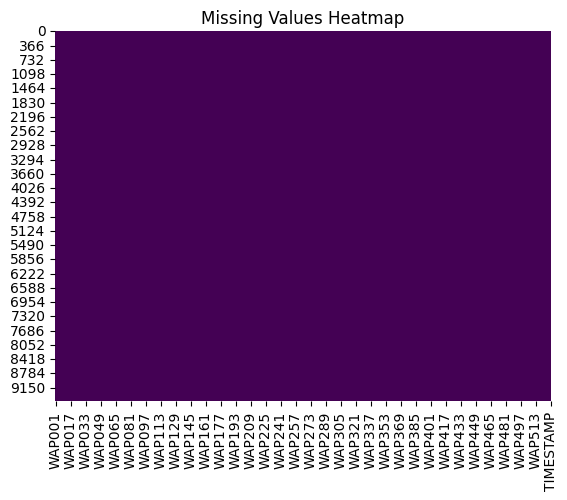

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


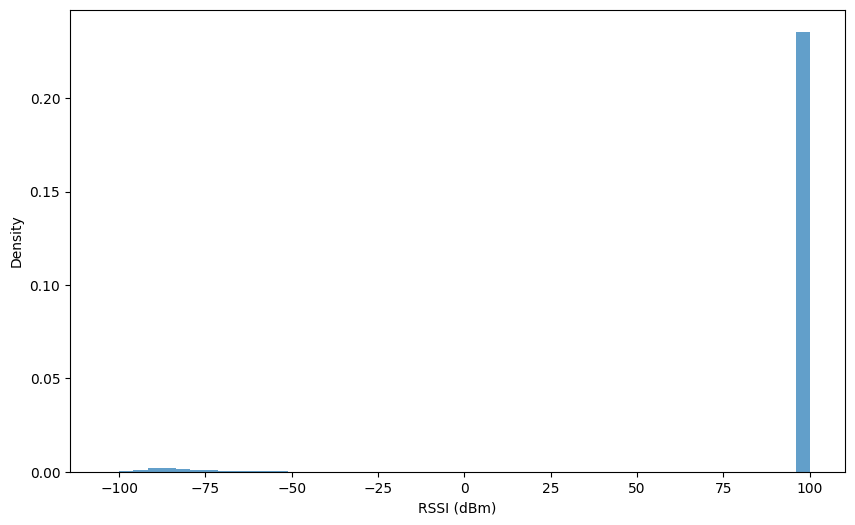

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution building 2")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_building2.png', dpi=300, bbox_inches='tight')
plt.show()

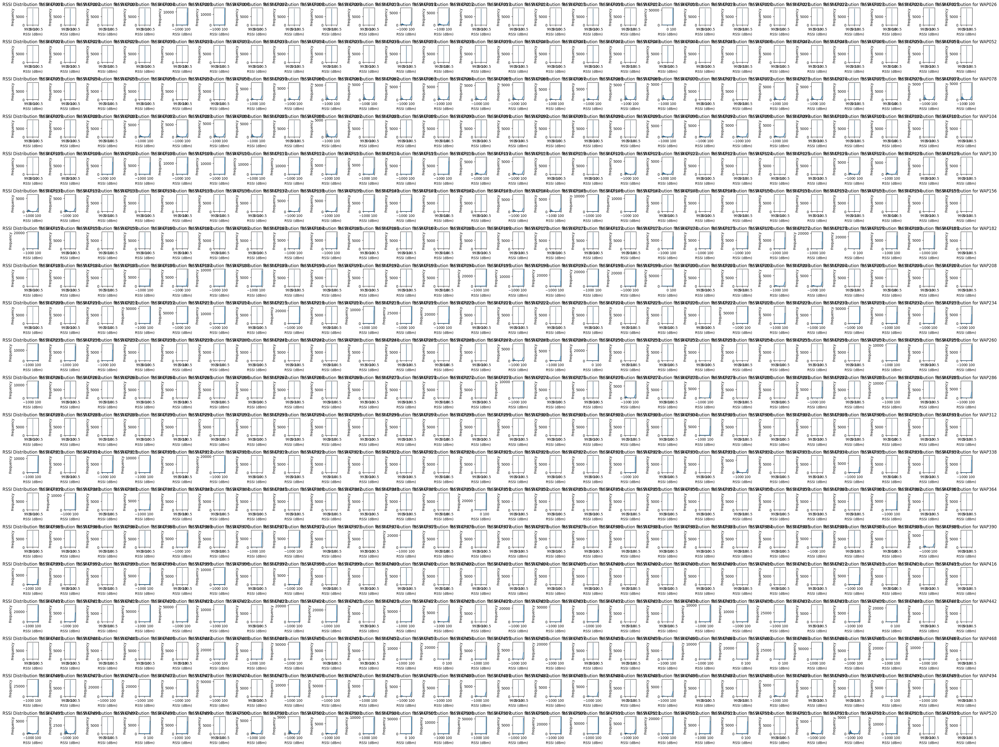

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=20, ncols=26, figsize=(26* 1.5, 20* 1.5))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:520]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
# plt.savefig('rssi_distributions_per_wap_b2.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-68-3b03a268139a>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


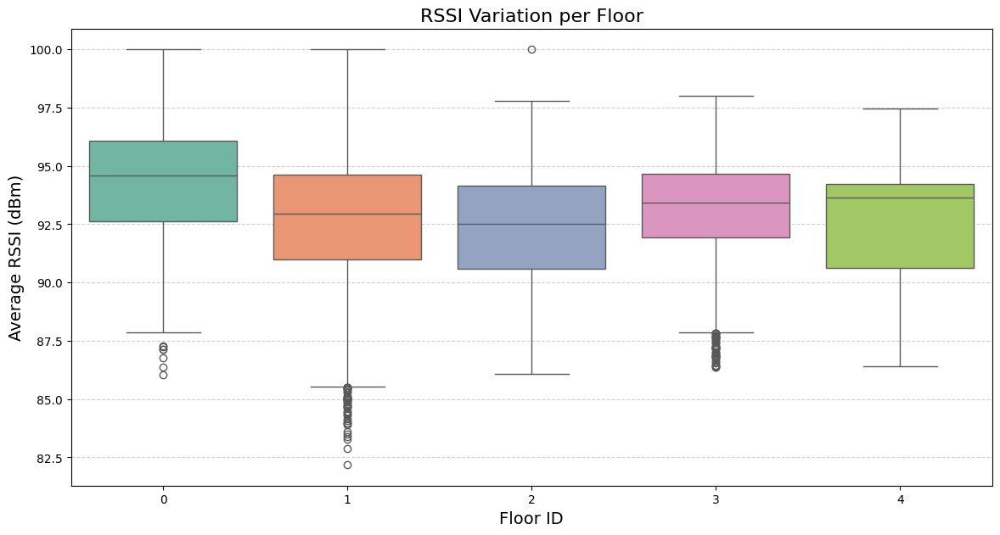

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)   BUILDINGID      SPACEID  RELATIVEPOSITION  USERID      PHONEID     TIMESTAMP
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='FLOOR',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
# plt.savefig('rssi_variation_floor_b2.png', dpi=300, bbox_inches='tight')
plt.show()

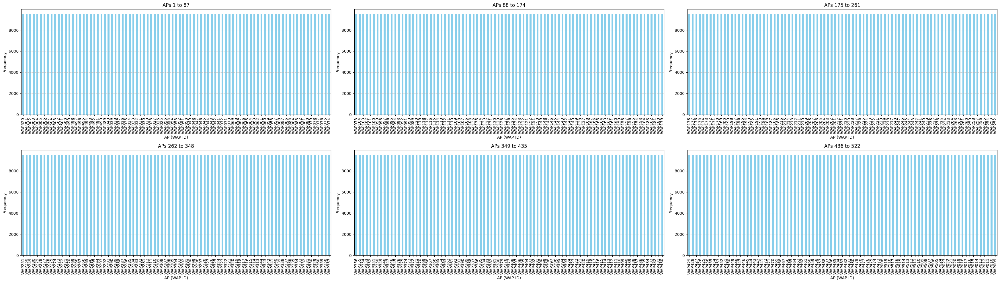

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute AP usage (AP detection frequency)
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

# Define the number of segments (subplots)
num_segments = 6  # Fewer segments for better readability in a paper

# Determine how many APs per segment
aps_per_segment = len(ap_usage) // num_segments
if len(ap_usage) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 3 columns (for better paper formatting)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(35, 10))
axes = axes.flatten()[:num_segments]  # Limit to num_segments

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = ap_usage.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_values = ap_usage[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    segment_values.plot(kind='bar', color='skyblue', ax=ax)

    # # Annotate bars with values
    # for p in ax.patches:
    #     ax.annotate(
    #         str(int(p.get_height())),
    #         (p.get_x() + p.get_width() / 2., p.get_height()),
    #         ha='center', va='bottom', fontsize=9, xytext=(0, 5), rotation=90,
    #         textcoords='offset points'
    #     )

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_xlabel("AP (WAP ID)")
    ax.set_ylabel("Frequency")
    ax.tick_params(axis='x', rotation=90)
    ax.grid(axis='y', linestyle='--', alpha=0.6)

# Remove unused subplots (if any)
for j in range(num_segments, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better readability
plt.tight_layout()

# Save and show
plt.savefig('ap_detection_frequency_b2.png', dpi=300, bbox_inches='tight')
plt.show()


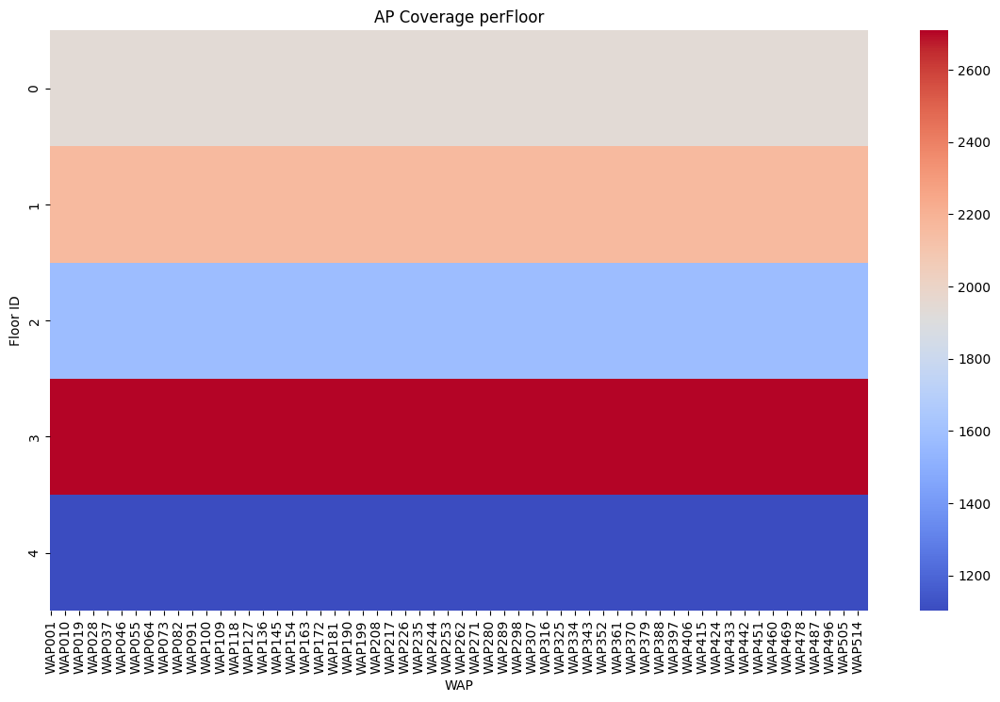

In [ ]:
# AP coverage heatmap per Room
room_ap_coverage = data.groupby('FLOOR')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage perFloor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
# plt.savefig('ap_coverage_per_floor_b1.png', dpi=300, bbox_inches='tight')
plt.show()

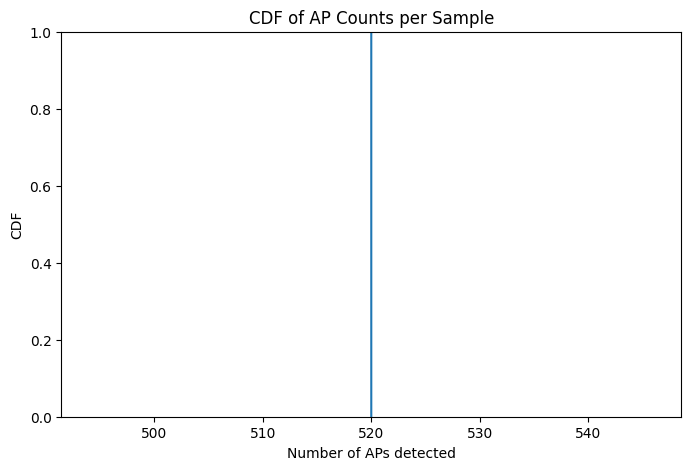

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_c.png', dpi=300, bbox_inches='tight')
plt.show()

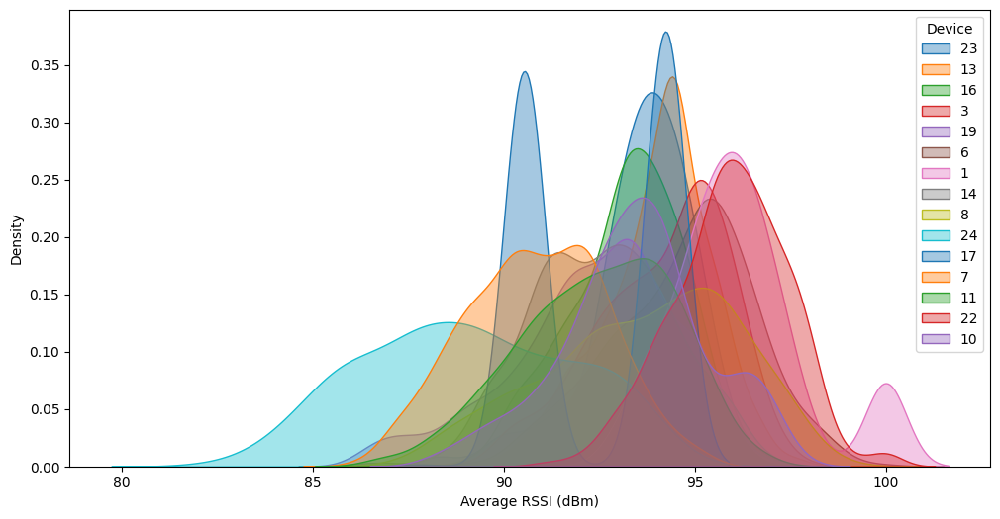

In [ ]:
# KDE (Kernel Density Estimation) Plot

plt.figure(figsize=(12, 6))
for device in data["PHONEID"].unique():
    sns.kdeplot(data[data["PHONEID"] == device][rssi_columns].mean(axis=1), label=device, fill=True, alpha=0.4)

# plt.title("RSSI Distribution Across Different Devices (KDE Plot)")
plt.xlabel("Average RSSI (dBm)")
plt.ylabel("Density")
plt.legend(title="Device")
plt.savefig('rssi_device_kde_b2.png', dpi=300, bbox_inches='tight')

plt.show()


Potential Outliers:
       WAP001  WAP002  WAP003  WAP004  WAP005  WAP006  WAP007  WAP008  WAP009  \
0        100     100     100     100   100.0   100.0     100     100     100   
1        100     100     100     100   100.0   100.0     100     100     100   
2        100     100     100     100   100.0   100.0     100     100     100   
3        100     100     100     100   100.0   100.0     100     100     100   
4        100     100     100     100   100.0   100.0     100     100     100   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
9487     100     100     100     100   100.0   100.0     100     100     100   
9488     100     100     100     100   100.0   100.0     100     100     100   
9489     100     100     100     100   100.0   100.0     100     100     100   
9490     100     100     100     100   100.0   100.0     100     100     100   
9491     100     100     100     100   100.0   100.0     100     100     100   

      WAP010  ... 

<ipython-input-72-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-72-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-72-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-72-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-72-a5a7af2600d9>:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedL

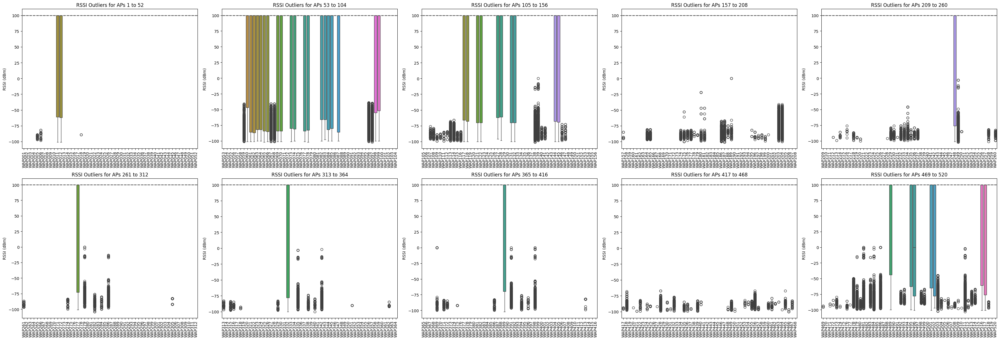

In [ ]:
# Outlier Detection in RSSI Values
dataa = data.copy()
dataa.drop(columns=["TIMESTAMP","LONGITUDE",  "LATITUDE" , "FLOOR"  ,"BUILDINGID",  "SPACEID","RELATIVEPOSITION",  "USERID" , "PHONEID" , "TIMESTAMP"], inplace=True)
# Identify extreme outliers
outliers = dataa[(dataa[rssi_columns] < -100) | (dataa[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)



# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(35, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of RSSI columns
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    sns.boxplot(data=data[segment_aps], ax=ax)

    ax.set_title(f"RSSI Outliers for APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(segment_aps, rotation=90)

# Adjust layout for better readability
plt.tight_layout()

# plt.savefig("rssi_outlier_detection_segmented.png", dpi=300, bbox_inches="tight")
plt.show()



<ipython-input-124-08351fff3fd0>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-124-08351fff3fd0>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-124-08351fff3fd0>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-124-08351fff3fd0>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(segment_aps, rotation=90)
<ipython-input-124-08351fff3fd0>:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a F

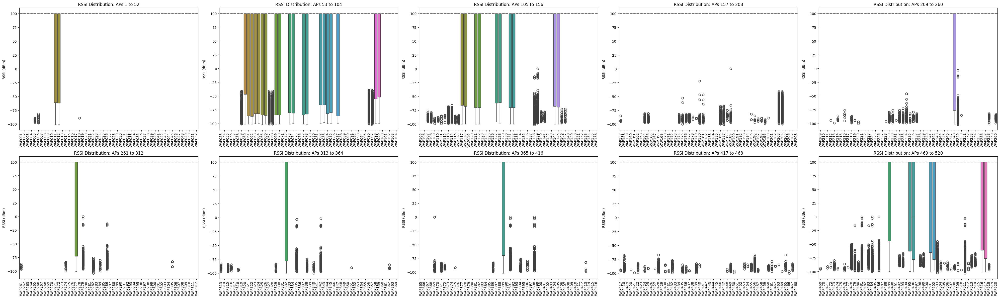

In [ ]:
# RSSI Distribution Across APs

# # Summary statistics of RSSI values
# print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



# Define number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 5 columns
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(40, 12))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of RSSI columns
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    sns.boxplot(data=data[segment_aps], ax=ax)

    ax.set_title(f"RSSI Distribution: APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(segment_aps, rotation=90)

# Adjust layout for better readability
plt.tight_layout()

plt.savefig("rssi_distribution_b3.png", dpi=300, bbox_inches="tight")
plt.show()

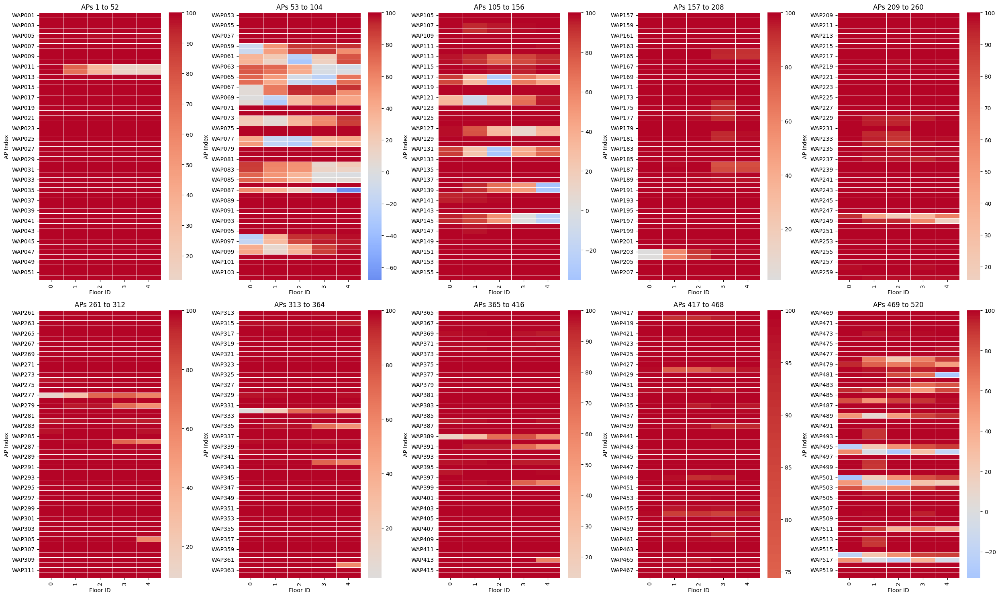

In [ ]:
# Compute mean RSSI per floor and transpose for plotting
coverage_by_floor = data[rssi_columns].groupby(data["FLOOR"]).mean().T

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(coverage_by_floor) // num_segments
if len(coverage_by_floor) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

for i in range(num_segments):
    # Slice the DataFrame for the current segment
    segment_aps = coverage_by_floor.index[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_data = coverage_by_floor.loc[segment_aps]

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0.5, linewidths=0.5, ax=ax)
    ax.set_title(f"APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Floor ID")
    ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()


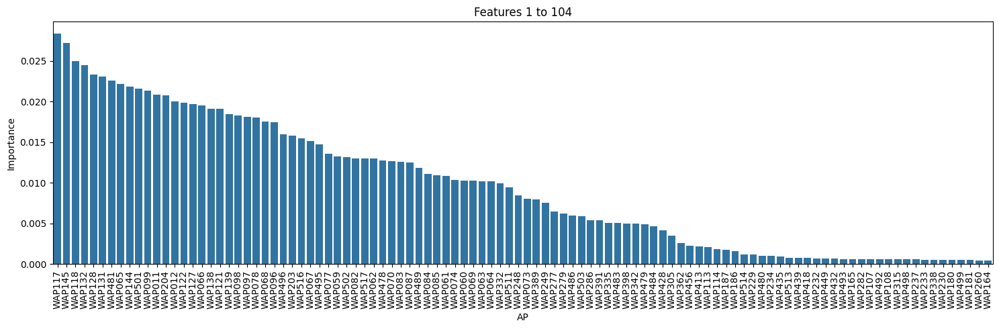

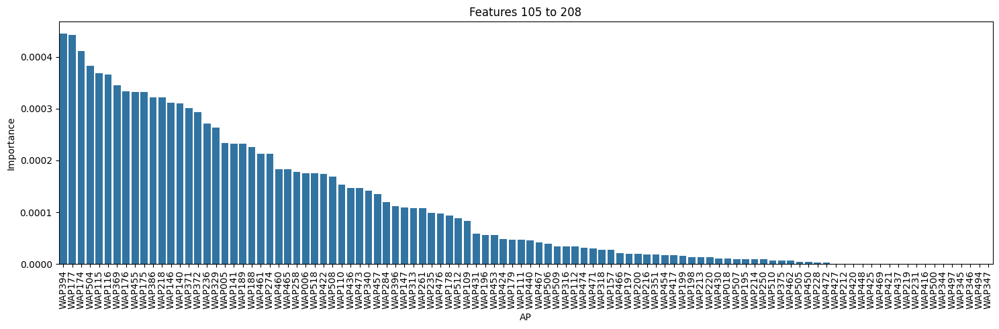

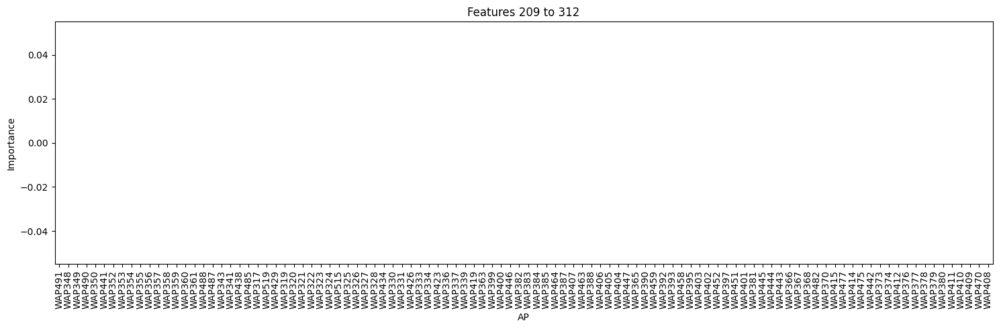

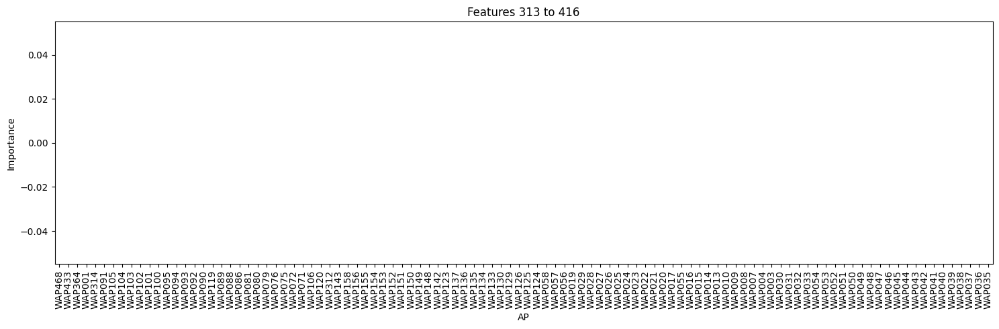

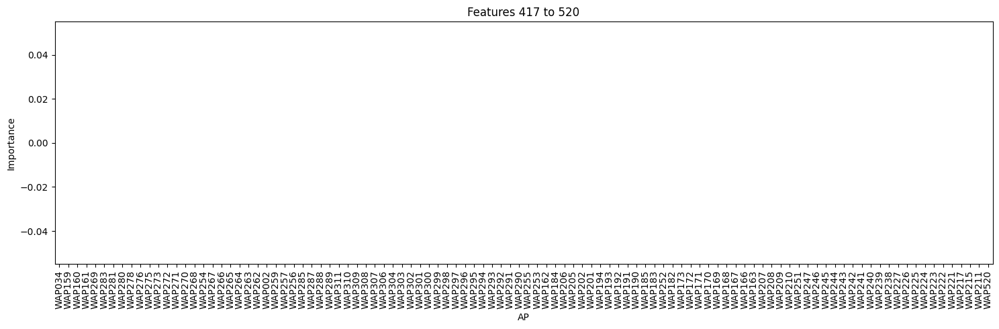

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Prepare dataset
X = data[rssi_columns]  # RSSI values
y = data["FLOOR"]       # Target variable

# Train a simple classifier to get feature importance
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X, y)

# Create a DataFrame for feature importance and sort by importance
fi = pd.DataFrame({
    "AP": rssi_columns,
    "importance": clf.feature_importances_
}).sort_values("importance", ascending=False).reset_index(drop=True)

# Set the number of segments (separate plots)
num_segments = 5

# Determine how many features per segment (round up if needed)
features_per_segment = math.ceil(len(fi) / num_segments)

# Loop through each segment and plot the barplot in a separate figure
for i in range(num_segments):
    start = i * features_per_segment
    end = (i + 1) * features_per_segment
    seg = fi.iloc[start:end]

    plt.figure(figsize=(15, 5))
    sns.barplot(x="AP", y="importance", data=seg)
    plt.title(f"Features {start + 1} to {min(end, len(fi))}")
    plt.xlabel("AP")
    plt.ylabel("Importance")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()


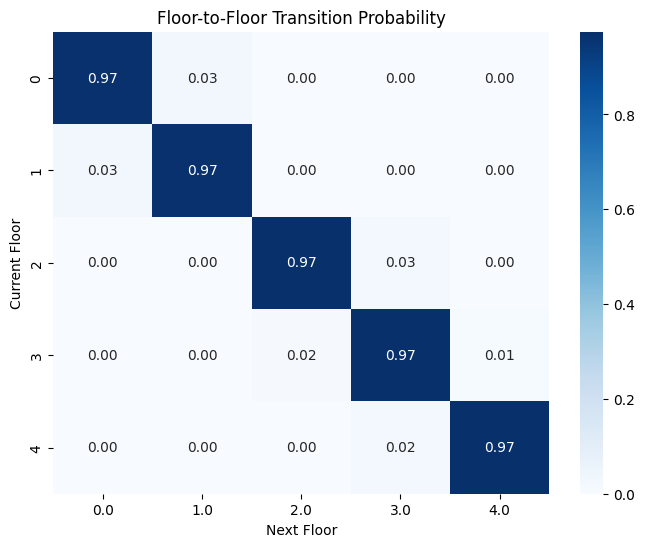

In [ ]:
# Floor-to-Floor Transition Probability (Optional)

import pandas as pd
import seaborn as sns

# Compute floor transition probabilities
floor_transitions = pd.crosstab(data["FLOOR"], data["FLOOR"].shift(-1), normalize='index')

# Plot as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(floor_transitions, annot=True, cmap="Blues", fmt=".2f")
plt.title("Floor-to-Floor Transition Probability")
plt.xlabel("Next Floor")
plt.ylabel("Current Floor")
plt.show()


<ipython-input-16-1503dce404f3>:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)


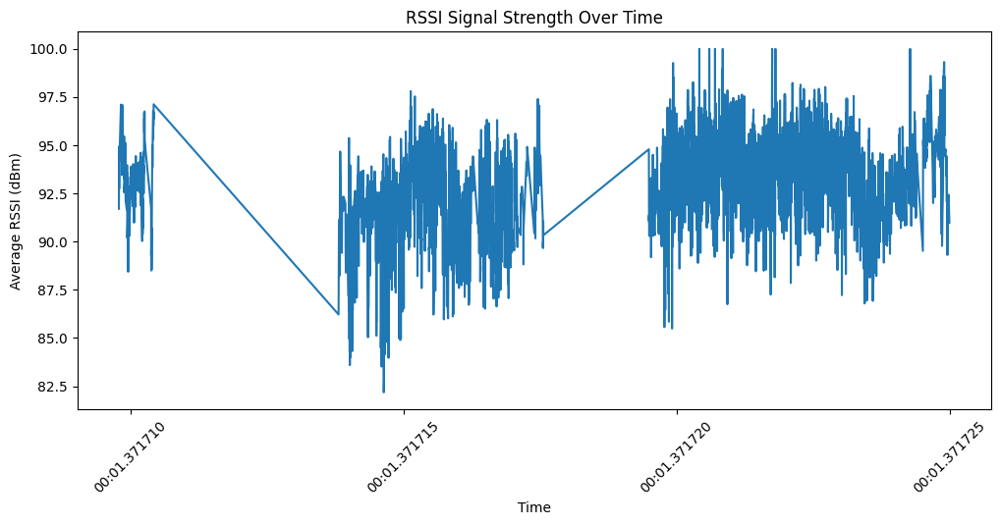

In [ ]:
# Temporal Variability Analysis (if timestamps exist)
# Convert SampleTimes to datetime (if applicable)
data["SampleTimes"] = pd.to_datetime(data["TIMESTAMP"], errors='coerce')

# Plot RSSI variation over time
plt.figure(figsize=(12, 5))
sns.lineplot(x=data["SampleTimes"], y=data[rssi_columns].mean(axis=1), ci=None)
plt.xticks(rotation=45)
plt.title("RSSI Signal Strength Over Time")
plt.xlabel("Time")
plt.ylabel("Average RSSI (dBm)")
plt.show()


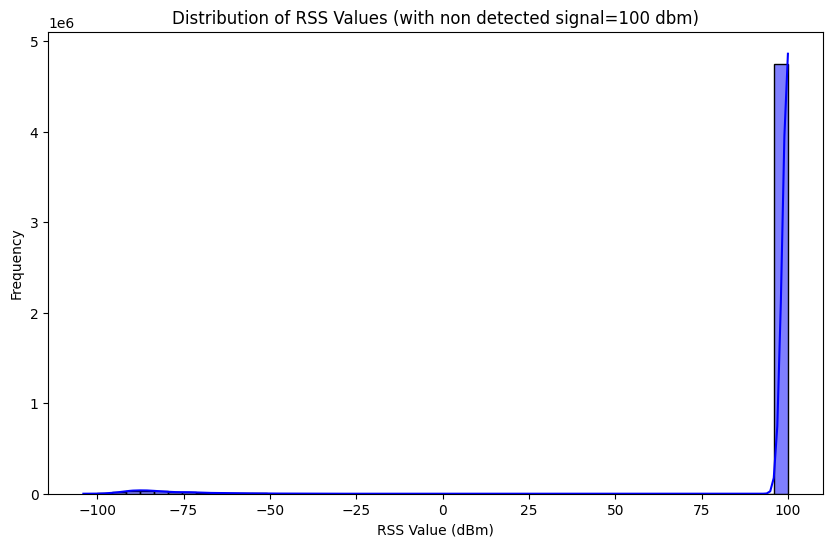

In [ ]:
# Flatten RSS values into a single array for visualization
rss_values = data.iloc[:, :520].values.flatten()

# Plot the distribution of RSS values
plt.figure(figsize=(10, 6))
sns.histplot(rss_values, bins=50, kde=True, color='blue')
plt.title('Distribution of RSS Values (with non detected signal=100 dbm)')
plt.xlabel('RSS Value (dBm)')
plt.ylabel('Frequency')
plt.show()


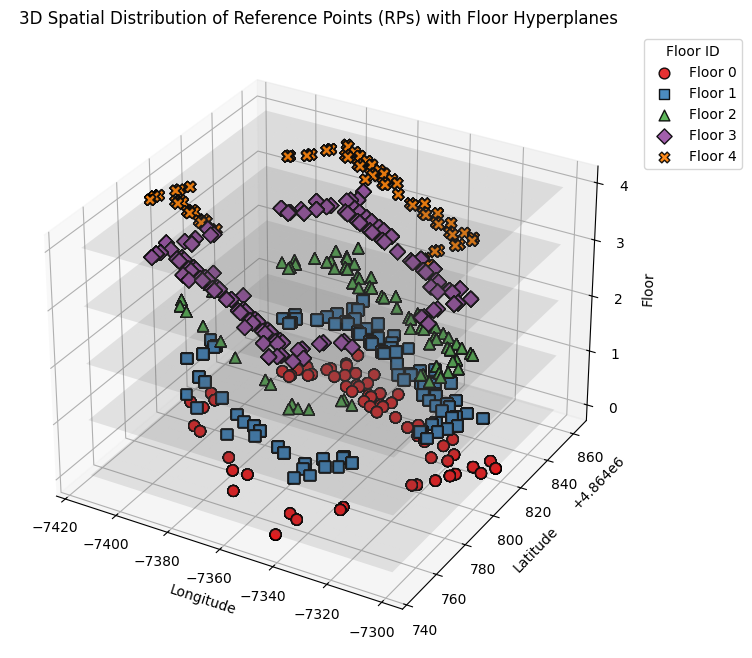

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# Convert floors to integer values
data["FLOOR"] = data["FLOOR"].astype(int)

# Create a 3D figure
fig = plt.figure(figsize=(20, 8))
ax = fig.add_subplot(111, projection='3d')

# Define a distinct color map for floors using a high-contrast palette
floor_colors = sns.color_palette("Set1", n_colors=data["FLOOR"].nunique())
markers = ["o", "s", "^", "D", "X", "*"]  # More variety in markers

# Plot each floor separately with distinct colors and markers
for i, floor in enumerate(sorted(data["FLOOR"].unique())):
    subset = data[data["FLOOR"] == floor]
    ax.scatter(subset["LONGITUDE"], subset["LATITUDE"], subset["FLOOR"],
               label=f"Floor {floor}", color=floor_colors[i], alpha=0.9,
               edgecolors="k", marker=markers[i % len(markers)], s=60)  # Increase marker size

# Add floor hyperplanes (horizontal shaded planes)
floor_levels = sorted(data["FLOOR"].unique())
for floor in floor_levels:
    x_min, x_max = data["LONGITUDE"].min(), data["LONGITUDE"].max()
    y_min, y_max = data["LATITUDE"].min(), data["LATITUDE"].max()
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 10), np.linspace(y_min, y_max, 10))
    zz = np.full(xx.shape, floor)  # Constant Z height for the floor

    ax.plot_surface(xx, yy, zz, color="gray", alpha=0.15)  # Lighter transparency for better contrast

# Labels and title
ax.set_title("3D Spatial Distribution of Reference Points (RPs) with Floor Hyperplanes")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_zlabel("Floor")

# Adjust ticks to ensure floors are displayed as integers
ax.set_zticks(floor_levels)  # Set integer tick marks on Z-axis

# Add a legend with clear spacing
ax.legend(title="Floor ID", loc="upper right", bbox_to_anchor=(1.2, 1))

# Save figure
plt.savefig("spatial_distribution_building3.png", dpi=300, bbox_inches="tight")
plt.show()


<ipython-input-19-2adcb8a2fe0e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")


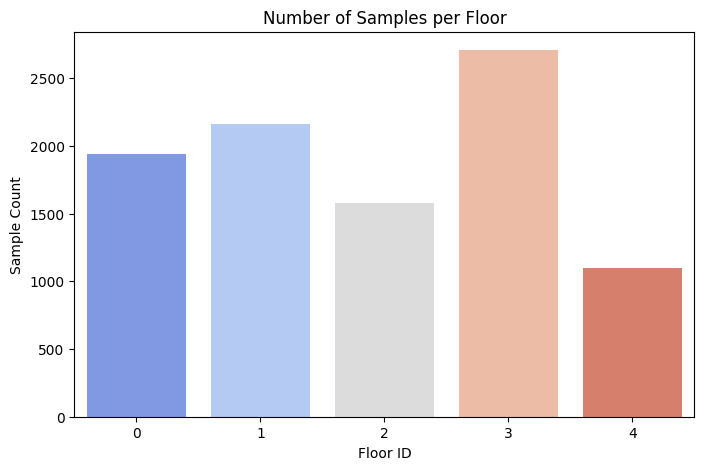

In [ ]:
# Floor Classification Analysis

# Count samples per floor
floor_counts = data["FLOOR"].value_counts()

# Bar chart of samples per floor
plt.figure(figsize=(8, 5))
sns.barplot(x=floor_counts.index, y=floor_counts.values, palette="coolwarm")
plt.title("Number of Samples per Floor")
plt.xlabel("Floor ID")
plt.ylabel("Sample Count")
plt.show()



Devices used for collection: [23 13 16  3 19  6  1 14  8 24 17  7 11 22 10]


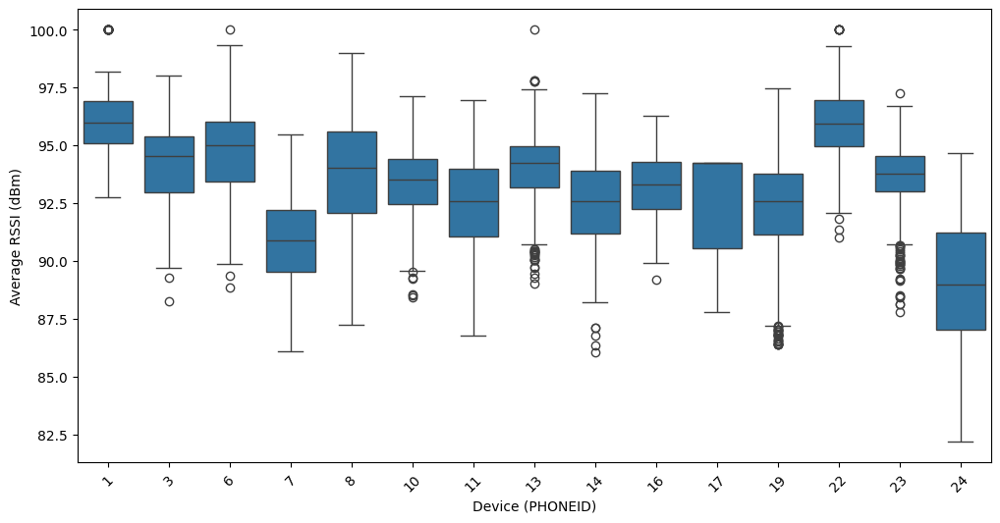

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["PHONEID"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["PHONEID"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
# plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PHONEID)")
plt.ylabel("Average RSSI (dBm)")
plt.savefig("rssi_device_boxplot_building3.png", dpi=300, bbox_inches="tight")

plt.show()



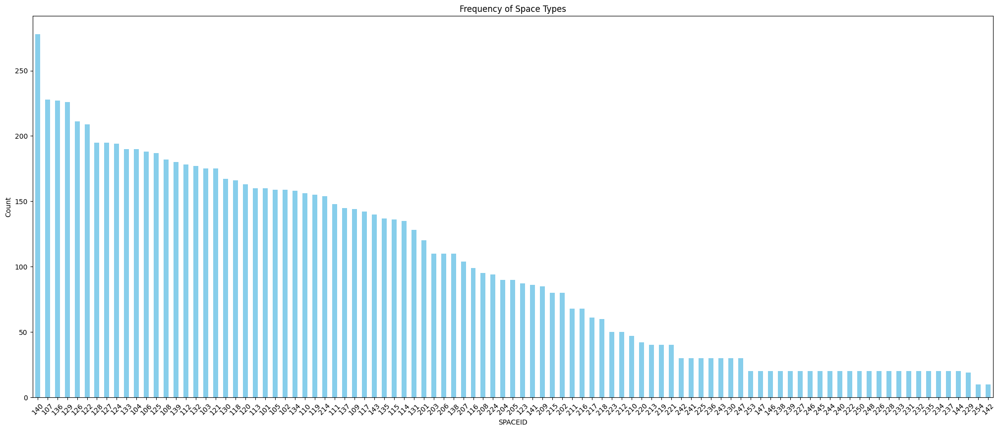

In [ ]:
# Plot the frequency of SceneID   WAP520	LONGITUDE	LATITUDE	FLOOR	BUILDINGID	SPACEID	RELATIVEPOSITION	USERID	PHONEID	TIMESTAMP
scene_counts = data['SPACEID'].value_counts()
scene_counts.plot(kind='bar', figsize=(25, 10), color='skyblue')
plt.title('Frequency of Space Types')
plt.xlabel('SPACEID')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


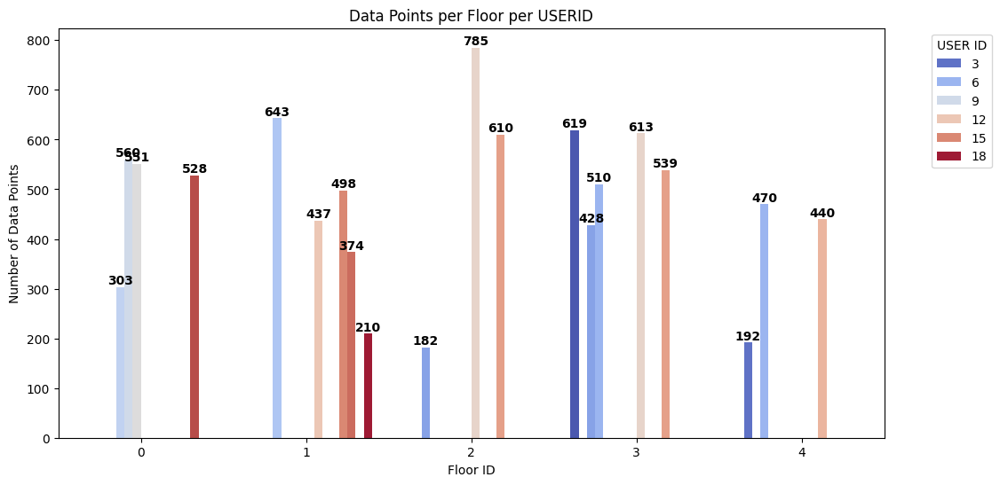

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count data points per FloorID and SceneID
floor_scene_counts = data.groupby(["FLOOR", "USERID"]).size().reset_index(name="Count")

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(x="FLOOR", y="Count", hue="USERID", data=floor_scene_counts, palette="coolwarm")

# Add value labels on bars (only if count > 0)
for p in ax.patches:
    if p.get_height() > 0:  # Ensure only non-zero bars are labeled
        ax.annotate(f"{int(p.get_height())}",
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10, fontweight='bold')

# Labels and title
plt.xlabel("Floor ID")
plt.ylabel("Number of Data Points")
plt.title("Data Points per Floor per USERID")
plt.legend(title="USER ID", bbox_to_anchor=(1.05, 1), loc="upper left")

# Show plot
plt.show()


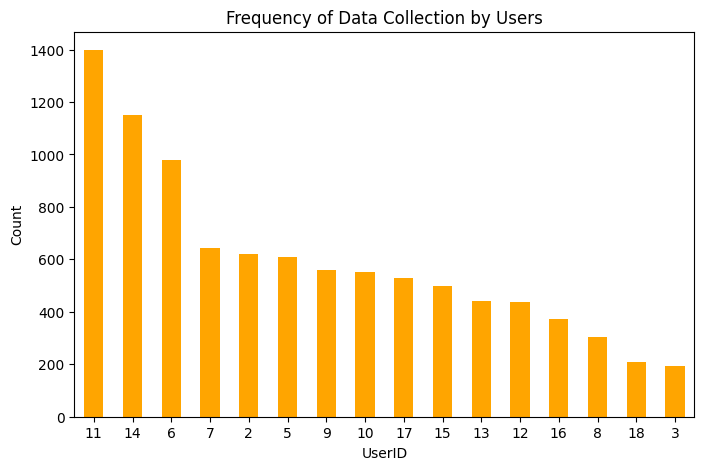

In [ ]:
# UserID distribution
user_counts = data['USERID'].value_counts()
user_counts.plot(kind='bar', figsize=(8, 5), color='orange')
plt.title('Frequency of Data Collection by Users')
plt.xlabel('UserID')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()


In [ ]:
# Identify columns
rssi_columns = [col for col in data.columns if "WAP" in col]  # RSSI features
coordinate_columns = ["LONGITUDE", "LATITUDE"]
floor_column = "FLOOR"
building_column = "BUILDINGID"

# Summary of RSSI data
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())



RSSI Data Summary:
        WAP001  WAP002  WAP003  WAP004       WAP005       WAP006  WAP007  \
count  9492.0  9492.0  9492.0  9492.0  9492.000000  9492.000000  9492.0   
mean    100.0   100.0   100.0   100.0    99.188685    99.442899   100.0   
std       0.0     0.0     0.0     0.0    12.472991    10.245218     0.0   
min     100.0   100.0   100.0   100.0   -97.000000   -98.000000   100.0   
25%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
50%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
75%     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   
max     100.0   100.0   100.0   100.0   100.000000   100.000000   100.0   

       WAP008  WAP009  WAP010  ...       WAP511       WAP512       WAP513  \
count  9492.0  9492.0  9492.0  ...  9492.000000  9492.000000  9492.000000   
mean    100.0   100.0   100.0  ...    68.441319    99.720396    97.650232   
std       0.0     0.0     0.0  ...    68.923595     7.278061    20.51863

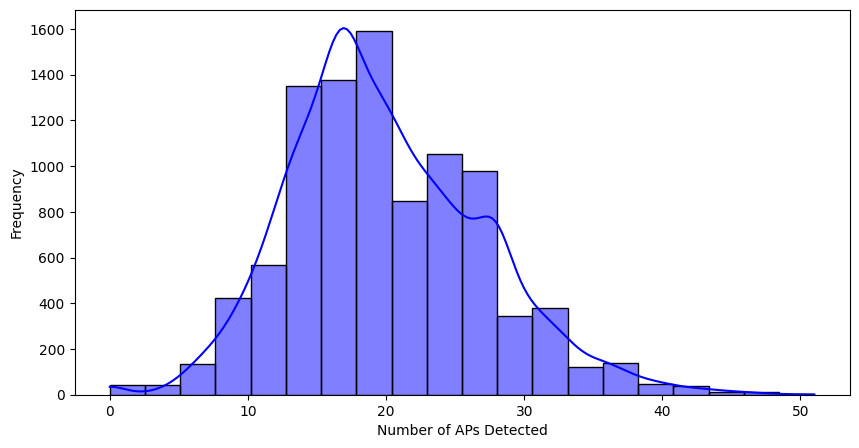

In [ ]:
# Count detected APs per sample (non-zero RSSI values)
data["AP_count"] = (data[rssi_columns] != 100).sum(axis=1)

# Histogram of AP counts
plt.figure(figsize=(10, 5))
sns.histplot(data["AP_count"], bins=20, kde=True, color="blue")
# plt.title("Distribution of Detected Access Points Per Sample")
plt.xlabel("Number of APs Detected")
plt.ylabel("Frequency")
plt.savefig("rssi_distribution_building3.png", dpi=300, bbox_inches="tight")

plt.show()


## 4. TUJI1 Dataset

In [ ]:
import os
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
import math
import numpy as np
import collections
import pandas as pd
import seaborn as sns
import tensorflow as tf
from keras.models import Model
import matplotlib.pyplot as plt
from keras.models import Sequential
from tensorflow.keras.backend import clear_session
from scipy.stats import skew, kurtosis  # Import skew and kurtosis

from sklearn.utils import resample
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, classification_report, accuracy_score

# Set seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)


In [ ]:
# Load your training and validation datasets
path_train =  "/content/drive/MyDrive/DATASETS/4. TUJI1 Dataset/Train.csv"
data = pd.read_csv(path_train)


# data.replace(100, -105, inplace=True)
data.head()

,AP0,AP1,AP2,AP3,AP4,AP5,AP6,AP7,AP8,AP9,...,AP306,AP307,AP308,AP309,X,Y,Z,floor_id,building_id,device_id
0,-54,-57,-60,-60,-75,-75,-88,-88,-88,-88,...,100,100,100,100,22.640,14.903,0,0,0,1
1,-51,-57,-62,-62,-74,-74,-88,-88,100,-88,...,100,100,100,100,22.048,14.903,0,0,0,1
2,-59,-61,-64,-64,-74,-74,-85,-85,-88,-87,...,100,100,100,100,21.459,14.903,0,0,0,1
3,-59,-66,-64,-62,-70,-70,-85,-86,-89,-89,...,100,100,100,100,20.859,14.903,0,0,0,1
4,-58,-64,-65,-63,-68,-68,-87,-87,-82,-83,...,100,100,100,100,20.262,14.903,0,0,0,1


In [ ]:
rint(data['Z'].unique())
print(data['floor_id'].unique())
print(data['building_id'].unique())
print(data['device_id'].unique())

[0]
[0]
[0]
[1 2 3 4 5]


In [ ]:
# Identify columns
rssi_columns = [col for col in data.columns if "AP" in col]  # RSSI features   device_id
coordinate_columns = ["X", "Y"]
device_column = "building_id"
# Summary of RSSI data
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())


RSSI Data Summary:
                AP0          AP1          AP2          AP3          AP4  \
count  6752.000000  6752.000000  6752.000000  6752.000000  6752.000000   
mean    -57.742150    -6.590492    -9.519846   -14.601896   -25.698312   
std      55.674009    86.352228    86.732927    85.761840    67.630820   
min    -101.000000   -96.000000   -96.000000   -95.000000   -89.000000   
25%     -82.000000   -79.000000   -80.000000   -81.000000   -67.000000   
50%     -77.000000   -65.000000   -71.000000   -72.000000   -57.000000   
75%     -71.000000   100.000000   100.000000   100.000000   -44.000000   
max     100.000000   100.000000   100.000000   100.000000   100.000000   

               AP5          AP6          AP7          AP8          AP9  ...  \
count  6752.000000  6752.000000  6752.000000  6752.000000  6752.000000  ...   
mean    -42.445646   -48.270438   -42.505332    81.487855    77.664988  ...   
std      51.472427    61.161796    67.488500    55.356467    60.112683  ...

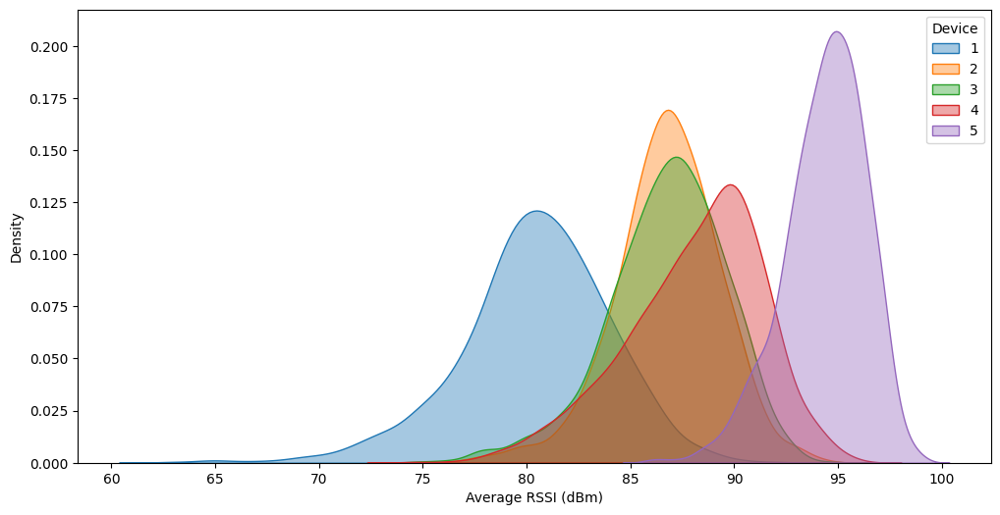

In [ ]:
# KDE (Kernel Density Estimation) Plot

plt.figure(figsize=(12, 6))
for device in data["device_id"].unique():
    sns.kdeplot(data[data["device_id"] == device][rssi_columns].mean(axis=1), label=device, fill=True, alpha=0.4)

# plt.title("RSSI Distribution Across Different Devices (KDE Plot)")
plt.xlabel("Average RSSI (dBm)")
plt.ylabel("Density")
plt.legend(title="Device")
plt.savefig('rssi_device_kde_tju.png', dpi=300, bbox_inches='tight')

plt.show()


<ipython-input-165-b0e15d4de090>:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
<ipython-input-165-b0e15d4de090>:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
<ipython-input-165-b0e15d4de090>:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
<ipython-input-165-b0e15d4de090>:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
<ipython-input-165-b0e15d4de090>:25: UserWarning: set_ticklabels() should only be used with a fixed number of ticks,

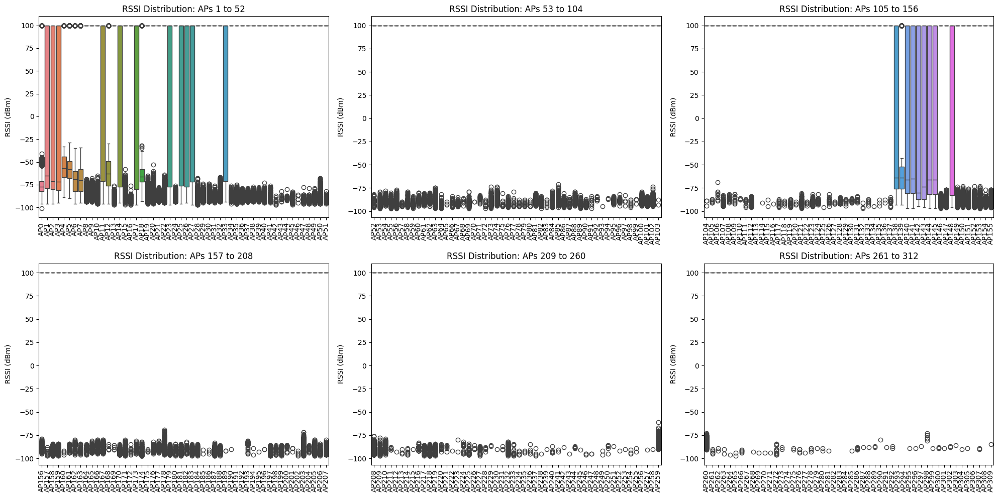

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the number of segments (subplots)
num_segments = 6  # Adjust as needed for clarity
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create subplots (2 rows x 3 columns for better visualization)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))
axes = axes.flatten()  # Flatten for easier indexing

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = rssi_columns[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_data = data[segment_aps]  # Slice relevant columns

    ax = axes[i]
    sns.boxplot(data=segment_data, ax=ax)

    ax.set_title(f"RSSI Distribution: APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_ylabel("RSSI (dBm)")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Remove any unused subplots (if applicable)
for j in range(num_segments, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better readability
plt.tight_layout()
plt.savefig("rssi_boxplot_tju.png", dpi=300, bbox_inches="tight")
plt.show()


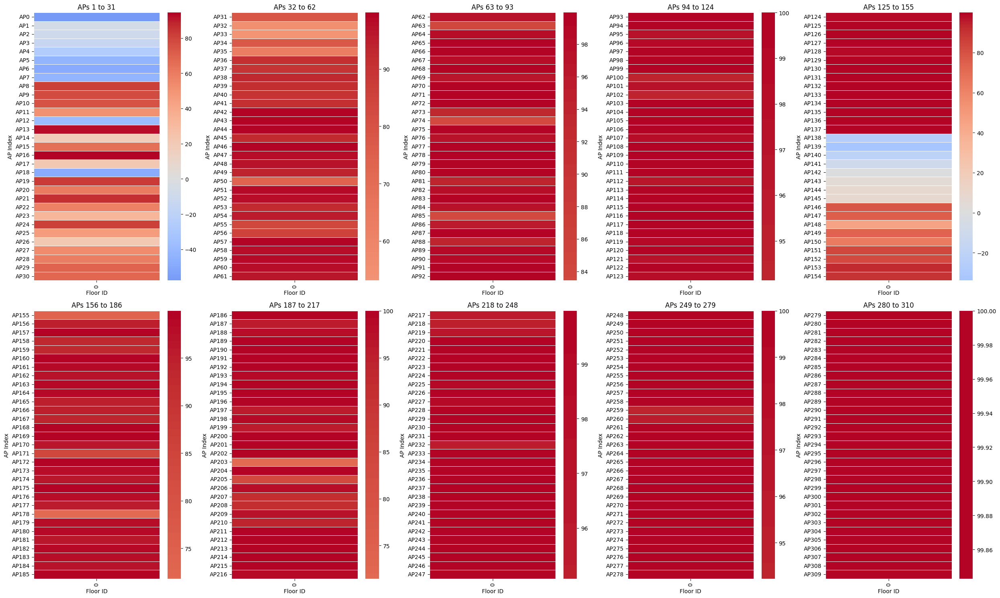

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute mean RSSI per floor and transpose for import matplotlib.pyplot as plt
import seaborn as sns
# Define floor_column as 'floor_id'
floor_column = 'floor_id'

# Select columns that contain "AP" in their names
rssi_columns = [col for col in data.columns if "AP" in col]

# Compute the mean RSSI per floor level
floor_rssi_means = data.groupby(floor_column)[rssi_columns].mean()

# Compute mean RSSI per floor and transpose for plotting
coverage_by_floor = floor_rssi_means.T

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(coverage_by_floor) // num_segments
if len(coverage_by_floor) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Iterate through each segment and plot
for i in range(num_segments):
    # Slice the DataFrame for the current segment using .iloc
    start_index = i * aps_per_segment
    end_index = min((i + 1) * aps_per_segment, len(coverage_by_floor))  # Ensure end index is within bounds
    segment_data = coverage_by_floor.iloc[start_index:end_index] # Use iloc for integer-based indexing

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", center=0.5, linewidths=0.5, ax=ax)
    ax.set_title(f"APs {start_index + 1} to {end_index}")  # Adjust AP range display
    ax.set_xlabel("Floor ID")
    ax.set_ylabel("AP Index")
    ax.tick_params(axis='x', rotation=90)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

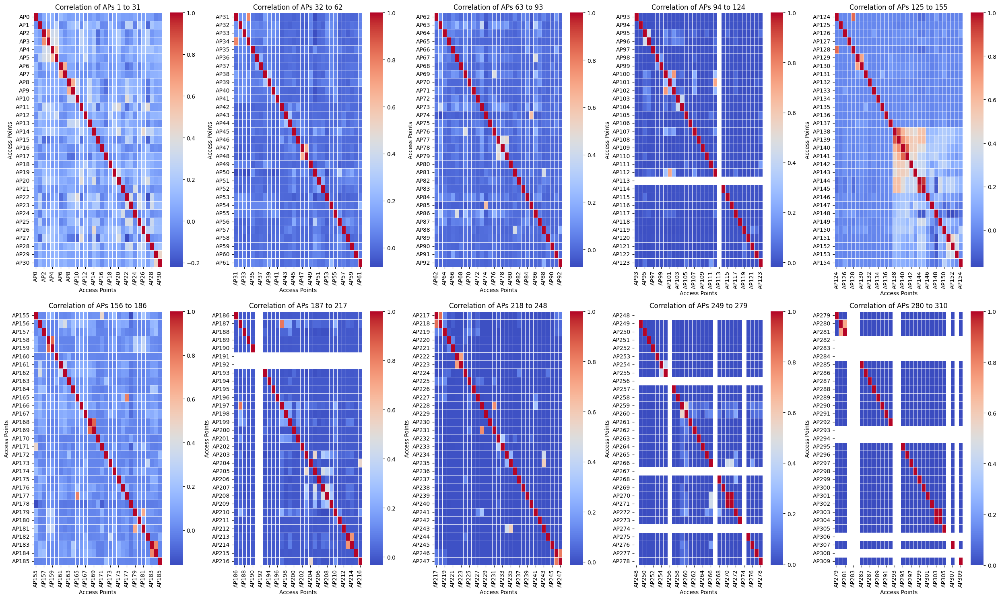

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix
corr_matrix = data[rssi_columns].corr()

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(corr_matrix) // num_segments
if len(corr_matrix) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 15))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Iterate through each segment and plot
for i in range(num_segments):
    # Slice the DataFrame for the current segment
    segment_aps = corr_matrix.index[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_data = corr_matrix.loc[segment_aps, segment_aps]  # Extract the sub-correlation matrix

    ax = axes[i]
    sns.heatmap(segment_data, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5, ax=ax)
    ax.set_title(f"Correlation of APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Access Points")
    ax.set_ylabel("Access Points")
    ax.tick_params(axis='x', rotation=90)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


In [ ]:
# Find the minimum and maximum values for X and Y coordinates
x_min, x_max = data["X"].min(), data["X"].max()
y_min, y_max = data["Y"].min(), data["Y"].max()

print(f"X_min: {x_min}, X_max: {x_max}")
print(f"Y_min: {y_min}, Y_max: {y_max}")


X_min: 0.0, X_max: 22.64
Y_min: 0.0, Y_max: 32.792


In [ ]:
import numpy as np

# Check for NaN values (which may indicate non-detected signals)
nan_counts = data.isna().sum()

# Define wap_columns - assuming WAP columns start with 'WAP'
wap_columns = [col for col in data.columns if 'AP' in col]

# Check if all WAP columns contain -105 dBm (suggesting replacement of non-detected signals)
contains_minus_105 = (data[wap_columns] == -105).any().any()

print("Missing (NaN) values per column:\n", nan_counts[nan_counts > 0])

if contains_minus_105:
    print("⚠️ Some RSSI columns contain -105 dBm, which may represent non-detected signals.")
else:
    print("✅ No -105 dBm values detected in RSSI columns.")

Missing (NaN) values per column:
 Series([], dtype: int64)
✅ No -105 dBm values detected in RSSI columns.


In [ ]:

# Extract only the RSSI columns (assuming they are named as 'WAP1', 'WAP2', etc.)
rssi_columns = [col for col in data.columns if 'AP' in col]  # Adjust if necessary

# Find the minimum RSSI value
min_rssi = data[rssi_columns].min().min()

# Find the maximum RSSI value
max_rssi = data[rssi_columns].max().max()

# Print the range
print(f"Minimum RSSI: {min_rssi} dBm")
print(f"Maximum RSSI: {max_rssi} dBm")
print(f"RSSI Range: {max_rssi - min_rssi} dBm")

Minimum RSSI: -101 dBm
Maximum RSSI: 100 dBm
RSSI Range: 201 dBm


In [ ]:
# Check for missing values and data types
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6752 entries, 0 to 6751
Columns: 316 entries, AP0 to device_id
dtypes: float64(2), int64(314)
memory usage: 16.3 MB
None


In [ ]:
# Summary statistics
print(data.describe())

               AP0          AP1          AP2          AP3          AP4  \
count  6752.000000  6752.000000  6752.000000  6752.000000  6752.000000   
mean    -57.742150    -6.590492    -9.519846   -14.601896   -25.698312   
std      55.674009    86.352228    86.732927    85.761840    67.630820   
min    -101.000000   -96.000000   -96.000000   -95.000000   -89.000000   
25%     -82.000000   -79.000000   -80.000000   -81.000000   -67.000000   
50%     -77.000000   -65.000000   -71.000000   -72.000000   -57.000000   
75%     -71.000000   100.000000   100.000000   100.000000   -44.000000   
max     100.000000   100.000000   100.000000   100.000000   100.000000   

               AP5          AP6          AP7          AP8          AP9  ...  \
count  6752.000000  6752.000000  6752.000000  6752.000000  6752.000000  ...   
mean    -42.445646   -48.270438   -42.505332    81.487855    77.664988  ...   
std      51.472427    61.161796    67.488500    55.356467    60.112683  ...   
min     -90.00000

In [ ]:

print(f'unique Phones:{data["device_id"].unique()}')



unique Phones:[1 2 3 4 5]


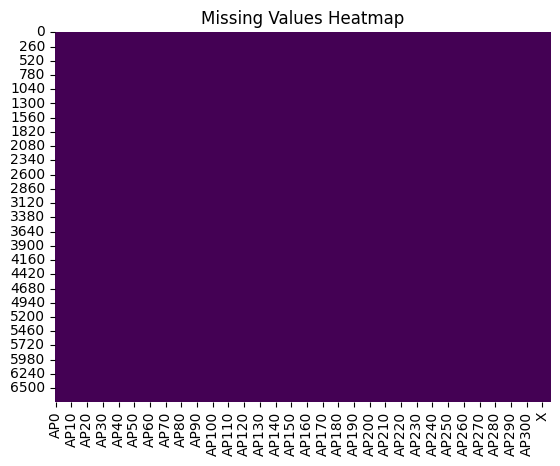

In [ ]:
# Visualize missing data
sns.heatmap(data.isnull(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap")
plt.show()

# Fill missing RSSI values with -105 (a common low RSSI value)
data.fillna(-105, inplace=True)


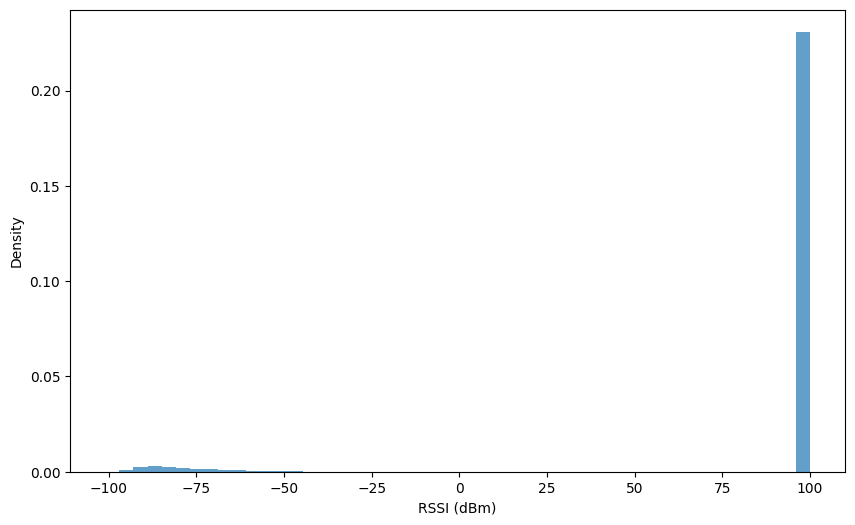

In [ ]:
# RSSI Distribution (Overall)
plt.figure(figsize=(10, 6))
data[rssi_columns].stack().plot(kind='hist', bins=50, density=True, alpha=0.7)
# plt.title("Overall RSSI Distribution cetc331")
plt.xlabel("RSSI (dBm)")
plt.ylabel("Density")
plt.savefig('overall_rssi_distribution_tju.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
len(rssi_columns)

310

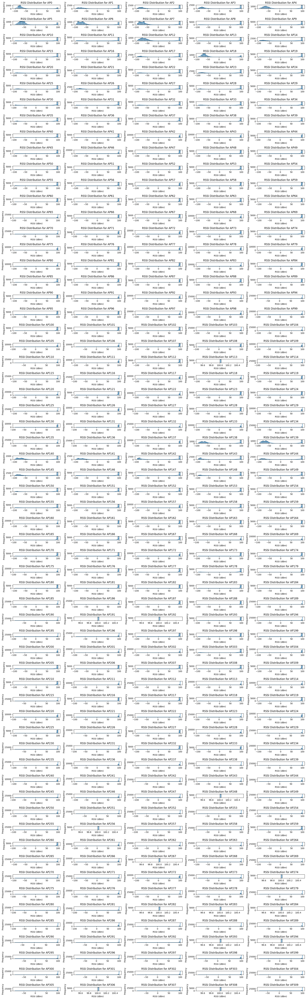

In [ ]:
# RSSI Distribution per WAP

# Set up the subplot grid
fig, axes = plt.subplots(nrows=62, ncols=5, figsize=(20, 65))
axes = axes.flatten()

# Plot each RSSI distribution
for i, wap in enumerate(rssi_columns[:len(rssi_columns)]):
    sns.histplot(data[wap], kde=True, bins=30, ax=axes[i])
    axes[i].set_title(f"RSSI Distribution for {wap}")
    axes[i].set_xlabel("RSSI (dBm)")
    axes[i].set_ylabel("Frequency")

# Adjust layout to prevent overlap
plt.tight_layout()

# Save and display the combined plot
# plt.savefig('rssi_distributions_per_wap_c.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-93-0ec0cc7fd87c>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


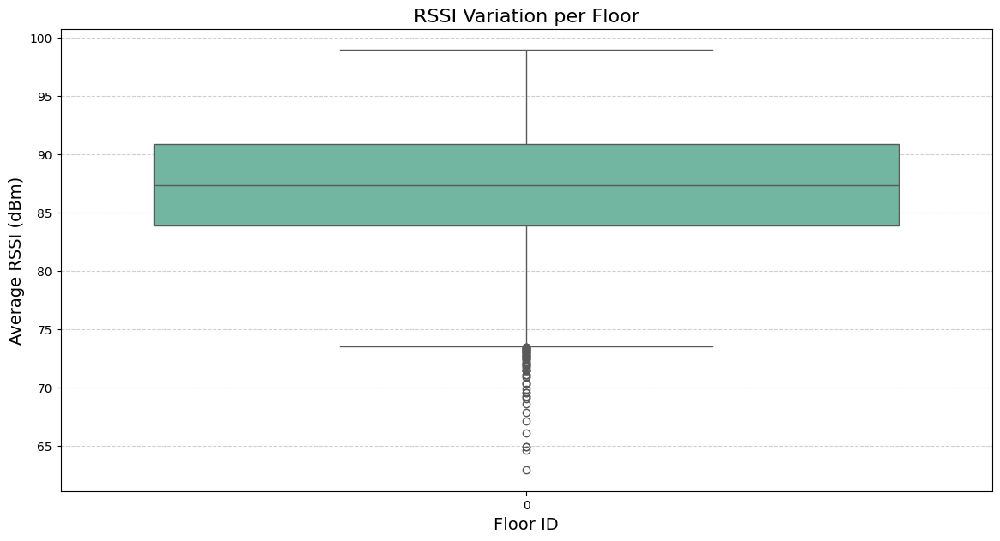

In [ ]:
# Boxplots of RSSI per Room_ID (Signal strength variation per room)
plt.figure(figsize=(14, 7))
sns.boxplot(
    x='floor_id',
    y=data[rssi_columns].mean(axis=1),
    data=data,
    palette='Set2'  # You can choose other palettes like 'Set2', 'coolwarm', 'tab10', etc.
)

plt.title("RSSI Variation per Floor", fontsize=16)
plt.xlabel("Floor ID", fontsize=14)
plt.ylabel("Average RSSI (dBm)", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)
# plt.savefig('rssi_variation_floor_c.png', dpi=300, bbox_inches='tight')
plt.show()

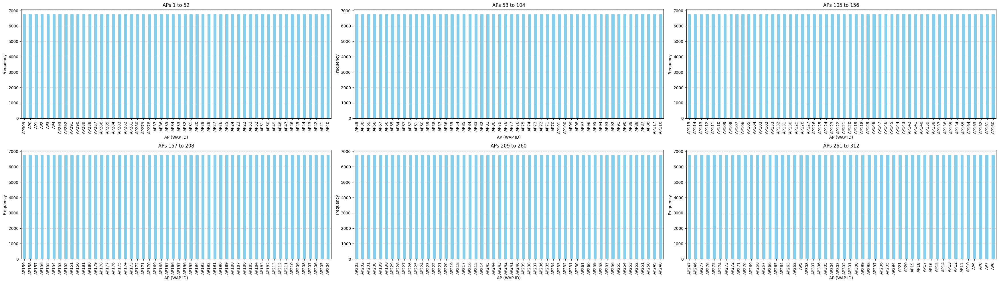

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Compute AP usage (AP detection frequency)
ap_usage = (data[rssi_columns] > -105).sum().sort_values(ascending=False)

# Define the number of segments (subplots)
num_segments = 6  # Fewer segments for better readability in a paper

# Determine how many APs per segment
aps_per_segment = len(ap_usage) // num_segments
if len(ap_usage) % num_segments != 0:
    aps_per_segment += 1

# Create subplots with 2 rows and 3 columns (for better paper formatting)
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(35, 10))
axes = axes.flatten()[:num_segments]  # Limit to num_segments

for i in range(num_segments):
    # Get the segment of APs
    segment_aps = ap_usage.index[i * aps_per_segment: (i + 1) * aps_per_segment]
    segment_values = ap_usage[i * aps_per_segment: (i + 1) * aps_per_segment]

    ax = axes[i]
    segment_values.plot(kind='bar', color='skyblue', ax=ax)

    # # Annotate bars with values
    # for p in ax.patches:
    #     ax.annotate(
    #         str(int(p.get_height())),
    #         (p.get_x() + p.get_width() / 2., p.get_height()),
    #         ha='center', va='bottom', fontsize=9, xytext=(0, 5), rotation=90,
    #         textcoords='offset points'
    #     )

    ax.set_title(f"APs {i * aps_per_segment + 1} to {(i + 1) * aps_per_segment}")
    ax.set_xlabel("AP (WAP ID)")
    ax.set_ylabel("Frequency")
    ax.tick_params(axis='x', rotation=90)
    ax.grid(axis='y', linestyle='--', alpha=0.6)

# Remove unused subplots (if any)
for j in range(num_segments, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout for better readability
plt.tight_layout()

# Save and show
plt.savefig('ap_detection_frequency_tju.png', dpi=300, bbox_inches='tight')
plt.show()


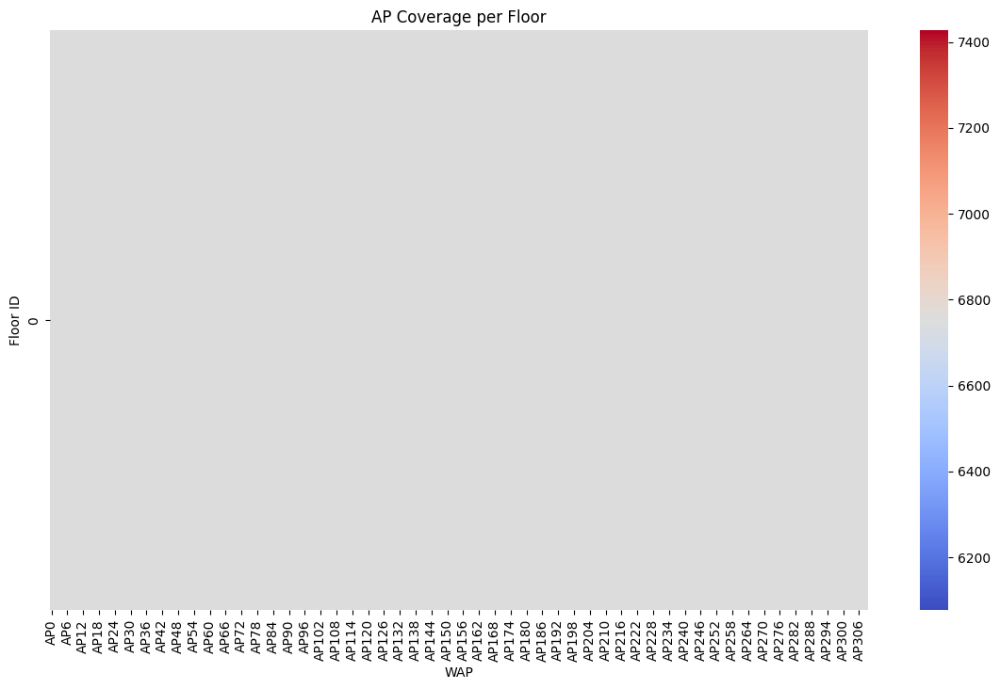

In [ ]:

# AP coverage heatmap per Room
room_ap_coverage = data.groupby('floor_id')[rssi_columns].apply(lambda x: (x > -105).sum())
plt.figure(figsize=(14, 8))
sns.heatmap(room_ap_coverage, annot=False, cmap='coolwarm')
plt.title("AP Coverage per Floor")
plt.xlabel("WAP")
plt.ylabel("Floor ID")
plt.savefig('ap_coverage_per_floor_c.png', dpi=300, bbox_inches='tight')
plt.show()

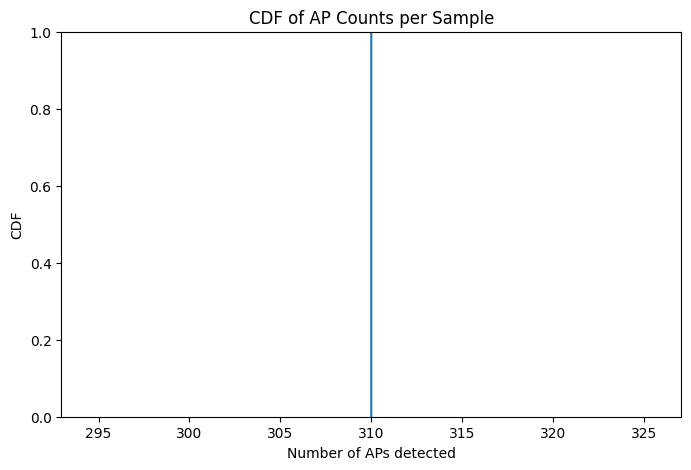

In [ ]:
# Cumulative Distribution Function (CDF) of AP counts per sample
data["AP_count"] = (data[rssi_columns] > -105).sum(axis=1)
plt.figure(figsize=(8, 5))
sns.ecdfplot(data["AP_count"])
plt.title("CDF of AP Counts per Sample")
plt.xlabel("Number of APs detected")
plt.ylabel("CDF")
plt.savefig('cdf_ap_counts_c.png', dpi=300, bbox_inches='tight')
plt.show()

Potential Outliers:
         AP0    AP1    AP2    AP3    AP4    AP5    AP6    AP7    AP8    AP9  \
0       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN  100.0    NaN   
2       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
3       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
4       NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
6747    NaN    NaN  100.0  100.0    NaN    NaN  100.0    NaN  100.0  100.0   
6748    NaN  100.0    NaN  100.0    NaN    NaN  100.0  100.0    NaN  100.0   
6749  100.0    NaN    NaN    NaN    NaN    NaN  100.0  100.0    NaN    NaN   
6750    NaN    NaN  100.0  100.0  100.0  100.0  100.0  100.0  100.0  100.0   
6751    NaN    NaN  100.0    NaN    NaN    NaN  100.0  100.0    NaN    NaN   

      ...  AP301  AP302  AP303  AP304  AP3

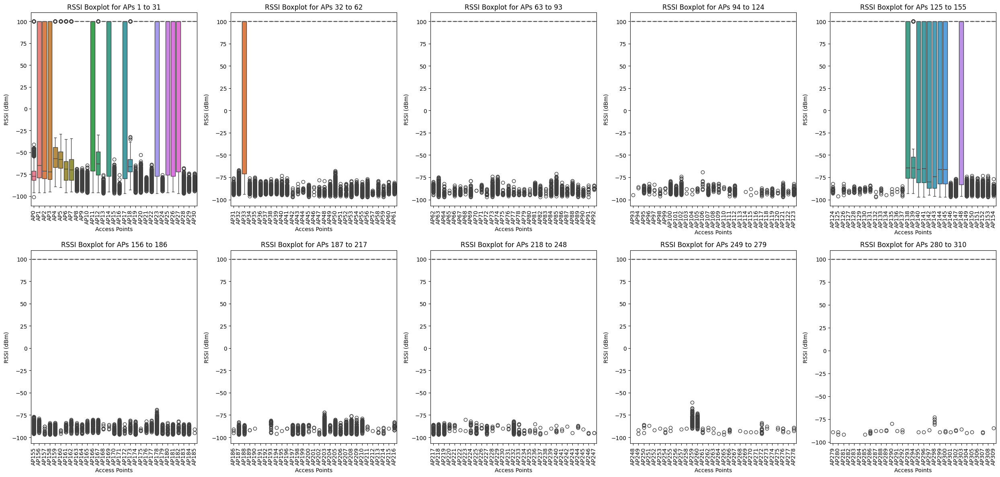

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# Outlier Detection in RSSI Values
# Outlier Detection in RSSI Values
dataa = data.copy()
dataa.drop(columns=["X"	,"Y",	"Z",	"floor_id",	"building_id"	,"device_id"], inplace=True)

# Identify extreme outliers
outliers = dataa[(dataa[rssi_columns] < -100) | (dataa[rssi_columns] > 0)]
print("Potential Outliers:\n", outliers)

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 12))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Iterate through each segment and plot
for i in range(num_segments):
    # Slice the columns (APs) for the current segment
    segment_aps = rssi_columns[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_data = data[segment_aps]

    ax = axes[i]
    sns.boxplot(data=segment_data, ax=ax)
    ax.set_title(f"RSSI Boxplot for APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Access Points")
    ax.set_ylabel("RSSI (dBm)")
    ax.tick_params(axis='x', rotation=90)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()





RSSI Data Summary:
                AP0          AP1          AP2          AP3          AP4  \
count  6752.000000  6752.000000  6752.000000  6752.000000  6752.000000   
mean    -57.742150    -6.590492    -9.519846   -14.601896   -25.698312   
std      55.674009    86.352228    86.732927    85.761840    67.630820   
min    -101.000000   -96.000000   -96.000000   -95.000000   -89.000000   
25%     -82.000000   -79.000000   -80.000000   -81.000000   -67.000000   
50%     -77.000000   -65.000000   -71.000000   -72.000000   -57.000000   
75%     -71.000000   100.000000   100.000000   100.000000   -44.000000   
max     100.000000   100.000000   100.000000   100.000000   100.000000   

               AP5          AP6          AP7          AP8          AP9  ...  \
count  6752.000000  6752.000000  6752.000000  6752.000000  6752.000000  ...   
mean    -42.445646   -48.270438   -42.505332    81.487855    77.664988  ...   
std      51.472427    61.161796    67.488500    55.356467    60.112683  ...

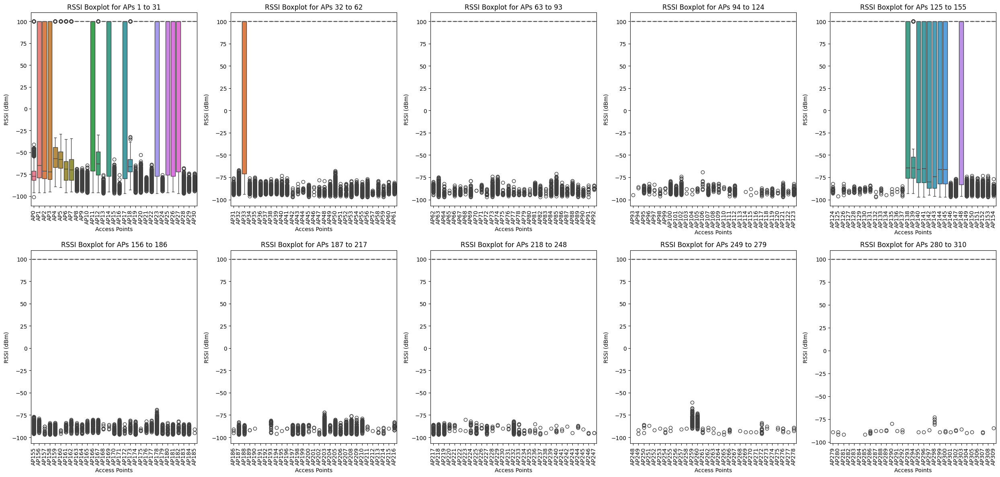

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Summary statistics of RSSI values
print("\nRSSI Data Summary:\n", data[rssi_columns].describe())

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 12))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Iterate through each segment and plot
for i in range(num_segments):
    # Slice the columns (APs) for the current segment
    segment_aps = rssi_columns[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_data = data[segment_aps]

    ax = axes[i]
    sns.boxplot(data=segment_data, ax=ax)
    ax.set_title(f"RSSI Boxplot for APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Access Points")
    ax.set_ylabel("RSSI (dBm)")
    ax.tick_params(axis='x', rotation=90)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


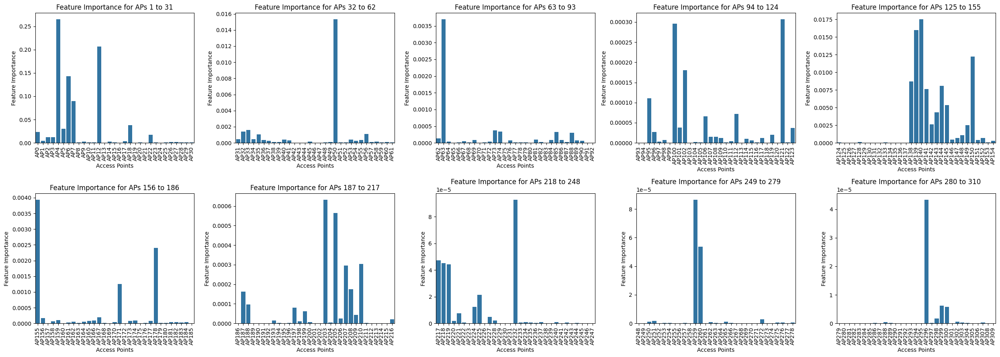

In [ ]:
#  Feature Importance for Localization

from sklearn.ensemble import RandomForestRegressor

# Prepare dataset
X = data[rssi_columns]  # RSSI values
y = data[["X", "Y"]]  # Target variable

# Train a simple classifier to get feature importance
clf = RandomForestRegressor(n_estimators=100, random_state=42)
clf.fit(X, y)
# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 9))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Iterate through each segment and plot feature importance
for i in range(num_segments):
    # Slice the columns (APs) for the current segment
    segment_aps = rssi_columns[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_importances = clf.feature_importances_[i*aps_per_segment : (i+1)*aps_per_segment]

    ax = axes[i]
    sns.barplot(x=segment_aps, y=segment_importances, ax=ax)
    ax.set_title(f"Feature Importance for APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Access Points")
    ax.set_ylabel("Feature Importance")
    ax.tick_params(axis='x', rotation=90)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()



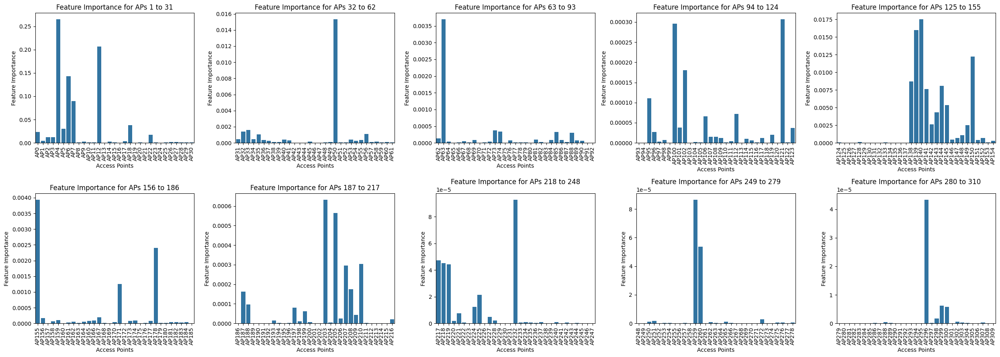

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the number of segments (subplots)
num_segments = 10

# Determine how many APs per segment
aps_per_segment = len(rssi_columns) // num_segments
if len(rssi_columns) % num_segments != 0:
    aps_per_segment += 1

# Create a figure with 2 rows and 5 columns of subplots
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(25, 9))
axes = axes.flatten()  # Flatten the 2D array for easy iteration

# Iterate through each segment and plot feature importance
for i in range(num_segments):
    # Slice the columns (APs) for the current segment
    segment_aps = rssi_columns[i*aps_per_segment : (i+1)*aps_per_segment]
    segment_importances = clf.feature_importances_[i*aps_per_segment : (i+1)*aps_per_segment]

    ax = axes[i]
    sns.barplot(x=segment_aps, y=segment_importances, ax=ax)
    ax.set_title(f"Feature Importance for APs {i*aps_per_segment + 1} to {(i+1)*aps_per_segment}")
    ax.set_xlabel("Access Points")
    ax.set_ylabel("Feature Importance")
    ax.tick_params(axis='x', rotation=90)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


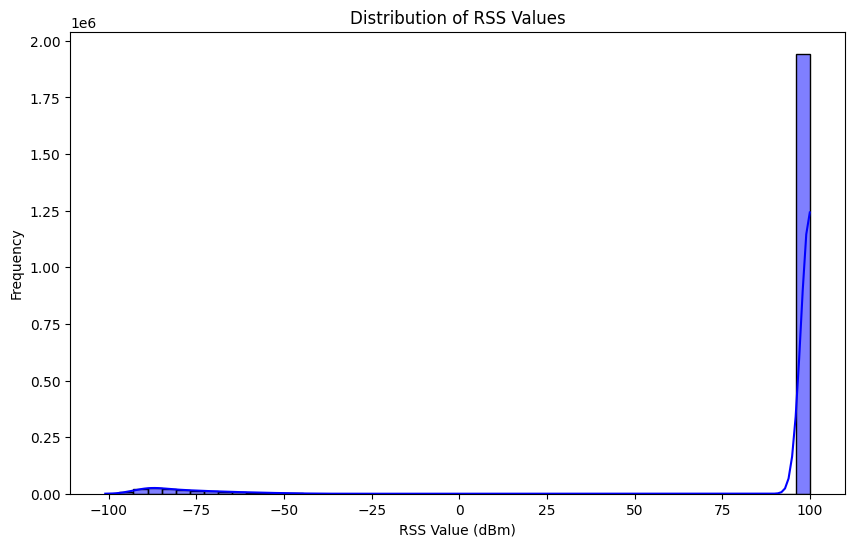

In [ ]:
# Flatten RSS values into a single array for visualization
rss_values = data[rssi_columns].values.flatten()

# Plot the distribution of RSS values
plt.figure(figsize=(10, 6))
sns.histplot(rss_values, bins=50, kde=True, color='blue')
plt.title('Distribution of RSS Values')
plt.xlabel('RSS Value (dBm)')
plt.ylabel('Frequency')
plt.show()


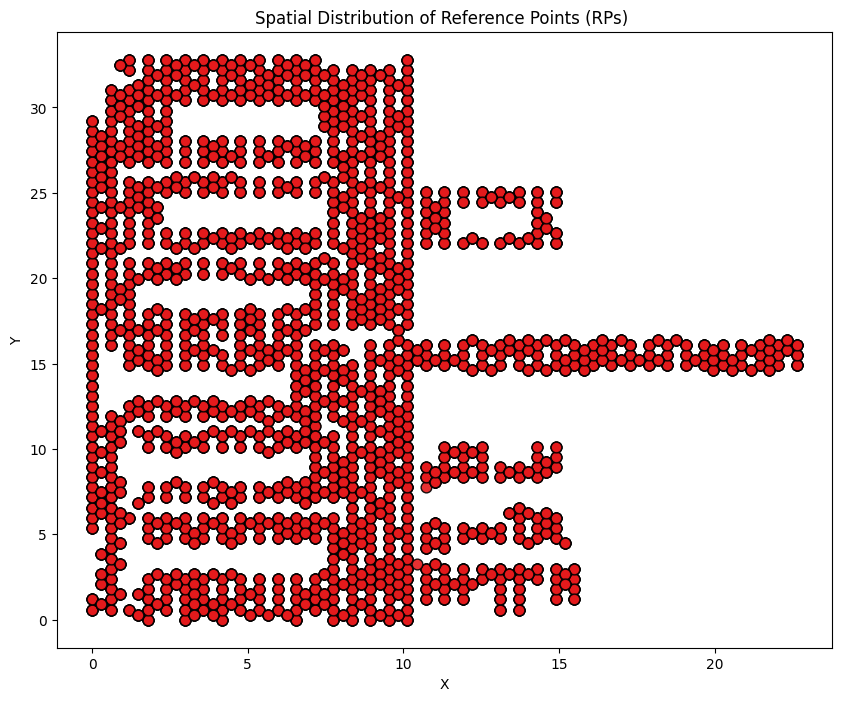

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert floors to integer values
data["floor_id"] = data["floor_id"].astype(int)

# Create a 2D figure
fig, ax = plt.subplots(figsize=(10, 8))

# Define a distinct color map for floors using a high-contrast palette
floor_colors = sns.color_palette("Set1", n_colors=data["floor_id"].nunique())
markers = ["o", "s", "^", "D", "X", "*"]  # More variety in markers

# Plot each floor separately with distinct colors and markers
for i, floor in enumerate(sorted(data["floor_id"].unique())):
    subset = data[data["floor_id"] == floor]
    ax.scatter(subset["X"], subset["Y"],
               label=f"Floor {floor}", color=floor_colors[i], alpha=0.9,
               edgecolors="k", marker=markers[i % len(markers)], s=60)  # Increase marker size

# Labels and title
ax.set_title("Spatial Distribution of Reference Points (RPs) ")
ax.set_xlabel("X")
ax.set_ylabel("Y")

# Add a legend with clear spacing
# ax.legend(title="Floor ID", loc="upper right", bbox_to_anchor=(1.2, 1))

# Save figure
plt.savefig("_tju.png", dpi=300, bbox_inches="tight")
plt.show()



Devices used for collection: [1 2 3 4 5]


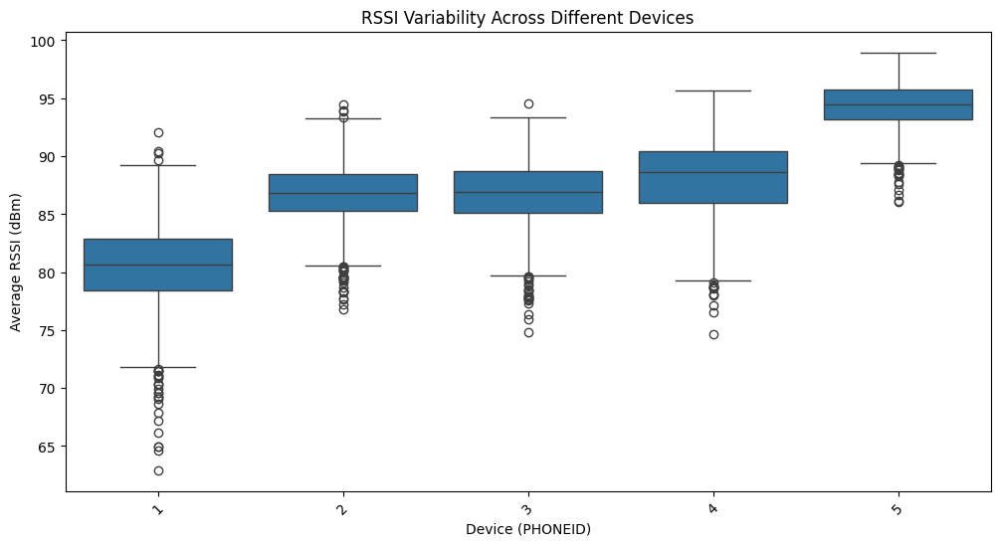

In [ ]:
#  Device Impact on RSSI Measurements
# Unique devices used
print("\nDevices used for collection:", data["device_id"].unique())

# Boxplot of RSSI variation across different devices
plt.figure(figsize=(12, 6))
sns.boxplot(x=data["device_id"], y=data[rssi_columns].mean(axis=1))
plt.xticks(rotation=45)
plt.title("RSSI Variability Across Different Devices")
plt.xlabel("Device (PHONEID)")
plt.ylabel("Average RSSI (dBm)")
plt.show()



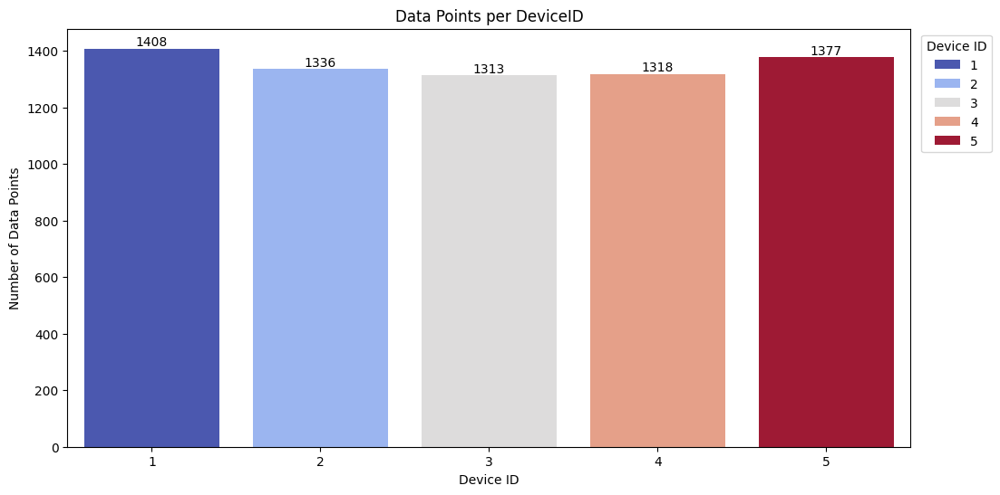

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count data points per FloorID and SceneID
floor_scene_counts = data.groupby(["floor_id", "device_id"]).size().reset_index(name="Count")

# Set figure size
plt.figure(figsize=(12, 6))

# Create bar plot
ax = sns.barplot(x="device_id", y="Count", hue="device_id", data=floor_scene_counts, palette="coolwarm")

# Add value labels on bars (only if count > 0)
for p in ax.patches:
    if p.get_height() > 0:  # Ensure only non-zero bars are labeled
        ax.annotate(f"{int(p.get_height())}",
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10)

# Labels and title
plt.xlabel("Device ID")
plt.ylabel("Number of Data Points")
plt.title("Data Points per DeviceID")
plt.legend(title="Device ID", bbox_to_anchor=(1.005, 1), loc="upper left")

# Show plot
plt.show()


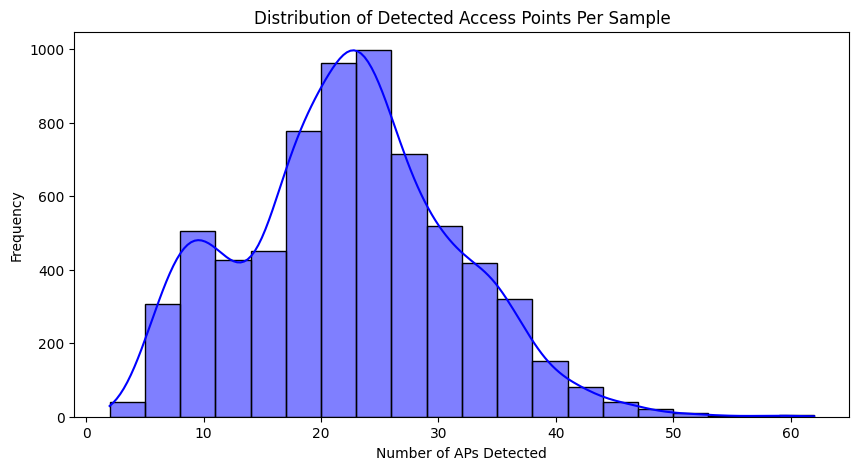

In [ ]:
# Count detected APs per sample (non-zero RSSI values)
data["AP_count"] = (data[rssi_columns] != 100).sum(axis=1)

# Histogram of AP counts
plt.figure(figsize=(10, 5))
sns.histplot(data["AP_count"], bins=20, kde=True, color="blue")
plt.title("Distribution of Detected Access Points Per Sample")
plt.xlabel("Number of APs Detected")
plt.ylabel("Frequency")
plt.show()
